In [2]:
import sys
import os

sys.path.append(r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM")
from GLM_regression import *
from functions_plotting_reconstruction_MSE import *
import pickle
import os
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
import slicetca

import utils as ut
import plot as pt
plt.rcParams.update({'font.size': 12,
                     'axes.spines.right': False,
                     'axes.spines.top':   False,
                     'legend.frameon':    False,})

%load_ext autoreload
%autoreload 

C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\utils.py:7: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [85]:
import sys
from scipy.stats import sem
sys.path.append(r'C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM')

from utils_TCA_clustering_scratchpad import *


In [577]:

import h5py
import os


def load_new_NDNF_data(filepath, normalize=True):
    
    num_spatial_bins = 10
    position_matrix = np.zeros((50, num_spatial_bins))
    bin_size = 50 // num_spatial_bins
    for i in range(num_spatial_bins):
        position_matrix[i * bin_size:(i + 1) * bin_size, i] = 1

    with h5py.File(filepath, 'r') as f:
        animal_group = f['animal']  # access 'animal'

        shiftR_refs = animal_group['ShiftR'][:]
        shiftRunning_refs = animal_group['ShiftRunning'][:]
        shiftL_refs = animal_group['ShiftL'][:]
        shiftV_refs = animal_group['ShiftV'][:]

        factors_dict = {}
        activity_dict = {}

        for animal_idx in range(len(animal_group['ShiftR'])):  # 18 experiments
            delta_f = np.array(f[shiftR_refs[animal_idx][0]])
            velocity = np.array(f[shiftRunning_refs[animal_idx][0]])
            lick_rate = np.array(f[shiftL_refs[animal_idx][0]])
            reward_loc = np.array(f[shiftV_refs[animal_idx][0]])

            delta_f = delta_f.transpose(0, 2, 1)
            if delta_f.shape[2] > 1:
                delta_f = delta_f[:, :, 1:]

            # Make sure the number of trials matches
            num_trials = min(delta_f.shape[1], velocity.shape[0], lick_rate.shape[0], reward_loc.shape[0])
            delta_f = delta_f[:, :num_trials, :]
            velocity = velocity[:, :num_trials]
            lick_rate = lick_rate[:, :num_trials]
            reward_loc = reward_loc[:, :num_trials]

            nan_trials_licks = np.any(np.isnan(lick_rate), axis=0)
            nan_trials_reward = np.any(np.isnan(reward_loc), axis=0)
            nan_trials_velocity = np.any(np.isnan(velocity), axis=0)
            nan_trials_activity = np.any(np.isnan(delta_f), axis=(0,2))
    #         print(nan_trials_activity)
            nan_trials = nan_trials_licks | nan_trials_reward | nan_trials_velocity | nan_trials_activity

            animal_key = f'animal_{animal_idx + 1}'
            factors_dict[animal_key] = {"Licks": lick_rate[:, ~nan_trials],
                                        "Reward_loc": reward_loc[:, ~nan_trials],
                                        "Velocity": velocity[:, ~nan_trials]}

            num_trials = factors_dict[animal_key]["Velocity"].shape[1]
            for bin_idx in range(num_spatial_bins):
                bin_key = f"Position_{bin_idx + 1}"
                factors_dict[animal_key][bin_key] = np.tile(position_matrix[:, bin_idx][:, np.newaxis], num_trials) # Copy the position variable for each trial

            if normalize: # Normalize behavioral factors to [0,1]
                for var_name in factors_dict[animal_key]:
                    factors_dict[animal_key][var_name] = (factors_dict[animal_key][var_name] - np.min(factors_dict[animal_key][var_name])) / (np.max(factors_dict[animal_key][var_name]) - np.min(factors_dict[animal_key][var_name]))

            activity_dict[animal_key] = {}
            for neuron_idx in range(delta_f.shape[2]):
                neuron_activity = delta_f[:, :, neuron_idx]
                if np.all(np.isnan(neuron_activity)) or np.all(neuron_activity == 0): # Don't save empty/silent neurons
                    continue
                cleaned_activity = neuron_activity[:, ~nan_trials]

                if normalize:  # Z-score the neuron activity (df/f)
                    cleaned_activity = (cleaned_activity - np.mean(cleaned_activity)) / np.std(cleaned_activity)

                neuron_key = f'cell_{neuron_idx + 1}'
                activity_dict[animal_key][neuron_key] = cleaned_activity

    return activity_dict, factors_dict

file_path = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM"
filename = "NDNFanalC"
filepath = os.path.join(file_path, "datasets", filename + ".mat")
        
activity_dict, factors_dict = load_new_NDNF_data(filepath, normalize=True)
        


ValueError: zero-size array to reduction operation minimum which has no identity

delta_f.shape after (50, 352, 11)
(50, 350)
cleaned_activity.shape() (50, 350)
cleaned_activity.shape() (50, 350)
cleaned_activity.shape() (50, 350)
cleaned_activity.shape() (50, 350)
cleaned_activity.shape() (50, 350)
cleaned_activity.shape() (50, 350)
cleaned_activity.shape() (50, 350)
cleaned_activity.shape() (50, 350)
cleaned_activity.shape() (50, 350)
cleaned_activity.shape() (50, 350)
delta_f.shape after (50, 129, 9)
(50, 127)
cleaned_activity.shape() (50, 127)
cleaned_activity.shape() (50, 127)
cleaned_activity.shape() (50, 127)
cleaned_activity.shape() (50, 127)
cleaned_activity.shape() (50, 127)
cleaned_activity.shape() (50, 127)
cleaned_activity.shape() (50, 127)
cleaned_activity.shape() (50, 127)
delta_f.shape after (50, 256, 8)
(50, 207)
cleaned_activity.shape() (50, 207)
cleaned_activity.shape() (50, 207)
cleaned_activity.shape() (50, 207)
cleaned_activity.shape() (50, 207)
cleaned_activity.shape() (50, 207)
cleaned_activity.shape() (50, 207)
cleaned_activity.shape() (50, 

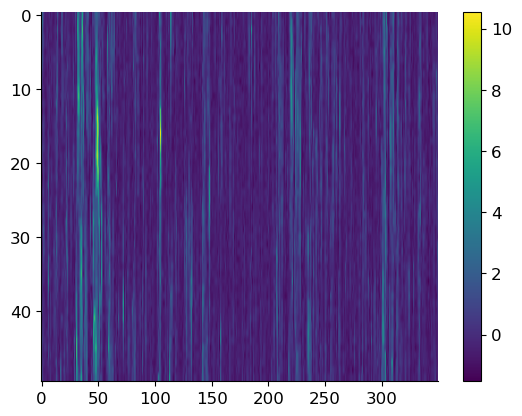

In [639]:
import os
import h5py
import mat73
import numpy as np

def preprocess_data2(filepath, normalize=True, new_NDNF=False):
    factors_dict = {}
    activity_dict = {}

    if new_NDNF:
        with h5py.File(filepath, 'r') as f:
            animal_group = f['animal']
            shiftR_refs = animal_group['ShiftR'][:]
            shiftRunning_refs = animal_group['ShiftRunning'][:]
            shiftL_refs = animal_group['ShiftL'][:]
            shiftV_refs = animal_group['ShiftV'][:]

            for animal_idx in range(len(shiftR_refs)):  
                delta_f = np.array(f[shiftR_refs[animal_idx][0]])
                delta_f = delta_f.swapaxes(0, 2)  
                print(f"delta_f.shape after {delta_f.shape}")
                velocity = np.array(f[shiftRunning_refs[animal_idx][0]]).T
                lick_rate = np.array(f[shiftL_refs[animal_idx][0]]).T
                reward_loc = np.array(f[shiftV_refs[animal_idx][0]]).T

                if delta_f.shape[1] > 1:
                    delta_f = delta_f[:, 1:, :]  # remove duplicate neuron

                num_trials = min(delta_f.shape[1], velocity.shape[1], lick_rate.shape[1], reward_loc.shape[1])

                delta_f = delta_f[:, :num_trials, :]
                velocity = velocity[:, :num_trials]
                lick_rate = lick_rate[:, :num_trials]
                reward_loc = reward_loc[:, :num_trials]

                
                nan_trials = (
                np.any(np.isnan(lick_rate), axis=0) |
                np.any(np.isnan(reward_loc), axis=0) |
                np.any(np.isnan(velocity), axis=0) |
                np.any(np.isnan(delta_f), axis=(0,2))
            )
                
#                 nan_trials = (
#                     np.any(np.isnan(lick_rate), axis=1) |
#                     np.any(np.isnan(reward_loc), axis=1) |
#                     np.any(np.isnan(velocity), axis=1) |
#                     np.any(np.isnan(delta_f), axis=(0,2))
#                 )

                animal_key = f'animal_{animal_idx+1}'
                factors_dict[animal_key] = {
                    "Licks": lick_rate[:, ~nan_trials],
                    "Reward_loc": reward_loc[:, ~nan_trials],
                    "Velocity": velocity[:, ~nan_trials]
                }
        
                print(factors_dict[animal_key]["Licks"].shape)

                    
                if normalize:
                    for var in factors_dict[animal_key]:
                        factors_dict[animal_key][var] = ((factors_dict[animal_key][var] - np.min(factors_dict[animal_key][var])) /
                            (np.max(factors_dict[animal_key][var]) - np.min(factors_dict[animal_key][var])))
                
        
                activity_dict[animal_key] = {}
                for neuron_idx in range(delta_f.shape[2]):  # loop over neurons
                    neuron_activity = delta_f[:, :, neuron_idx]  # (trial, bin)
                    if np.all(np.isnan(neuron_activity)) or np.all(neuron_activity == 0):
                        continue
                        
                    
                    cleaned_activity = neuron_activity[:, ~nan_trials]
                    if normalize:
                        cleaned_activity = (cleaned_activity - np.mean(cleaned_activity)) / np.std(cleaned_activity)
                    neuron_key = f'cell_{neuron_idx+1}'
                    print(f"cleaned_activity.shape() {cleaned_activity.shape}")
                    activity_dict[animal_key][neuron_key] = cleaned_activity

    
    
#                 activity_dict[animal_key] = {}
#                 for neuron_idx in range(delta_f.shape[0]):
#                     neuron_activity = delta_f[neuron_idx, :, :]
#                     if np.all(np.isnan(neuron_activity)) or np.all(neuron_activity == 0):
#                         continue
#                     cleaned_activity = neuron_activity[:, ~nan_trials]
#                     if normalize:
#                         cleaned_activity = (cleaned_activity - np.mean(cleaned_activity)) / np.std(cleaned_activity)
#                     neuron_key = f'cell_{neuron_idx+1}'
#                     activity_dict[animal_key][neuron_key] = cleaned_activity

    else:
        data_dict = mat73.loadmat(filepath)

        # Setup position variables
        num_spatial_bins = 10
        position_matrix = np.zeros((50, num_spatial_bins))
        bin_size = 50 // num_spatial_bins
        for i in range(num_spatial_bins):
            position_matrix[i * bin_size:(i+1) * bin_size, i] = 1

        for animal_idx, (delta_f, velocity, lick_rate, reward_loc) in enumerate(
            zip(data_dict['animal']['ShiftR'], data_dict['animal']['ShiftRunning'], data_dict['animal']['ShiftLrate'], data_dict['animal']['ShiftV'])):
            
            print(delta_f.shape)
            print(velocity.shape)
            print(lick_rate.shape)
            print(reward_loc.shape)
            
            num_trials = min(delta_f.shape[1], lick_rate.shape[1], reward_loc.shape[1], velocity.shape[1])
            delta_f = delta_f[:, :num_trials, :]
            velocity = velocity[:, :num_trials]
            lick_rate = lick_rate[:, :num_trials]
            reward_loc = reward_loc[:, :num_trials]

            nan_trials = (
                np.any(np.isnan(lick_rate), axis=0) |
                np.any(np.isnan(reward_loc), axis=0) |
                np.any(np.isnan(velocity), axis=0) |
                np.any(np.isnan(delta_f), axis=(0,2))
            
            )
            

            animal_key = f'animal_{animal_idx+1}'
            factors_dict[animal_key] = {
                "Licks": lick_rate[:, ~nan_trials],
                "Reward_loc": reward_loc[:, ~nan_trials],
                "Velocity": velocity[:, ~nan_trials]
            }

            # Add position info
            num_trials = factors_dict[animal_key]["Velocity"].shape[1]
            for bin_idx in range(num_spatial_bins):
                bin_key = f"Position_{bin_idx+1}"
                factors_dict[animal_key][bin_key] = np.tile(position_matrix[:, bin_idx][:, np.newaxis], num_trials)

            if normalize:
                for var in factors_dict[animal_key]:
                    factors_dict[animal_key][var] = (
                        (factors_dict[animal_key][var] - np.min(factors_dict[animal_key][var])) /
                        (np.max(factors_dict[animal_key][var]) - np.min(factors_dict[animal_key][var]))
                    )

            activity_dict[animal_key] = {}
            for neuron_idx in range(delta_f.shape[2]):
                neuron_activity = delta_f[:, :, neuron_idx]
                if np.all(np.isnan(neuron_activity)) or np.all(neuron_activity == 0):
                    continue
                cleaned_activity = neuron_activity[:, ~nan_trials]
                if normalize:
                    cleaned_activity = (cleaned_activity - np.mean(cleaned_activity)) / np.std(cleaned_activity)
                neuron_key = f'cell_{neuron_idx+1}'
                activity_dict[animal_key][neuron_key] = cleaned_activity

                
    return activity_dict, factors_dict



file_path = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM"
filename = "NDNFanalC"
# filename = "EC_GLM"
filepath = os.path.join(file_path, "datasets", filename + ".mat")
        
activity_dict, factors_dict = preprocess_data2(filepath, normalize=True, new_NDNF=True)
        
datas = activity_dict['animal_1']["cell_2"]
print(f"datas.shape {datas.shape}")

plt.imshow(datas, aspect='auto')
plt.colorbar()
plt.show()


In [4]:

base_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM"

filename = "SSTindivsomata_GLM"

filepath = os.path.join(base_dir, "datasets", filename+".mat")
activity_dict, factors_dict = ut.preprocess_data(filepath)
filtered_factors_dict = ut.subset_variables_from_data(factors_dict, variables_to_keep=["Velocity"])

GLM_params, predicted_activity_dict = ut.fit_GLM_population(filtered_factors_dict, activity_dict, quintile=None, regression='linear')
residual_activity_dict_SST = ut.get_residual_activity_dict(activity_dict, predicted_activity_dict)


filename = "NDNFindivsomata_GLM"

filepath = os.path.join(base_dir, "datasets", filename+".mat")
activity_dict, factors_dict = ut.preprocess_data(filepath)
filtered_factors_dict = ut.subset_variables_from_data(factors_dict, variables_to_keep=["Velocity"])

GLM_params, predicted_activity_dict = ut.fit_GLM_population(filtered_factors_dict, activity_dict, quintile=None, regression='linear')
residual_activity_dict_NDNF = ut.get_residual_activity_dict(activity_dict, predicted_activity_dict)


filename = "EC_GLM"

filepath = os.path.join(base_dir, "datasets", filename+".mat")
activity_dict, factors_dict = ut.preprocess_data(filepath)
filtered_factors_dict = ut.subset_variables_from_data(factors_dict, variables_to_keep=["Velocity"])

GLM_params, predicted_activity_dict = ut.fit_GLM_population(filtered_factors_dict, activity_dict, quintile=None, regression='linear')
residual_activity_dict_EC = ut.get_residual_activity_dict(activity_dict, predicted_activity_dict)


mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_SST_model_ranks20_kmeans_reassign_x00_cell"
cell_SST_model_ranks20_kmeans_reassign_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_EC_model_ranks20_kmeans_reassign_x00_cell"
cell_EC_model_ranks20_kmeans_reassign_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_NDNF_model_ranks20_kmeans_reassign_x00_cell"
cell_NDNF_model_ranks20_kmeans_reassign_x00 = get_model_data_per_cell(mse_dir)

In [685]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_SST_model_ranks20_reassign_regkmean_x00_cell"
new_cell_SST_model_ranks20_kmeans_reassign_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_EC_model_ranks20_reassign_regkmean_x00_cell"
new_cell_EC_model_ranks20_kmeans_reassign_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_NDNF_model_ranks20_reassign_regkmean_x00_cell"
new_cell_NDNF_model_ranks20_kmeans_reassign_x00 = get_model_data_per_cell(mse_dir)

Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 5 cells
    Animal 1: 15 cells
    Animal 2: 6 cells
    Animal 3: 4 cells
    Animal 4: 13 cells
    Animal 5: 13 cells
    Animal 6: 3 cells
    Animal 7: 3 cells
    Animal 8: 3 cells
    Animal 9: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 192 cells
    Animal 1: 150 cells
    Animal 2: 154 cells
    Animal 3: 82 cells
    Animal 4: 74 cells
    Animal 5: 64 cells
    Animal 6: 76 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 14 cells
    Animal 1: 14 cells
    Animal 2: 6 cells
    Animal 3: 11 cells


In [732]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_SST_model_ranks20_reassign_umap_regkmean_x00_cell"
new_cell_SST_model_ranks20_kmeans_reassign_UMAP_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_EC_model_ranks20_reassign_umap_regkmean_x00_cell"
new_cell_EC_model_ranks20_kmeans_reassign_UMAP_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_NDNF_model_ranks20_reassign_umap_regkmean_x00_cell"
new_cell_NDNF_model_ranks20_kmeans_reassign_UMAP_x00 = get_model_data_per_cell(mse_dir)

Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 5 cells
    Animal 1: 15 cells
    Animal 2: 6 cells
    Animal 3: 4 cells
    Animal 4: 13 cells
    Animal 5: 13 cells
    Animal 6: 3 cells
    Animal 7: 3 cells
    Animal 8: 3 cells
    Animal 9: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 192 cells
    Animal 1: 150 cells
    Animal 2: 146 cells
    Animal 3: 82 cells
    Animal 4: 74 cells
    Animal 5: 64 cells
    Animal 6: 76 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 14 cells
    Animal 1: 14 cells
    Animal 2: 6 cells
    Animal 3: 11 cells


✅ Found first singleton cluster for 2 cells
✅ Found first singleton cluster for 0 cells
✅ Found first singleton cluster for 32 cells


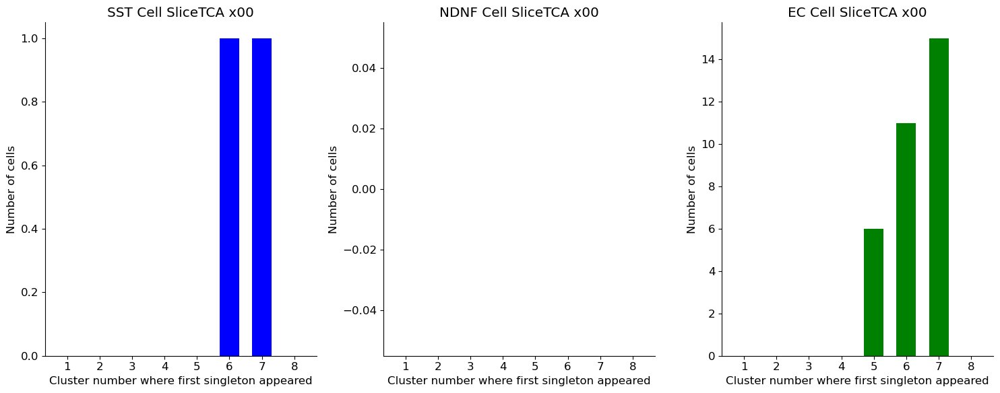

In [696]:
def get_counts_of_first_kmeans_failure(model_dict, rank=20, cluster_range=range(1, 9)):
    cluster_of_first_singletons_dict = {}
    cluster_count_dict = {k: 0 for k in cluster_range}  # initialize 1–8 with 0s

    if rank not in model_dict:
        return cluster_of_first_singletons_dict, cluster_count_dict

    for animal in model_dict[rank]:
        for cell in model_dict[rank][animal]:
            labels_dict = model_dict[rank][animal][cell][1][f"cell_{cell}"]['labels_dict']
            found_singleton = False

            for idx, clusters_chosen in enumerate(labels_dict):
                labels = labels_dict[clusters_chosen]
                unique_vals, counts = np.unique(labels, return_counts=True)
                singleton_labels = unique_vals[counts == 1]

                if len(singleton_labels) > 0 and not found_singleton:
                    cluster_number = int(clusters_chosen.split('_')[-1])
                    print(f"Warning: {len(singleton_labels)} singleton(s) found in {clusters_chosen} for {animal}, cell {cell}")

                    if animal not in cluster_of_first_singletons_dict:
                        cluster_of_first_singletons_dict[animal] = {}
                    cluster_of_first_singletons_dict[animal][cell] = cluster_number

                    if cluster_number in cluster_count_dict:
                        cluster_count_dict[cluster_number] += 1

                    found_singleton = True
                    break

    print(f"✅ Found first singleton cluster for {sum(len(c) for c in cluster_of_first_singletons_dict.values())} cells")
    return cluster_of_first_singletons_dict, cluster_count_dict

                
                
def plot_histogram_from_counts(cluster_count_list):
    
    cluster_count_dict_SST = cluster_count_list[0]
    cluster_count_dict_NDNF = cluster_count_list[1]
    cluster_count_dict_EC = cluster_count_list[2]
    
    fig, axs = plt.subplots(1, 3, figsize=(15,6))
    

    cluster_numbers_SST = sorted(cluster_count_dict_SST.keys())
    counts_SST = [cluster_count_dict_SST[k] for k in cluster_numbers_SST]

    axs[0].bar(cluster_numbers_SST, counts_SST, align='center', width=0.6, color='b')
    axs[0].set_xlabel('Cluster number where first singleton appeared')
    axs[0].set_ylabel('Number of cells')
    axs[0].set_title("SST Cell SliceTCA x00")
    axs[0].set_xticks(cluster_numbers_SST)
    
    cluster_numbers_NDNF = sorted(cluster_count_dict_NDNF.keys())
    counts_NDNF = [cluster_count_dict_NDNF[k] for k in cluster_numbers_NDNF]

    axs[1].bar(cluster_numbers_NDNF, counts_NDNF, align='center', width=0.6, color='orange')
    axs[1].set_xlabel('Cluster number where first singleton appeared')
    axs[1].set_ylabel('Number of cells')
    axs[1].set_title("NDNF Cell SliceTCA x00")
    axs[1].set_xticks(cluster_numbers_NDNF)
    
    cluster_numbers_EC = sorted(cluster_count_dict_EC.keys())
    counts_EC = [cluster_count_dict_EC[k] for k in cluster_numbers_EC]

    axs[2].bar(cluster_numbers_EC, counts_EC, align='center', width=0.6, color='g')
    axs[2].set_xlabel('Cluster number where first singleton appeared')
    axs[2].set_ylabel('Number of cells')
    axs[2].set_title("EC Cell SliceTCA x00")
    axs[2].set_xticks(cluster_numbers_EC)

    plt.tight_layout()
    
    plt.show()



dict_sst, counts_sst = get_counts_of_first_kmeans_failure(new_cell_SST_model_ranks20_kmeans_reassign_x00)
dict_ndnf, counts_ndnf = get_counts_of_first_kmeans_failure(new_cell_NDNF_model_ranks20_kmeans_reassign_x00)
dict_ec, counts_ec = get_counts_of_first_kmeans_failure(new_cell_EC_model_ranks20_kmeans_reassign_x00)

counts_list = [counts_sst, counts_ndnf, counts_ec]
plot_histogram_from_counts(counts_list)


In [833]:
def find_elbow_point(y_vals, min_index=2):
    from scipy.spatial.distance import cdist
    import numpy as np

    x = np.arange(len(y_vals))
    y = y_vals

    # First and last points
    p1 = np.array([x[0], y[0]])
    p2 = np.array([x[-1], y[-1]])

    # Compute distances to the line
    line_vec = p2 - p1
    line_vec_norm = line_vec / np.linalg.norm(line_vec)

    vec_from_p1 = np.vstack((x - p1[0], y - p1[1])).T
    scalar_proj = np.dot(vec_from_p1, line_vec_norm)
    proj = np.outer(scalar_proj, line_vec_norm)
    dist_to_line = np.linalg.norm(vec_from_p1 - proj, axis=1)

    # Force elbow to be at least min_index (default = 2)
    elbow_idx = np.argmax(dist_to_line[min_index:]) + min_index
    return int(elbow_idx)


In [852]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

animal=1
cell=10
def compare_umap_kmeans(new_cell_SST_model_ranks20_kmeans_reassign_x00, use_3d_umap=False, umap_seed=42, animal=0, cell=0):

    MSE_dict = new_cell_SST_model_ranks20_kmeans_reassign_x00[20][animal][cell][1][f"cell_{cell}"]['MSE_dict']

    model = new_cell_SST_model_ranks20_kmeans_reassign_x00[20][animal][cell][0]

    w1 = model.vectors[0][0].detach().numpy()
    X = np.abs(w1.T)

    silhouette_scores = []
    cluster_range = range(2, 9)  # silhouette score needs at least 2 clusters

    for k in cluster_range:
        kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
        labels = kmeans.fit_predict(X)

        if len(np.unique(labels)) > 1:  # at least 2 clusters
            score = silhouette_score(X, labels)
            silhouette_scores.append(score)
        else:
            silhouette_scores.append(np.nan)  # if somehow all same cluster


    max_silhouette_reg = np.argmax(silhouette_scores[1:-1])+3


    MSE_list = []
    for clusters_chosen in MSE_dict:
        MSE_list.append(MSE_dict[clusters_chosen])
    MSE_array = np.array(MSE_list)

    difference_MSE_list = []
    for idx in range(len(MSE_array)):
        if idx < (len(MSE_array)-1):
            difference = np.abs(MSE_array[idx] - MSE_array[idx+1])
            difference_MSE_list.append(difference)

    MSE_dict_umap = new_cell_SST_model_ranks20_kmeans_reassign_UMAP_x00[20][animal][cell][1][f"cell_{cell}"]['MSE_dict']
    model_umap = new_cell_SST_model_ranks20_kmeans_reassign_UMAP_x00[20][animal][cell][0]

    w1_umap = model_umap.vectors[0][0].detach().numpy()
    X_umap = np.abs(w1_umap.T)

    silhouette_scores_umap = []
    cluster_range = range(2, 9)  # silhouette score needs at least 2 clusters

    for k in cluster_range:
        reducer = umap.UMAP(random_state=42)
        X_umap = reducer.fit_transform(X)
        kmeans_umap = KMeans(n_clusters=k, random_state=0, n_init=10)
        labels_umap = kmeans_umap.fit_predict(X_umap)

        if len(np.unique(labels_umap)) > 1:  # at least 2 clusters
            score_umap = silhouette_score(X_umap, labels_umap)
            silhouette_scores_umap.append(score_umap)
        else:
            silhouette_scores_umap.append(np.nan)  # if somehow all same cluster


    max_silhouette_umap = np.argmax(silhouette_scores_umap[1:-1])+3


    MSE_list_umap = []
    for clusters_chosen in MSE_dict_umap:
        MSE_list_umap.append(MSE_dict_umap[clusters_chosen])
    MSE_array_umap = np.array(MSE_list_umap)

    difference_MSE_list_umap = []
    for idx in range(len(MSE_array_umap)):
        if idx < (len(MSE_array_umap)-1):
            difference_umap = np.abs(MSE_array_umap[idx] - MSE_array_umap[idx+1])
            difference_MSE_list_umap.append(difference_umap)



    MSE_array_min_max = (MSE_array - np.min(MSE_array)) / (np.max(MSE_array) - np.min(MSE_array))
    MSE_array_min_max_umap = (MSE_array_umap - np.min(MSE_array_umap)) / (np.max(MSE_array_umap) - np.min(MSE_array_umap))

    difference_MSE_array = np.array(difference_MSE_list)
    difference_MSE_array_umap = np.array(difference_MSE_list_umap)

    difference_MSE_array_min_max = (difference_MSE_array - np.min(difference_MSE_array)) / (np.max(difference_MSE_array) - np.min(difference_MSE_array))
    difference_MSE_array_umap_min_max = (difference_MSE_array_umap - np.min(difference_MSE_array_umap)) / (np.max(difference_MSE_array_umap) - np.min(difference_MSE_array_umap))

    elbow_kmeans = find_elbow_point(MSE_array_min_max)
    elbow_umap = find_elbow_point(MSE_array_min_max_umap)
    
    
    return difference_MSE_array_min_max, difference_MSE_array_umap_min_max, elbow_kmeans, elbow_umap, cluster_range, silhouette_scores, silhouette_scores_umap, max_silhouette_reg, max_silhouette_umap 
    
    
def plot_kmeans_clusters_silhouette(difference_MSE_array_min_max, difference_MSE_array_umap_min_max, elbow_kmeans, elbow_umap, cluster_range, silhouette_scores, silhouette_scores_umap, max_silhouette_reg, max_silhouette_umap):

    fig, axs = plt.subplots(1,3, figsize=(15,6)) 
    
    axs[0].plot(MSE_array_min_max, color='b', label="K-Means")
    axs[0].plot(MSE_array_min_max_umap, color='r', label="UMAP then K-Means")
    axs[0].axvline(x=elbow_kmeans, color='b', linestyle='--', label=f"KMeans Elbow = {elbow_kmeans+1}")
    axs[0].axvline(x=elbow_umap, color='r', linestyle='--', label=f"UMAP Elbow = {elbow_umap+1}")
    axs[0].set_xticks(np.arange(7), np.arange(1,8))
    axs[0].set_ylabel("Reconstruction MSE")
    axs[0].set_xlabel("Number K-Means Clusters")
    axs[0].legend()

    axs[1].plot(difference_MSE_array_min_max, color='b', label="K-Means")
    axs[1].plot(difference_MSE_array_umap_min_max, color='r', label="UMAP then K-Means")
    axs[1].set_xticks(np.arange(7), np.arange(1,8))
    axs[1].set_ylabel("delta MSE")
    axs[1].legend()
    axs[1].set_xlabel("Number K-Means Clusters")

    axs[2].plot(cluster_range, silhouette_scores, marker='o', color='b', label="K=Means")
    axs[2].plot(cluster_range, silhouette_scores_umap, marker='o', color='r', label="UMAP then K=Means")
    axs[2].set_xlabel("Number of Clusters")
    axs[2].set_ylabel("Silhouette Score")
    axs[2].set_title(f"Silhouette Max={max_silhouette_reg}, UMAP={max_silhouette_umap}")
    axs[2].set_xticks(cluster_range)
    axs[2].legend()

    plt.tight_layout()
    plt.show()
 
    
    

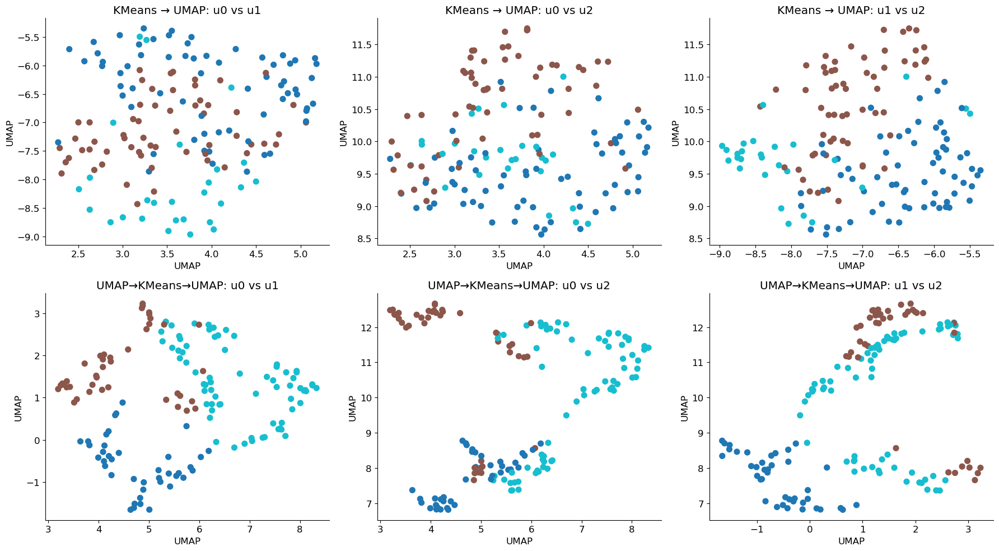

In [856]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import umap

def compare_umap_kmeans(new_cell_SST_model_ranks20_kmeans_reassign_x00, k=5, use_3d_umap=False, umap_seed=42, animal=0, cell=0):
    
    model = new_cell_SST_model_ranks20_kmeans_reassign_x00[20][animal][cell][0]
    
    w1 = model.vectors[0][0].detach().numpy()
    X = np.abs(w1.T)
    
    # --------------------- 1. KMeans → UMAP ---------------------
    kmeans1 = KMeans(n_clusters=k, random_state=0, n_init=10)
    labels_kmeans1 = kmeans1.fit_predict(X)

    umap_vis1 = umap.UMAP(n_components=3 if use_3d_umap else 2, random_state=umap_seed).fit_transform(X)

    # --------------------- 2. UMAP → KMeans → UMAP ---------------------
    umap_highdim = umap.UMAP(n_components=10, random_state=umap_seed).fit_transform(X)
    kmeans2 = KMeans(n_clusters=k, random_state=0, n_init=10)
    labels_kmeans2 = kmeans2.fit_predict(umap_highdim)

    umap_vis2 = umap.UMAP(n_components=3 if use_3d_umap else 2, random_state=umap_seed + 1).fit_transform(umap_highdim)

    # --------------------- Plotting ---------------------
    if use_3d_umap:
        fig, axs = plt.subplots(2, 3, figsize=(18, 10))
        axs = axs.flatten()

        # First row: KMeans → UMAP
        axs[0].scatter(umap_vis1[:, 0], umap_vis1[:, 1], c=labels_kmeans1, cmap='tab10', s=50)
        axs[0].set_title(f"KMeans → UMAP: u0 vs u1")
        axs[1].scatter(umap_vis1[:, 0], umap_vis1[:, 2], c=labels_kmeans1, cmap='tab10', s=50)
        axs[1].set_title(f"KMeans → UMAP: u0 vs u2")
        axs[2].scatter(umap_vis1[:, 1], umap_vis1[:, 2], c=labels_kmeans1, cmap='tab10', s=50)
        axs[2].set_title(f"KMeans → UMAP: u1 vs u2")

        # Second row: UMAP → KMeans → UMAP
        axs[3].scatter(umap_vis2[:, 0], umap_vis2[:, 1], c=labels_kmeans2, cmap='tab10', s=50)
        axs[3].set_title(f"UMAP→KMeans→UMAP: u0 vs u1")
        axs[4].scatter(umap_vis2[:, 0], umap_vis2[:, 2], c=labels_kmeans2, cmap='tab10', s=50)
        axs[4].set_title(f"UMAP→KMeans→UMAP: u0 vs u2")
        axs[5].scatter(umap_vis2[:, 1], umap_vis2[:, 2], c=labels_kmeans2, cmap='tab10', s=50)
        axs[5].set_title(f"UMAP→KMeans→UMAP: u1 vs u2")

        for ax in axs:
            ax.set_xlabel("UMAP")
            ax.set_ylabel("UMAP")

        plt.tight_layout()
        plt.show()

    else:
        fig, axs = plt.subplots(1, 2, figsize=(12, 6))

        axs[0].scatter(umap_vis1[:, 0], umap_vis1[:, 1], c=labels_kmeans1, cmap='tab10', s=50)
        axs[0].set_title(f"KMeans → UMAP (K={k})")
        axs[0].set_xlabel("UMAP 1")
        axs[0].set_ylabel("UMAP 2")
        axs[0].grid(True)

        axs[1].scatter(umap_vis2[:, 0], umap_vis2[:, 1], c=labels_kmeans2, cmap='tab10', s=50)
        axs[1].set_title(f"UMAP → KMeans → UMAP (K={k})")
        axs[1].set_xlabel("UMAP 1")
        axs[1].set_ylabel("UMAP 2")
        axs[1].grid(True)

        plt.tight_layout()
        plt.show()
        
        
        
compare_umap_kmeans(new_cell_SST_model_ranks20_kmeans_reassign_x00, k=3, use_3d_umap=True, umap_seed=42, animal=1, cell=9)
    


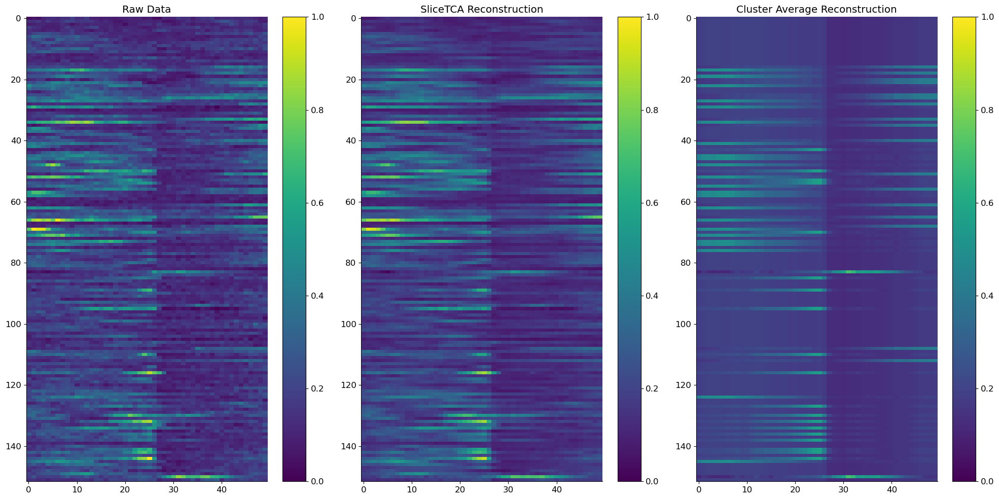

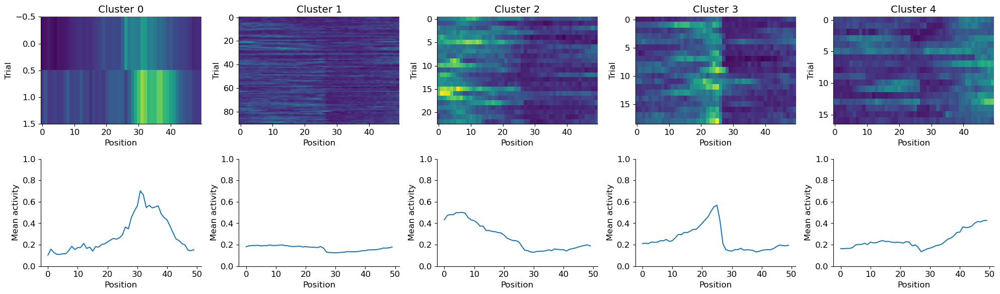

In [848]:
plot_per_cell_clustering_internals_single_cluster(new_cell_SST_model_ranks20_kmeans_reassign_x00, residual_activity_dict_SST, animal_id=1, cell_id=14, num_clusters=5)
       

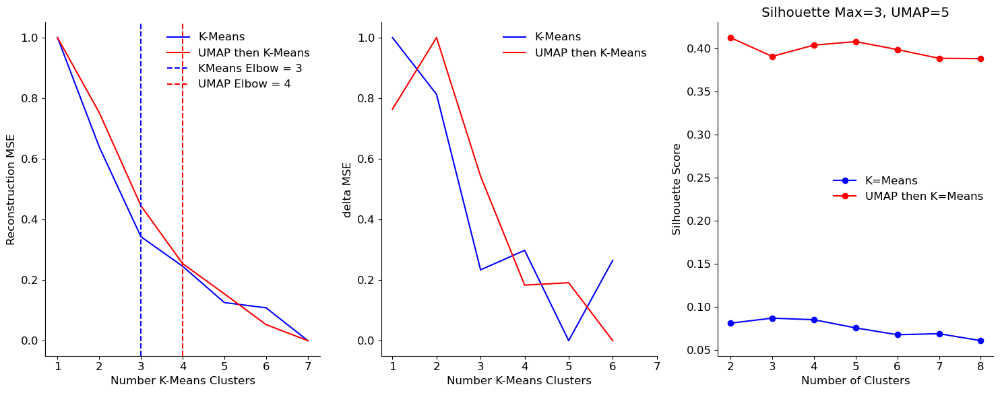

In [854]:
   
difference_MSE_array_min_max, difference_MSE_array_umap_min_max, elbow_kmeans, elbow_umap, cluster_range, silhouette_scores, silhouette_scores_umap, max_silhouette_reg, max_silhouette_umap = compare_umap_kmeans(new_cell_SST_model_ranks20_kmeans_reassign_x00, use_3d_umap=True, umap_seed=42, animal=1, cell=10)
plot_kmeans_clusters_silhouette(difference_MSE_array_min_max, difference_MSE_array_umap_min_max, elbow_kmeans, elbow_umap, cluster_range, silhouette_scores, silhouette_scores_umap, max_silhouette_reg, max_silhouette_umap)


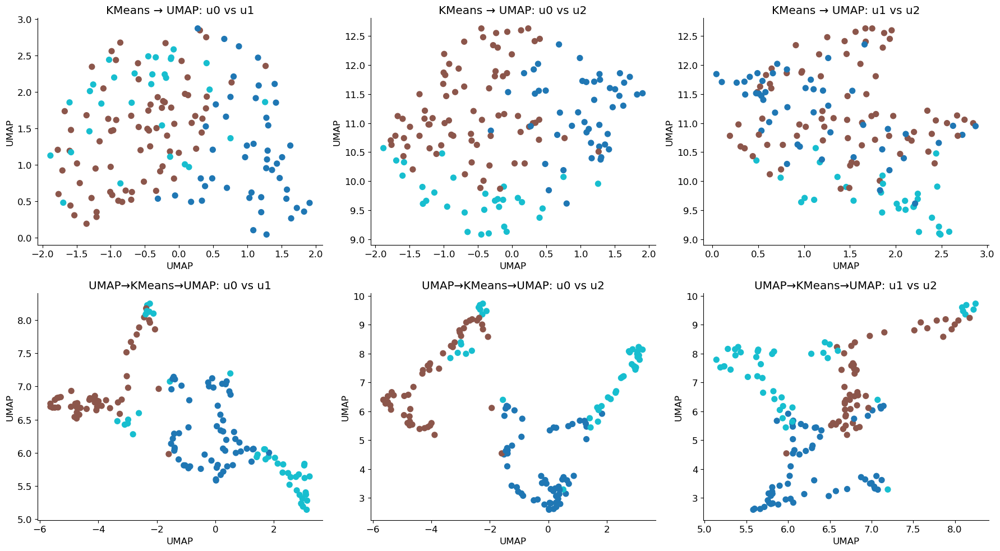

In [857]:
compare_umap_kmeans(new_cell_SST_model_ranks20_kmeans_reassign_x00, k=3, use_3d_umap=True, umap_seed=42, animal=1, cell=10)
    

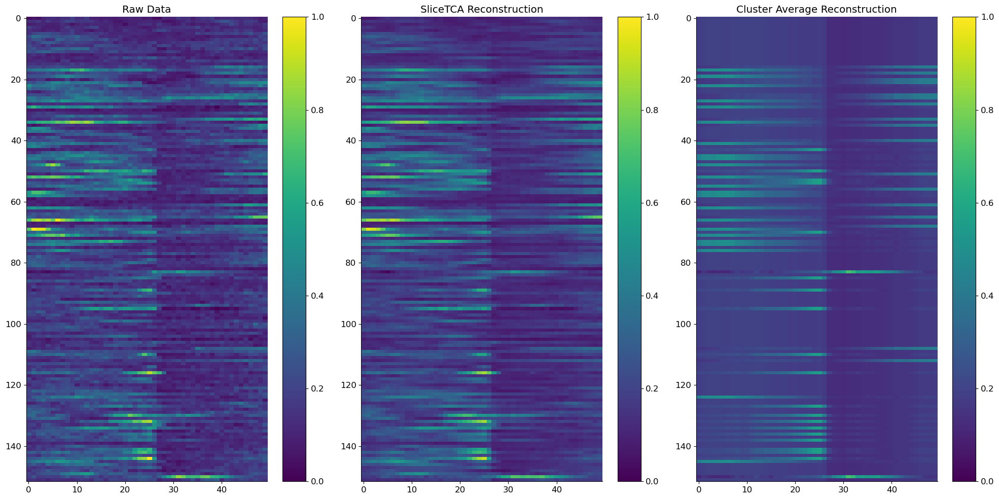

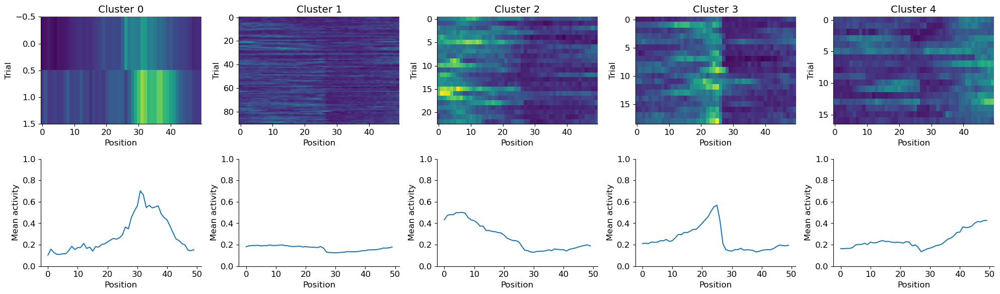

In [858]:
plot_per_cell_clustering_internals_single_cluster(new_cell_SST_model_ranks20_kmeans_reassign_x00, residual_activity_dict_SST, animal_id=1, cell_id=10, num_clusters=5)


In [ ]:
######################### contiguous kmeans ########################

In [364]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_SST_model_ranks20_contig_x00_cells"
cell_SST_model_ranks20_contig_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_EC_model_ranks20_contig_x00_cells"
cell_EC_model_ranks20_contig_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_NDNF_model_ranks20_contig_x00_cells"
cell_NDNF_model_ranks20_contig_x00 = get_model_data_per_cell(mse_dir)

Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 5 cells
    Animal 1: 15 cells
    Animal 2: 6 cells
    Animal 3: 4 cells
    Animal 4: 13 cells
    Animal 5: 13 cells
    Animal 6: 3 cells
    Animal 7: 3 cells
    Animal 8: 3 cells
    Animal 9: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 192 cells
    Animal 1: 150 cells
    Animal 2: 154 cells
    Animal 3: 82 cells
    Animal 4: 74 cells
    Animal 5: 64 cells
    Animal 6: 76 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 14 cells
    Animal 1: 14 cells
    Animal 2: 6 cells
    Animal 3: 10 cells


mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_SST_model_ranks20_contig_x00"
cell_SST_model_ranks20_contig_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_EC_model_ranks20_contig_x00"
cell_EC_model_ranks20_contig_x00_cell = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_NDNF_model_ranks20_contig_x00"
cell_NDNF_model_ranks20_contig_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_SST_model_ranks20_contig_00x"
cell_SST_model_ranks20_contig_00x = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_EC_model_ranks20_contig_00x"
cell_EC_model_ranks20_contig_00x = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_NDNF_model_ranks20_contig_00x"
cell_NDNF_model_ranks20_contig_00x = get_model_data_per_cell(mse_dir)

In [96]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_EC_model_ranks20_contig_x00"
animal_EC_model_ranks20_contig_x00 = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_EC_animal_x00_contig = preprocess_animal(animal_EC_model_ranks20_contig_x00, residual_activity_dict_EC, num_clusters=8, reassign_clusters=False, x00=True, umap=False, contiguous=True, ranks=20)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_SST_model_ranks20_contig_x00"
animal_SST_model_ranks20_contig_x00 = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_SST_animal_x00_contig = preprocess_animal(animal_SST_model_ranks20_contig_x00, residual_activity_dict_SST, num_clusters=8, reassign_clusters=False, x00=True, umap=False, contiguous=True, ranks=20)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_NDNF_model_ranks20_contig_x00"
animal_NDNF_model_ranks20_contig_x00 = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_NDNF_animal_x00_contig = preprocess_animal(animal_NDNF_model_ranks20_contig_x00, residual_activity_dict_NDNF, num_clusters=8, reassign_clusters=False, x00=True, umap=False, contiguous=True, ranks=20)



Loaded MSEs for 1 rank(s).
  Rank 20: 7 animals loaded.
Using breakpoint clustering (clusters = 1)
Using breakpoint clustering (clusters = 2)
Using breakpoint clustering (clusters = 3)
Using breakpoint clustering (clusters = 4)
Using breakpoint clustering (clusters = 5)
Using breakpoint clustering (clusters = 6)
Using breakpoint clustering (clusters = 7)
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 78 trials
After reassignment:
  Cluster 0: 78 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 40 trials
  Cluster 1: 38 trials
After reassignment:
  Cluster 0: 40 trials
  Cluster 1: 38 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 40 trials
  Cluster 1: 15 trials
  Cluster 2: 23 trials
After reassignment:
  Cluster 0: 40 trials
  Cluster 1: 15 trials
  Cluster 2: 23 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 40 trials
  Cluster 1: 5 trials
  Cluster 2: 10 trials
  Cluster 3: 23 trials
After reassignment:
  Clust


clusters_chosen = 2
Before reassignment:
  Cluster 0: 40 trials
  Cluster 1: 38 trials
After reassignment:
  Cluster 0: 40 trials
  Cluster 1: 38 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 40 trials
  Cluster 1: 15 trials
  Cluster 2: 23 trials
After reassignment:
  Cluster 0: 40 trials
  Cluster 1: 15 trials
  Cluster 2: 23 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 40 trials
  Cluster 1: 5 trials
  Cluster 2: 10 trials
  Cluster 3: 23 trials
After reassignment:
  Cluster 0: 40 trials
  Cluster 1: 5 trials
  Cluster 2: 10 trials
  Cluster 3: 23 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 40 trials
  Cluster 1: 5 trials
  Cluster 2: 5 trials
  Cluster 3: 5 trials
  Cluster 4: 23 trials
After reassignment:
  Cluster 0: 40 trials
  Cluster 1: 5 trials
  Cluster 2: 5 trials
  Cluster 3: 5 trials
  Cluster 4: 23 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 40 trials
  Cluster 1: 5 trials
  Cluster 2: 5 trials
  Clust

Using breakpoint clustering (clusters = 6)
Using breakpoint clustering (clusters = 7)
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 66 trials
After reassignment:
  Cluster 0: 66 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 61 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 61 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 50 trials
  Cluster 2: 11 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 50 trials
  Cluster 2: 11 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 50 trials
  Cluster 2: 5 trials
  Cluster 3: 6 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 50 trials
  Cluster 2: 5 trials
  Cluster 3: 6 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 10 trials
  Cluster 2: 40 trials
  Cluster 3: 5 trials
  Cluster 4: 6 trials
After reassignment:
  Cluster 0: 5 trials


clusters_chosen = 5
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 10 trials
  Cluster 2: 40 trials
  Cluster 3: 5 trials
  Cluster 4: 6 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 10 trials
  Cluster 2: 40 trials
  Cluster 3: 5 trials
  Cluster 4: 6 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 10 trials
  Cluster 2: 20 trials
  Cluster 3: 20 trials
  Cluster 4: 5 trials
  Cluster 5: 6 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 10 trials
  Cluster 2: 20 trials
  Cluster 3: 20 trials
  Cluster 4: 5 trials
  Cluster 5: 6 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 10 trials
  Cluster 2: 15 trials
  Cluster 3: 5 trials
  Cluster 4: 20 trials
  Cluster 5: 5 trials
  Cluster 6: 6 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 10 trials
  Cluster 2: 15 trials
  Cluster 3: 5 trials
  Cluster 4: 20 trials
  Cluster 5: 5 trials
  Cluster 6: 6 trials
Proces


clusters_chosen = 7
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 25 trials
  Cluster 2: 5 trials
  Cluster 3: 10 trials
  Cluster 4: 5 trials
  Cluster 5: 10 trials
  Cluster 6: 3 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 25 trials
  Cluster 2: 5 trials
  Cluster 3: 10 trials
  Cluster 4: 5 trials
  Cluster 5: 10 trials
  Cluster 6: 3 trials
Processing cell 31...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 63 trials
After reassignment:
  Cluster 0: 63 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 30 trials
  Cluster 1: 33 trials
After reassignment:
  Cluster 0: 30 trials
  Cluster 1: 33 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 30 trials
  Cluster 1: 30 trials
  Cluster 2: 3 trials
After reassignment:
  Cluster 0: 30 trials
  Cluster 1: 30 trials
  Cluster 2: 3 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 25 trials
  Cluster 2: 30 trials
  Cluster 3: 3 trials
After reas


clusters_chosen = 3
Before reassignment:
  Cluster 0: 30 trials
  Cluster 1: 30 trials
  Cluster 2: 3 trials
After reassignment:
  Cluster 0: 30 trials
  Cluster 1: 30 trials
  Cluster 2: 3 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 25 trials
  Cluster 2: 30 trials
  Cluster 3: 3 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 25 trials
  Cluster 2: 30 trials
  Cluster 3: 3 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 25 trials
  Cluster 2: 15 trials
  Cluster 3: 15 trials
  Cluster 4: 3 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 25 trials
  Cluster 2: 15 trials
  Cluster 3: 15 trials
  Cluster 4: 3 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 25 trials
  Cluster 2: 15 trials
  Cluster 3: 5 trials
  Cluster 4: 10 trials
  Cluster 5: 3 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 25 trials
  Cluster 2: 15 trials
  Clust

Processing cell 61...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 64 trials
After reassignment:
  Cluster 0: 64 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 25 trials
  Cluster 1: 39 trials
After reassignment:
  Cluster 0: 25 trials
  Cluster 1: 39 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 25 trials
  Cluster 1: 30 trials
  Cluster 2: 9 trials
After reassignment:
  Cluster 0: 25 trials
  Cluster 1: 30 trials
  Cluster 2: 9 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 25 trials
  Cluster 1: 15 trials
  Cluster 2: 15 trials
  Cluster 3: 9 trials
After reassignment:
  Cluster 0: 25 trials
  Cluster 1: 15 trials
  Cluster 2: 15 trials
  Cluster 3: 9 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 25 trials
  Cluster 1: 15 trials
  Cluster 2: 15 trials
  Cluster 3: 5 trials
  Cluster 4: 4 trials
After reassignment:
  Cluster 0: 25 trials
  Cluster 1: 15 trials
  Cluster 2: 15 trials
  Cluster 3: 5 trials
  Cluste


clusters_chosen = 6
Before reassignment:
  Cluster 0: 10 trials
  Cluster 1: 15 trials
  Cluster 2: 5 trials
  Cluster 3: 15 trials
  Cluster 4: 45 trials
  Cluster 5: 55 trials
After reassignment:
  Cluster 0: 10 trials
  Cluster 1: 15 trials
  Cluster 2: 5 trials
  Cluster 3: 15 trials
  Cluster 4: 45 trials
  Cluster 5: 55 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 10 trials
  Cluster 1: 10 trials
  Cluster 2: 5 trials
  Cluster 3: 5 trials
  Cluster 4: 15 trials
  Cluster 5: 45 trials
  Cluster 6: 55 trials
After reassignment:
  Cluster 0: 10 trials
  Cluster 1: 10 trials
  Cluster 2: 5 trials
  Cluster 3: 5 trials
  Cluster 4: 15 trials
  Cluster 5: 45 trials
  Cluster 6: 55 trials
Processing cell 41...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 145 trials
After reassignment:
  Cluster 0: 145 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 25 trials
  Cluster 1: 120 trials
After reassignment:
  Cluster 0: 25 trials
  Cluster 1: 120 tri


clusters_chosen = 2
Before reassignment:
  Cluster 0: 10 trials
  Cluster 1: 48 trials
After reassignment:
  Cluster 0: 10 trials
  Cluster 1: 48 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 10 trials
  Cluster 1: 15 trials
  Cluster 2: 33 trials
After reassignment:
  Cluster 0: 10 trials
  Cluster 1: 15 trials
  Cluster 2: 33 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 5 trials
  Cluster 2: 15 trials
  Cluster 3: 33 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 5 trials
  Cluster 2: 15 trials
  Cluster 3: 33 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 5 trials
  Cluster 2: 5 trials
  Cluster 3: 10 trials
  Cluster 4: 33 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 5 trials
  Cluster 2: 5 trials
  Cluster 3: 10 trials
  Cluster 4: 33 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 5 trials
  Cluster 2: 5 trials
  Cluster 

Loaded MSEs for 1 rank(s).
  Rank 20: 10 animals loaded.
Using breakpoint clustering (clusters = 1)
Using breakpoint clustering (clusters = 2)
Using breakpoint clustering (clusters = 3)
Using breakpoint clustering (clusters = 4)
Using breakpoint clustering (clusters = 5)
Using breakpoint clustering (clusters = 6)
Using breakpoint clustering (clusters = 7)
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 212 trials
After reassignment:
  Cluster 0: 212 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 100 trials
  Cluster 1: 112 trials
After reassignment:
  Cluster 0: 100 trials
  Cluster 1: 112 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 100 trials
  Cluster 1: 5 trials
  Cluster 2: 107 trials
After reassignment:
  Cluster 0: 100 trials
  Cluster 1: 5 trials
  Cluster 2: 107 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 100 trials
  Cluster 1: 5 trials
  Cluster 2: 15 trials
  Cluster 3: 92 trials
After reassignmen


clusters_chosen = 5
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 20 trials
  Cluster 2: 15 trials
  Cluster 3: 65 trials
  Cluster 4: 37 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 20 trials
  Cluster 2: 15 trials
  Cluster 3: 65 trials
  Cluster 4: 37 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 20 trials
  Cluster 2: 15 trials
  Cluster 3: 65 trials
  Cluster 4: 30 trials
  Cluster 5: 7 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 20 trials
  Cluster 2: 15 trials
  Cluster 3: 65 trials
  Cluster 4: 30 trials
  Cluster 5: 7 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 20 trials
  Cluster 2: 15 trials
  Cluster 3: 40 trials
  Cluster 4: 25 trials
  Cluster 5: 30 trials
  Cluster 6: 7 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 20 trials
  Cluster 2: 15 trials
  Cluster 3: 40 trials
  Cluster 4: 25 trials
  Cluster 5: 30 trials
  Cluster 6:

Using breakpoint clustering (clusters = 7)
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 163 trials
After reassignment:
  Cluster 0: 163 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 75 trials
  Cluster 1: 88 trials
After reassignment:
  Cluster 0: 75 trials
  Cluster 1: 88 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 75 trials
  Cluster 1: 25 trials
  Cluster 2: 63 trials
After reassignment:
  Cluster 0: 75 trials
  Cluster 1: 25 trials
  Cluster 2: 63 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 50 trials
  Cluster 1: 25 trials
  Cluster 2: 25 trials
  Cluster 3: 63 trials
After reassignment:
  Cluster 0: 50 trials
  Cluster 1: 25 trials
  Cluster 2: 25 trials
  Cluster 3: 63 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 25 trials
  Cluster 1: 25 trials
  Cluster 2: 25 trials
  Cluster 3: 25 trials
  Cluster 4: 63 trials
After reassignment:
  Cluster 0: 25 trials
  Cluster 1: 25 trials
  C

Using breakpoint clustering (clusters = 4)
Using breakpoint clustering (clusters = 5)
Using breakpoint clustering (clusters = 6)
Using breakpoint clustering (clusters = 7)
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 149 trials
After reassignment:
  Cluster 0: 149 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 60 trials
  Cluster 1: 89 trials
After reassignment:
  Cluster 0: 60 trials
  Cluster 1: 89 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 30 trials
  Cluster 1: 30 trials
  Cluster 2: 89 trials
After reassignment:
  Cluster 0: 30 trials
  Cluster 1: 30 trials
  Cluster 2: 89 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 30 trials
  Cluster 1: 30 trials
  Cluster 2: 50 trials
  Cluster 3: 39 trials
After reassignment:
  Cluster 0: 30 trials
  Cluster 1: 30 trials
  Cluster 2: 50 trials
  Cluster 3: 39 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 30 trials
  Cluster 1: 30 trials
  Cluster

Using breakpoint clustering (clusters = 5)
Using breakpoint clustering (clusters = 6)
Using breakpoint clustering (clusters = 7)
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 426 trials
After reassignment:
  Cluster 0: 426 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 225 trials
  Cluster 1: 201 trials
After reassignment:
  Cluster 0: 225 trials
  Cluster 1: 201 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 95 trials
  Cluster 1: 130 trials
  Cluster 2: 201 trials
After reassignment:
  Cluster 0: 95 trials
  Cluster 1: 130 trials
  Cluster 2: 201 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 95 trials
  Cluster 1: 130 trials
  Cluster 2: 105 trials
  Cluster 3: 96 trials
After reassignment:
  Cluster 0: 95 trials
  Cluster 1: 130 trials
  Cluster 2: 105 trials
  Cluster 3: 96 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 95 trials
  Cluster 1: 130 trials
  Cluster 2: 85 trials
  Cluster 3: 20 

Using breakpoint clustering (clusters = 4)
Using breakpoint clustering (clusters = 5)
Using breakpoint clustering (clusters = 6)
Using breakpoint clustering (clusters = 7)
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 390 trials
After reassignment:
  Cluster 0: 390 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 385 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 385 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 130 trials
  Cluster 2: 255 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 130 trials
  Cluster 2: 255 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 60 trials
  Cluster 2: 70 trials
  Cluster 3: 255 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 60 trials
  Cluster 2: 70 trials
  Cluster 3: 255 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 60 trials
  Cluste

In [97]:
mean_cluster_EC_animal_x00_contig, sem_cluster_EC_animal_x00_contig = get_cluster_MSE_for_plotting(internals_per_animal_dict_EC_animal_x00_contig)
mean_cluster_SST_animal_x00_contig, sem_cluster_SST_animal_x00_contig = get_cluster_MSE_for_plotting(internals_per_animal_dict_SST_animal_x00_contig)
mean_cluster_NDNF_animal_x00_contig, sem_cluster_NDNF_animal_x00_contig = get_cluster_MSE_for_plotting(internals_per_animal_dict_NDNF_animal_x00_contig)

Per-animal array shape: (7, 7)
Per-animal array shape: (10, 7)
Per-animal array shape: (4, 7)


In [90]:
from scipy.stats import sem


In [93]:
mean_cluster_EC_animal_00x_contig, sem_cluster_EC_animal_00x_contig = get_cluster_MSE_for_plotting(internals_per_animal_dict_EC_animal_00x_contig)
mean_cluster_SST_animal_00x_contig, sem_cluster_SST_animal_00x_contig = get_cluster_MSE_for_plotting(internals_per_animal_dict_SST_animal_00x_contig)
mean_cluster_NDNF_animal_00x_contig, sem_cluster_NDNF_animal_00x_contig = get_cluster_MSE_for_plotting(internals_per_animal_dict_NDNF_animal_00x_contig)

Per-animal array shape: (7, 7)
Per-animal array shape: (10, 7)
Per-animal array shape: (4, 7)


In [107]:
mean_MSE_cell_EC_model_ranks20_contig_x00, sem_MSE_cell_EC_model_ranks20_contig_x00 = get_cell_mean_sem_plotting_cellTCA(cell_EC_model_ranks20_contig_x00)
mean_MSE_cell_SST_model_ranks20_contig_x00, sem_MSE_cell_SST_model_ranks20_contig_x00 = get_cell_mean_sem_plotting_cellTCA(cell_SST_model_ranks20_contig_x00)
mean_MSE_cell_NDNF_model_ranks20_contig_x00, sem_MSE_cell_NDNF_model_ranks20_contig_x00 = get_cell_mean_sem_plotting_cellTCA(cell_NDNF_model_ranks20_contig_x00)

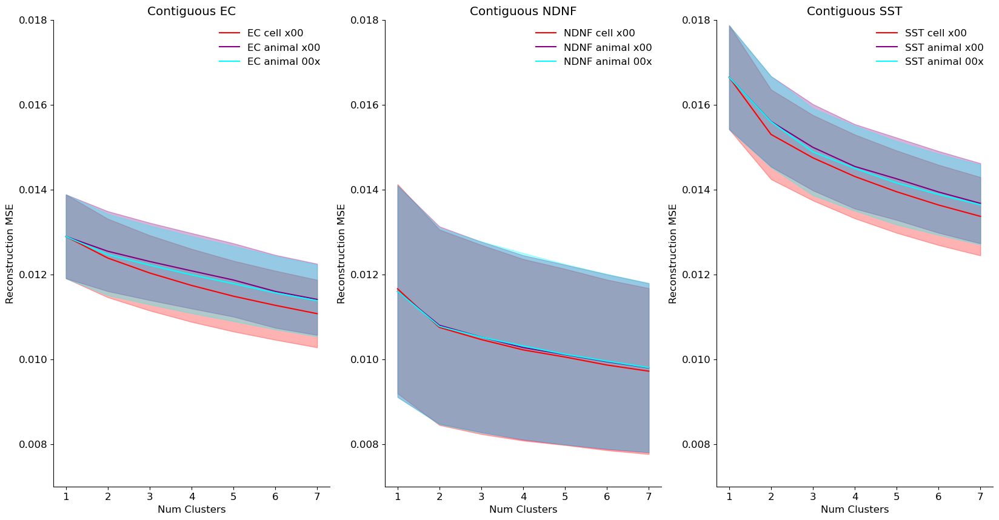

In [108]:
fig, axs = plt.subplots(1,3, figsize=(20,10))
axs[0].plot(mean_MSE_cell_EC_model_ranks20_contig_x00, color='red', label='EC cell x00')
axs[0].fill_between(range(len(mean_MSE_cell_EC_model_ranks20_contig_x00)), mean_MSE_cell_EC_model_ranks20_contig_x00 + sem_MSE_cell_EC_model_ranks20_contig_x00, mean_MSE_cell_EC_model_ranks20_contig_x00 - sem_MSE_cell_EC_model_ranks20_contig_x00, color='red', alpha=0.3)
axs[0].plot(mean_cluster_EC_animal_x00_contig, color='purple', label='EC animal x00')
axs[0].fill_between(range(len(mean_cluster_EC_animal_x00_contig)), mean_cluster_EC_animal_x00_contig + sem_cluster_EC_animal_x00_contig, mean_cluster_EC_animal_x00_contig - sem_cluster_EC_animal_x00_contig, color='purple', alpha=0.3)
axs[0].plot(mean_cluster_EC_animal_00x_contig, color='cyan', label='EC animal 00x')
axs[0].fill_between(range(len(mean_cluster_EC_animal_00x_contig)), mean_cluster_EC_animal_00x_contig + sem_cluster_EC_animal_00x_contig, mean_cluster_EC_animal_00x_contig - sem_cluster_EC_animal_00x_contig, color='cyan', alpha=0.3)
axs[0].set_xticks(np.arange(7), np.arange(1,8))
axs[0].set_title("Contiguous EC")
axs[0].set_xlabel("Num Clusters")
axs[0].set_ylabel("Reconstruction MSE")
axs[0].set_ylim(0.007, 0.018)
axs[0].legend()

axs[1].plot(mean_MSE_cell_NDNF_model_ranks20_contig_x00, color='red', label='NDNF cell x00')
axs[1].fill_between(range(len(mean_MSE_cell_NDNF_model_ranks20_contig_x00)), mean_MSE_cell_NDNF_model_ranks20_contig_x00 + sem_MSE_cell_NDNF_model_ranks20_contig_x00, mean_MSE_cell_NDNF_model_ranks20_contig_x00 - sem_MSE_cell_NDNF_model_ranks20_contig_x00, color='red', alpha=0.3)
axs[1].plot(mean_cluster_NDNF_animal_x00_contig, color='purple', label='NDNF animal x00')
axs[1].fill_between(range(len(mean_cluster_NDNF_animal_x00_contig)), mean_cluster_NDNF_animal_x00_contig + sem_cluster_NDNF_animal_x00_contig, mean_cluster_NDNF_animal_x00_contig - sem_cluster_NDNF_animal_x00_contig, color='purple', alpha=0.3)
axs[1].plot(mean_cluster_NDNF_animal_00x_contig, color='cyan', label='NDNF animal 00x')
axs[1].fill_between(range(len(mean_cluster_NDNF_animal_00x_contig)), mean_cluster_NDNF_animal_00x_contig + sem_cluster_NDNF_animal_00x_contig, mean_cluster_NDNF_animal_00x_contig - sem_cluster_NDNF_animal_00x_contig, color='cyan', alpha=0.3)
axs[1].set_xticks(np.arange(7), np.arange(1,8))
axs[1].set_title("Contiguous NDNF")
axs[1].set_xlabel("Num Clusters")
axs[1].set_ylabel("Reconstruction MSE")
axs[1].set_ylim(0.007, 0.018)
axs[1].legend()

axs[2].plot(mean_MSE_cell_SST_model_ranks20_contig_x00, color='red', label='SST cell x00')
axs[2].fill_between(range(len(mean_MSE_cell_SST_model_ranks20_contig_x00)), mean_MSE_cell_SST_model_ranks20_contig_x00 + sem_MSE_cell_SST_model_ranks20_contig_x00, mean_MSE_cell_SST_model_ranks20_contig_x00 - sem_MSE_cell_SST_model_ranks20_contig_x00, color='red', alpha=0.3)
axs[2].plot(mean_cluster_SST_animal_x00_contig, color='purple', label='SST animal x00')
axs[2].fill_between(range(len(mean_cluster_SST_animal_x00_contig)), mean_cluster_SST_animal_x00_contig + sem_cluster_SST_animal_x00_contig, mean_cluster_SST_animal_x00_contig - sem_cluster_SST_animal_x00_contig, color='purple', alpha=0.3)
axs[2].plot(mean_cluster_SST_animal_00x_contig, color='cyan', label='SST animal 00x')
axs[2].fill_between(range(len(mean_cluster_SST_animal_00x_contig)), mean_cluster_SST_animal_00x_contig + sem_cluster_SST_animal_00x_contig, mean_cluster_SST_animal_00x_contig - sem_cluster_SST_animal_00x_contig, color='cyan', alpha=0.3)
axs[2].set_xticks(np.arange(7), np.arange(1,8))
axs[2].set_title("Contiguous SST")
axs[2].set_xlabel("Num Clusters")
axs[2].set_ylabel("Reconstruction MSE")
axs[2].set_ylim(0.007, 0.018)
axs[2].legend()

In [323]:

def get_animal_av_cell_TCA(cell_SST_model_ranks20_contig_x00):

    animal_av_per_cell_early = []
    animal_av_per_cell_late = []

    for animal in cell_SST_model_ranks20_contig_x00[20]:

        early_cutpoints_list = []
        late_cutpoints_list = []

        for cell in cell_SST_model_ranks20_contig_x00[20][animal]:
            labels = cell_SST_model_ranks20_contig_x00[20][animal][cell][1][f"cell_{cell}"]["labels_dict"]["clusters_chosen_3"]
            cutpoints = np.where(np.diff(labels) != 0)[0] + 1
            early_cutpoints = cutpoints[0]
            early_cutpoints_list.append(early_cutpoints)
            late_cutpoints = cutpoints[1]
            late_cutpoints_list.append(late_cutpoints)

        average_early = np.mean(early_cutpoints_list)
        average_late = np.mean(late_cutpoints_list)

        animal_av_per_cell_early.append(average_early)
        animal_av_per_cell_late.append(average_late)
        
    return animal_av_per_cell_early, animal_av_per_cell_late




In [324]:
animal_av_per_cell_early_SST, animal_av_per_cell_late_SST = get_animal_av_cell_TCA(cell_SST_model_ranks20_contig_x00)

In [325]:
animal_av_per_cell_early_NDNF, animal_av_per_cell_late_NDNF = get_animal_av_cell_TCA(cell_NDNF_model_ranks20_contig_x00)

In [326]:
animal_av_per_cell_early_EC, animal_av_per_cell_late_EC = get_animal_av_cell_TCA(cell_EC_model_ranks20_contig_x00)

In [369]:
cell=1
cell_SST_model_ranks20_contig_x00[20][1][cell][1][f"cell_{cell}"]["labels_dict"]["clusters_chosen_3"]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2],
      dtype=int64)

In [367]:
cell=1
animal=1
labels_contig = cell_SST_model_ranks20_contig_x00[20][animal][cell][1][f"cell_{cell}"]["labels_dict"]["clusters_chosen_3"]
        
change_indices = np.where(np.diff(labels_contig) != 0)[0] + 1
print(change_indices)

[ 10 115]


In [409]:

def get_probabilites_dict(cell_SST_model_ranks20_kmeans_reassign_x00, cell_SST_model_ranks20_contig_x00):
    probabilites_per_animal_dict = {}

    for animal in cell_SST_model_ranks20_kmeans_reassign_x00[20]:
        cell_dict = {}
        for cell in cell_SST_model_ranks20_kmeans_reassign_x00[20][animal]:
            labels = cell_SST_model_ranks20_kmeans_reassign_x00[20][animal][cell][1][f"cell_{cell}"]["labels_dict"]["clusters_chosen_3"]
            labels_contig = cell_SST_model_ranks20_contig_x00[20][animal][cell][1][f"cell_{cell}"]["labels_dict"]["clusters_chosen_3"]
            probs_0, probs_1, probs_2 = sliding_window_probabilities(labels, window_size=10)
            change_indices = np.where(np.diff(labels_contig) != 0)[0] + 1
     
            if len(change_indices)==2:
                early_change = int(change_indices[0] * (len(probs_0) / len(labels_contig)))
                late_change = int(change_indices[1] * (len(probs_0) / len(labels_contig)))

#                 early_change = change_indices[0]
#                 late_change = change_indices[1]

                prob_0_early = probs_0[:early_change]
                prob_0_middle = probs_0[early_change:late_change]
                prob_0_late = probs_0[late_change:]

                prob_1_early = probs_1[:early_change]
                prob_1_middle = probs_1[early_change:late_change]
                prob_1_late = probs_1[late_change:]
#                 print(prob_1_late)

                prob_2_early = probs_2[:early_change]
                prob_2_middle = probs_2[early_change:late_change]
                prob_2_late = probs_2[late_change:]
                
                cell_dict[cell] = {}
                
                cell_dict[cell]["prob_0_early"] = prob_0_early
                cell_dict[cell]["prob_0_middle"] = prob_0_middle
                cell_dict[cell]["prob_0_late"] = prob_0_late

                cell_dict[cell]["prob_1_early"] = prob_1_early
                cell_dict[cell]["prob_1_middle"] = prob_1_middle
                cell_dict[cell]["prob_1_late"] = prob_1_late

                cell_dict[cell]["prob_2_early"] = prob_2_early
                cell_dict[cell]["prob_2_middle"] = prob_2_middle
                cell_dict[cell]["prob_2_late"] = prob_2_late
                
        probabilites_per_animal_dict[animal] = cell_dict

    return probabilites_per_animal_dict


            



In [420]:
def get_probabilites_dict_full(cell_SST_model_ranks20_kmeans_reassign_x00, cell_SST_model_ranks20_contig_x00):
    probabilites_per_animal_dict = {}

    for animal in cell_SST_model_ranks20_kmeans_reassign_x00[20]:
        cell_dict = {}
        for cell in cell_SST_model_ranks20_kmeans_reassign_x00[20][animal]:
            labels = cell_SST_model_ranks20_kmeans_reassign_x00[20][animal][cell][1][f"cell_{cell}"]["labels_dict"]["clusters_chosen_3"]
            
            cell_dict[cell] = {} 
            
            probs_0, probs_1, probs_2 = sliding_window_probabilities(labels, window_size=10)
            
            dominance_list = []
            for i in range(len(probs_0)):
                trial_0 = probs_0[i]
                trial_1 = probs_1[i]
                trial_2 = probs_2[i]
                
                trial_0_sq = trial_0**2
                trial_1_sq = trial_1**2
                trial_2_sq = trial_2**2
                
                numerator = (trial_0_sq + trial_1_sq + trial_2_sq)
                denominator = (trial_0 + trial_1 + trial_2)
                
                if denominator == 0:
                    dominance = np.nan  # Protect against division by zero
                else:
                    dominance = numerator / (denominator**2)  # corrected formula!

                dominance_list.append(dominance)
            
            dominance_array = np.array(dominance_list)
            
            cell_dict[cell]["probs_0"] = probs_0
            cell_dict[cell]["probs_1"] = probs_1
            cell_dict[cell]["probs_2"] = probs_2
            cell_dict[cell]["dominance_array"] = dominance_array
            
        probabilites_per_animal_dict[animal] = cell_dict
    
    return probabilites_per_animal_dict


In [434]:
probabilites_per_animal_SST = get_probabilites_dict_full(cell_SST_model_ranks20_kmeans_reassign_x00, cell_SST_model_ranks20_contig_x00)
    

In [435]:
probabilites_per_animal_NDNF = get_probabilites_dict_full(cell_NDNF_model_ranks20_kmeans_reassign_x00, cell_NDNF_model_ranks20_contig_x00)
    

In [436]:
probabilites_per_animal_EC = get_probabilites_dict_full(cell_EC_model_ranks20_kmeans_reassign_x00, cell_EC_model_ranks20_contig_x00)
    

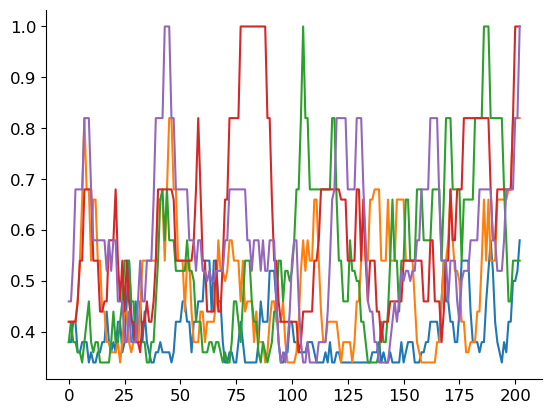

In [432]:
for cell in probabilites_per_animal_SST[0]:
    plt.plot(probabilites_per_animal_SST[0][cell]["dominance_array"])
    
plt.show()

In [438]:

def get_cell_av_dominance(probabilites_per_animal_SST):
    animal_dominance_list = []
    for animal in probabilites_per_animal_SST:
        cell_dominance = []
        for cell in probabilites_per_animal_SST[animal]:
            mean_dominance = np.mean(probabilites_per_animal_SST[animal][cell]["dominance_array"])
            cell_dominance.append(mean_dominance)

        mean_cell = np.mean(cell_dominance)
        animal_dominance_list.append(mean_cell)

    return animal_dominance_list
 

In [439]:
animal_dominance_list_SST = get_cell_av_dominance(probabilites_per_animal_SST)
animal_dominance_list_EC = get_cell_av_dominance(probabilites_per_animal_EC)
animal_dominance_list_NDNF = get_cell_av_dominance(probabilites_per_animal_NDNF)

In [449]:
print(animal_dominance_list_SST)
print(animal_dominance_list_EC)
print(animal_dominance_list_NDNF)

[0.5208866995073892, 0.53204662004662, 0.6685416666666667, 0.480078125, 0.5630769230769231, 0.5835464535464536, 0.5149771689497716, 0.5189285714285715, 0.7254954954954954, 0.4899]
[0.6995984299516907, 0.7184608187134504, 0.6995286195286196, 0.6080532150776053, 0.6119892686804452, 0.5759755102040817]
[0.5290033222591363, 0.5747276464542652, 0.545374149659864, 0.47558530183727044]


Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
    EC   NDNF  -0.1211 0.0364  -0.235 -0.0071   True
    EC    SST  -0.0925 0.0464 -0.1837 -0.0014   True
  NDNF    SST   0.0286 0.7656 -0.0759   0.133  False
----------------------------------------------------


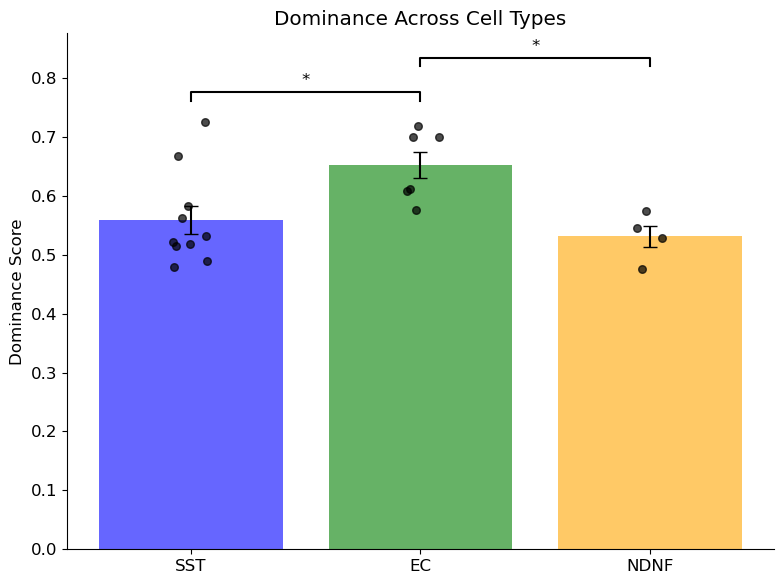

In [492]:
import matplotlib.pyplot as plt
import numpy as np

data = [animal_dominance_list_SST, animal_dominance_list_EC, animal_dominance_list_NDNF]

def plot_comparison(data, title='Dominance Across Cell Types', ylabel='Dominance Score'):
    from statsmodels.stats.multicomp import pairwise_tukeyhsd
    groups = ['SST', 'EC', 'NDNF']

    means = [np.mean(d) for d in data]
    sems = [np.std(d)/np.sqrt(len(d)) for d in data]

    x_pos = np.arange(len(groups))

    plt.figure(figsize=(8, 6))

    # Bar plot of the means
    plt.bar(x_pos, means, yerr=sems, capsize=5, alpha=0.6, color=['blue', 'green', 'orange'])

    # Scatter individual points
    for i, d in enumerate(data):
        x_jitter = np.random.normal(loc=0, scale=0.05, size=len(d))  # add little horizontal jitter
        plt.scatter(np.full_like(d, x_pos[i]) + x_jitter, d, color='black', s=30, alpha=0.7)

    plt.xticks(x_pos, groups)
    plt.ylabel(ylabel)
    plt.title(title)

    from statsmodels.stats.multicomp import pairwise_tukeyhsd

    # Run Tukey HSD
    tukey = pairwise_tukeyhsd(endog=data[0]+data[1]+data[2],
                              groups=['SST']*len(data[0]) + ['EC']*len(data[1]) + ['NDNF']*len(data[2]),
                              alpha=0.05)

    print(tukey.summary())

    comparisons = {}

    for result in tukey._results_table.data[1:]:
        group1, group2, meandiff, p_adj, lower, upper, reject = result
        comparisons[(group1, group2)] = {'reject': reject, 'p_adj': p_adj}  # Only one direction

    y_max = max([max(d) for d in data])

    def plot_star(start_idx, end_idx, y, height_ratio=0.02, significance='*'):
        x1, x2 = x_pos[start_idx], x_pos[end_idx]
        height = height_ratio * y_max
        plt.plot([x1, x1, x2, x2], [y, y+height, y+height, y], lw=1.5, color='black')
        plt.text((x1+x2)/2, y+height+0.01*y_max, significance, ha='center', va='bottom', color='black', fontsize=12)

    start_height = y_max * 1.05
    height_increment = y_max * 0.08
    current_height = start_height

    # Helper function to decide significance label
    def get_significance_label(p_val):
        if p_val < 0.01:
            return '**'
        elif p_val < 0.05:
            return '*'
        elif p_val < 0.1:
            return f'p={p_val:.2f}'
        else:
            return None
        
        
    def get_comparison_result(comparisons, group1, group2):
        """ Helper to get comparison result regardless of order """
        if (group1, group2) in comparisons:
            return comparisons[(group1, group2)]
        elif (group2, group1) in comparisons:
            return comparisons[(group2, group1)]
        else:
            return {'reject': None, 'p_adj': None}

        

    for (group1, group2) in [('SST', 'EC'), ('SST', 'NDNF'), ('EC', 'NDNF')]:  # only the 3 you care about
        result = get_comparison_result(comparisons, group1, group2)
        if result['p_adj'] is not None:
            significance = get_significance_label(result['p_adj'])
            if significance:
                idx1 = groups.index(group1)
                idx2 = groups.index(group2)
                plot_star(idx1, idx2, current_height, significance=significance)
                current_height += height_increment

    plt.tight_layout()
    plt.show()



    
plot_comparison(data, title='Dominance Across Cell Types', ylabel='Dominance Score')

In [443]:
from scipy.stats import ttest_ind

# Now do the test:
t_stat, p_value = ttest_ind(animal_dominance_list_EC, animal_dominance_list_NDNF)

print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value}")

f_stat, p_value = f_oneway(animal_dominance_list_SST, animal_dominance_list_EC, animal_dominance_list_NDNF)

print(f"F-statistic: {f_stat:.4f}, p-value: {p_value:.4g}")

import pandas as pd
from statsmodels.stats.multicomp import pairwise_tukeyhsd

# Stack all the data into a single long array
data = (
    list(animal_dominance_list_SST) +
    list(animal_dominance_list_EC) +
    list(animal_dominance_list_NDNF)
)

# Create a corresponding list of group labels
labels = (
    ['SST'] * len(animal_dominance_list_SST) +
    ['EC'] * len(animal_dominance_list_EC) +
    ['NDNF'] * len(animal_dominance_list_NDNF)
)

# Run Tukey's HSD
tukey = pairwise_tukeyhsd(endog=data, groups=labels, alpha=0.05)

# Print results
print(tukey.summary())


T-statistic: 3.4652790498036037
P-value: 0.008501533078875603
F-statistic: 4.7416, p-value: 0.0231
Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower   upper  reject
----------------------------------------------------
    EC   NDNF  -0.1211 0.0364  -0.235 -0.0071   True
    EC    SST  -0.0925 0.0464 -0.1837 -0.0014   True
  NDNF    SST   0.0286 0.7656 -0.0759   0.133  False
----------------------------------------------------


In [398]:
probabilites_per_animal_dict_SST_cell_x00 = get_probabilites_dict(cell_SST_model_ranks20_kmeans_reassign_x00, cell_SST_model_ranks20_contig_x00)

[ 15 105]
212
[10 15]
212
[ 35 105]
212
[10 15]
212
[ 90 120]
212
[35 55]
152
[ 10 115]
152
[ 25 115]
152
[ 60 115]
152
[ 45 115]
152
[30 55]
152
[15 80]
152
[ 65 110]
152
[35 50]
152
[115 145]
152
[115 145]
152
[ 25 115]
152
[ 60 115]
152
[ 25 115]
152
[ 40 115]
152
[ 5 30]
73
[15 25]
73
[15 20]
73
[25 35]
73
[15 50]
73
[15 60]
73
[20 50]
137
[15 35]
137
[15 55]
137
[20 45]
137
[50 55]
63
[40 45]
63
[40 60]
63
[15 40]
63
[30 35]
63
[10 45]
63
[30 55]
63
[40 45]
63
[15 60]
63
[30 35]
63
[10 45]
63
[ 5 30]
63
[10 60]
63
[ 85 130]
163
[25 45]
163
[35 85]
163
[ 85 125]
163
[ 80 125]
163
[ 40 100]
163
[ 75 135]
163
[15 75]
163
[50 65]
163
[75 95]
163
[20 50]
163
[ 80 100]
163
[ 90 150]
163
[40 75]
82
[40 50]
82
[25 45]
82
[ 50 140]
177
[10 70]
177
[155 165]
177
[ 5 10]
83
[25 60]
83
[15 40]
83
[10 80]
149
[105 120]
149
[ 65 120]
149
[50 95]
149
[ 55 100]
149
[70 80]
149
[ 90 115]
149
[15 95]
149
[ 40 105]
149
[ 5 40]
149


In [380]:
probabilites_per_animal_dict_EC_cell_x00 = get_probabilites_dict(cell_EC_model_ranks20_kmeans_reassign_x00, cell_EC_model_ranks20_contig_x00)

In [381]:
probabilites_per_animal_dict_NDNF_cell_x00 = get_probabilites_dict(cell_NDNF_model_ranks20_kmeans_reassign_x00, cell_NDNF_model_ranks20_contig_x00)

In [405]:
def plot_probabilities(probabilites_per_animal_dict_SST_cell_x00, cell_type="SST"):

    animal_mean_probs = {trial_type: {'early': [], 'middle': [], 'late': []} for trial_type in range(3)}

    for animal in probabilites_per_animal_dict_SST_cell_x00:
        cell_mean_probs = {trial_type: {'early': [], 'middle': [], 'late': []} for trial_type in range(3)}

        for cell in probabilites_per_animal_dict_SST_cell_x00[animal]:
            for trial_type in range(3):
                for phase in ['early', 'middle', 'late']:
                    key = f"prob_{trial_type}_{phase}"
                    prob = probabilites_per_animal_dict_SST_cell_x00[animal][cell][key]
                    if len(prob) > 0:  # safety check to avoid empty arrays
                        cell_mean_probs[trial_type][phase].append(np.mean(prob))

        for trial_type in range(3):
            for phase in ['early', 'middle', 'late']:
                if len(cell_mean_probs[trial_type][phase]) > 0:  # safety again
                    animal_mean = np.mean(cell_mean_probs[trial_type][phase])
                    animal_mean_probs[trial_type][phase].append(animal_mean)

    means = {trial_type: [] for trial_type in range(3)}
    sems = {trial_type: [] for trial_type in range(3)}

    for trial_type in range(3):
        for phase in ['early', 'middle', 'late']:
            phase_values = animal_mean_probs[trial_type][phase]
            if len(phase_values) > 0:  # Avoid nan
                mean_val = np.mean(phase_values)
                sem_val = sem(phase_values)
            else:
                mean_val = np.nan
                sem_val = np.nan
            means[trial_type].append(mean_val)
            sems[trial_type].append(sem_val)

    colors = ['dodgerblue', 'darkorange', 'green']
    labels = ['Trial Type 0', 'Trial Type 1', 'Trial Type 2']
    phases = ['Early', 'Middle', 'Late']
    x = np.arange(len(phases))

    plt.figure(figsize=(7, 6))
    for trial_type in range(3):
        plt.errorbar(
            x, means[trial_type], yerr=sems[trial_type],
            fmt='o-', capsize=5, color=colors[trial_type], label=labels[trial_type]
        )

    plt.xticks(x, phases)
    plt.ylabel('Probability of Appearing')
    plt.title(f'Probability of Trial Type {cell_type}')
    plt.legend()
    plt.tight_layout()
    plt.show()






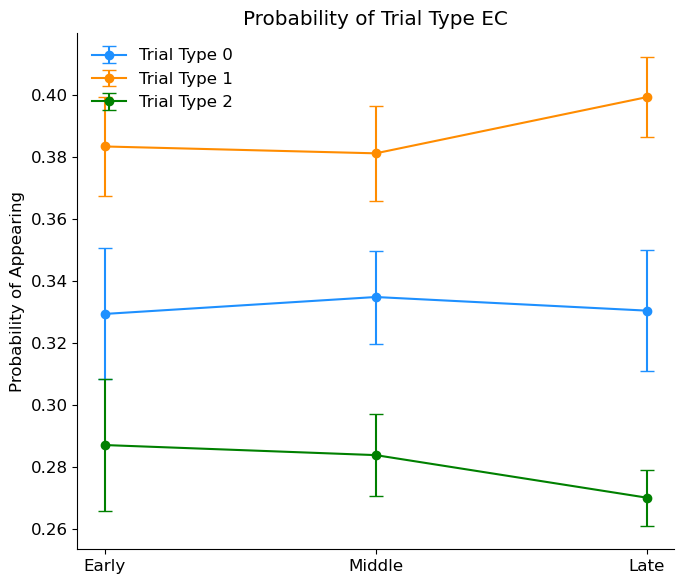

In [406]:
plot_probabilities(probabilites_per_animal_dict_EC_cell_x00, cell_type="EC")


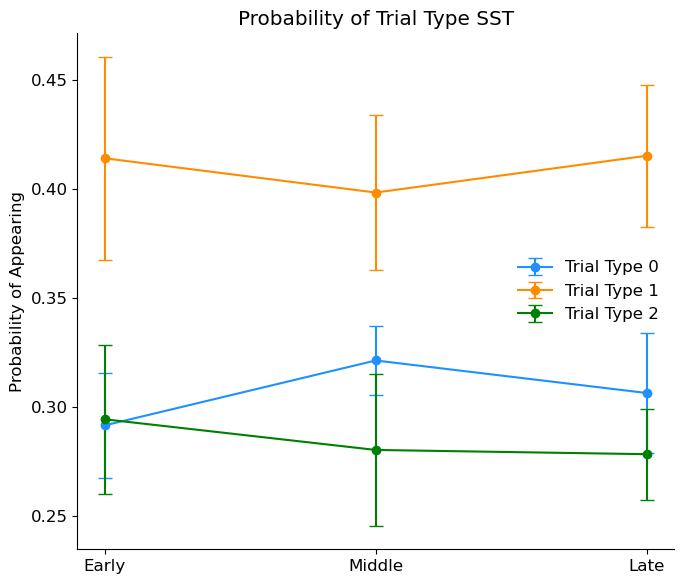

In [407]:
plot_probabilities(probabilites_per_animal_dict_SST_cell_x00, cell_type="SST")

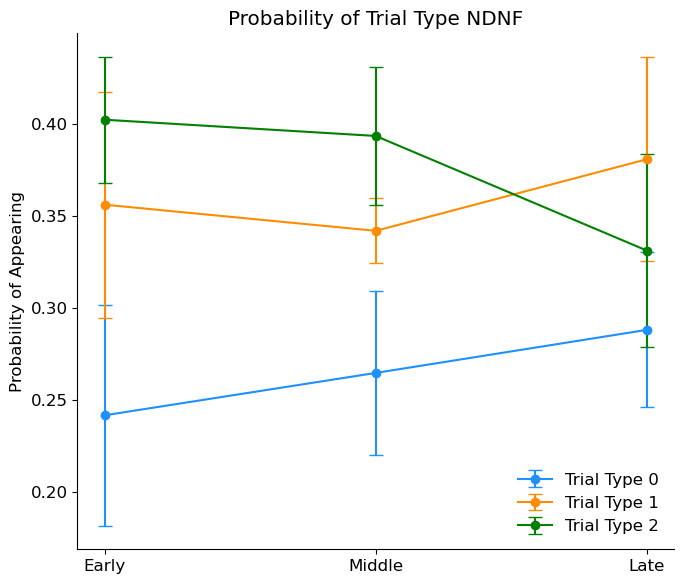

In [408]:
plot_probabilities(probabilites_per_animal_dict_NDNF_cell_x00, cell_type="NDNF")

In [1]:
import numpy as np

def sliding_window_probabilities(labels, window_size=10):
    labels = np.array(labels)
    n = len(labels)
    probs_0 = []
    probs_1 = []
    probs_2 = []

    for start in range(n - window_size + 1):
        window = labels[start:start+window_size]
        counts = np.bincount(window, minlength=3)  
        probs = counts / window_size
        
        probs_0.append(probs[0])
        probs_1.append(probs[1])
        probs_2.append(probs[2])

    return np.array(probs_0), np.array(probs_1), np.array(probs_2)

# Example usage
probs_0, probs_1, probs_2 = sliding_window_probabilities(labels, window_size=10)

plt.figure(figsize=(12,6))
x = np.arange(len(probs_0))
plt.plot(x, probs_0, label="0's", color='red')
plt.plot(x, probs_1, label="1's", color='blue')
plt.plot(x, probs_2, label="2's", color='green')
plt.xlabel("Position along array (window center)")
plt.ylabel("Probability")
plt.title(f"Sliding Window Probabilities (Window size={window_size})")
plt.legend()
plt.tight_layout()
plt.show()


NameError: name 'labels' is not defined

In [307]:
def get_changepoints_animal(internals_per_animal_dict_SST_animal_x00_contig):

    first_changepoints_list = []
    second_changepoints_list = []

    for animal in internals_per_animal_dict_SST_animal_x00_contig:
        print(animal)

        labels = internals_per_animal_dict_SST_animal_x00_contig[animal]["cell_0"]["labels_dict"]["clusters_chosen_3"]

        change_indices = np.where(np.diff(labels) != 0)[0] + 1

        first_changepoints = change_indices[0]
        first_changepoints_list.append(first_changepoints)
        second_changepoints = change_indices[1]
        second_changepoints_list.append(second_changepoints)
        
    
    return first_changepoints_list, second_changepoints_list

In [308]:
first_changepoints_list_SST_animal, second_changepoints_list_SST_animal = get_changepoints_animal(internals_per_animal_dict_SST_animal_x00_contig)


0
1
2
3
4
5
6
7
8
9


In [285]:
first_changepoints_list_EC_animal, second_changepoints_list_EC_animal = get_changepoints_animal(internals_per_animal_dict_EC_animal_x00_contig)


In [286]:
first_changepoints_list_NDNF_animal, second_changepoints_list_NDNF_animal = get_changepoints_animal(internals_per_animal_dict_NDNF_animal_x00_contig)


In [311]:
print(animal_av_per_cell_early)
print(first_changepoints_list_SST_animal)


[32.0, 46.666666666666664, 15.0, 17.5, 25.0, 58.07692307692308, 35.0, 71.66666666666667, 15.0, 50.5]
[100, 35, 15, 20, 10, 75, 20, 10, 15, 30]


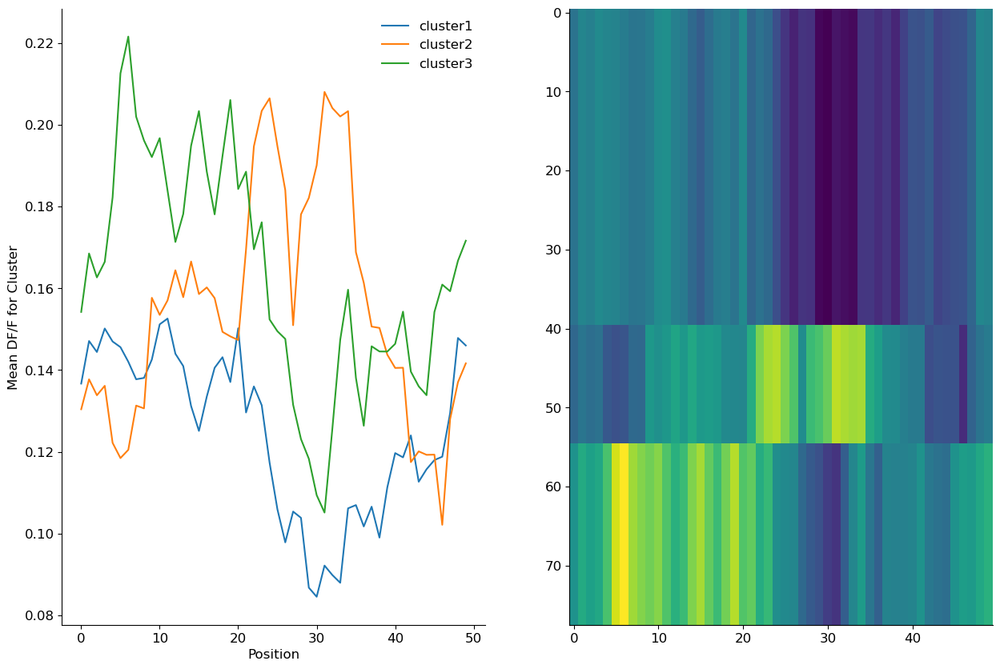

In [122]:
mean_list = internals_per_animal_dict_EC_animal_x00_contig[0]["cell_0"]["cluster_trial_mean_dict"]["clusters_chosen_3"]
reco = internals_per_animal_dict_EC_animal_x00_contig[0]["cell_0"]["Recon_by_cluster_av_dict"]["clusters_chosen_3"]#["cluster_trial_mean_dict"]["clusters_chosen_3"]

fig, axs = plt.subplots(1, 2, figsize=(15,10))
for i in range(3):
    axs[0].plot(mean_list[i], label=f"cluster{i+1}")
axs[0].legend()
axs[0].set_ylabel("Mean DF/F for Cluster")
axs[0].set_xlabel("Position")

axs[1].imshow(reco, aspect='auto')

plt.show()

In [200]:

def get_changepoints(internals_per_animal_dict_SST_animal_x00_contig):

    first_changepoints_list = []
    second_changepoints_list = []

    for animal in internals_per_animal_dict_SST_animal_x00_contig:

        labels = internals_per_animal_dict_SST_animal_x00_contig[animal]["cell_0"]["labels_dict"]["clusters_chosen_3"]

        change_indices = np.where(np.diff(labels) != 0)[0] + 1

        first_changepoints = change_indices[0]
        first_changepoints_list.append(first_changepoints)
        second_changepoints = change_indices[1]
        second_changepoints_list.append(second_changepoints)
        
    
    return first_changepoints_list, second_changepoints_list


In [201]:
first_changepoints_list_EC_animal, second_changepoints_list_EC_animal = get_changepoints(internals_per_animal_dict_EC_animal_x00_contig)

In [223]:

animal_changepoints_dict_early = {}
animal_changepoints_dict_middle = {}
animal_changepoints_dict_late = {}

for animal in internals_per_animal_dict_EC_animal_x00_kmean_reassign:
    cp1 = first_changepoints_list_EC_animal[animal]
    cp2 = second_changepoints_list_EC_animal[animal]

    labels = internals_per_animal_dict_EC_animal_x00_kmean_reassign[animal][f"cell_0"]["labels_dict"][f'clusters_chosen_3']

    unique_vals, counts = np.unique(labels, return_counts=True)

    if len(unique_vals) == 3:
        early = labels[:cp1]
        length_early = len(early)
        unique_vals_early, counts_early = np.unique(early, return_counts=True)
        count_dict = dict(zip(unique_vals_early, counts_early))

        probability_dict_early = {}
        for label in count_dict:
            count = count_dict[label]
            prob = count / length_early
            probability_dict_early[f"count_{label}"] = prob

        middle = labels[cp1:cp2]
        length_middle = len(middle)
        unique_vals_middle, counts_middle = np.unique(middle, return_counts=True)
        count_dict = dict(zip(unique_vals_middle, counts_middle))

        probability_dict_middle = {}
        for label in count_dict:
            count = count_dict[label]
            prob = count / length_middle
            probability_dict_middle[f"count_{label}"] = prob

        late = labels[cp1:cp2]
        length_late = len(late)
        unique_vals_late, counts_late = np.unique(late, return_counts=True)
        count_dict = dict(zip(unique_vals_late, counts_late))

        probability_dict_late = {}
        for label in count_dict:
            count = count_dict[label]
            prob = count / length_late
            probability_dict_late[f"count_{label}"] = prob
        
        animal_changepoints_dict_early[animal] = probability_dict_early
        animal_changepoints_dict_middle[animal] = probability_dict_middle
        animal_changepoints_dict_late[animal] = probability_dict_late

    
    
    

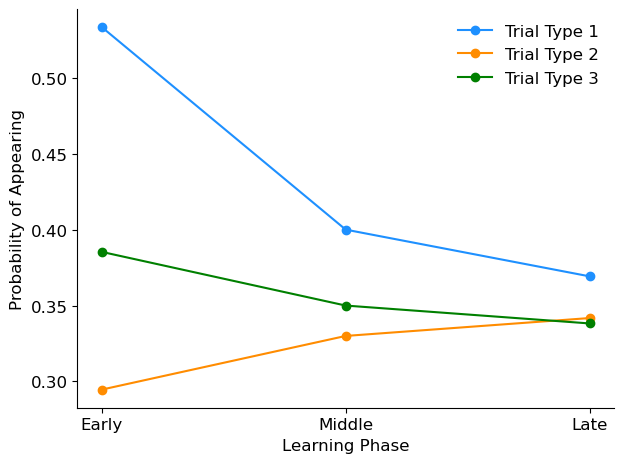

In [242]:
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict

# Step 1: Group values by label
label_values = defaultdict(list)

for animal in animal_changepoints_dict_early:
    for label in animal_changepoints_dict_early[animal]:
        value = animal_changepoints_dict_early[animal][label]
        label_values[label].append(value)

        
# Step 2: Compute mean for each label
labels_sorted = sorted(label_values.keys())
means_early = [np.mean(label_values[label]) for label in labels_sorted]

for animal in animal_changepoints_dict_middle:
    for label in animal_changepoints_dict_middle[animal]:
        value = animal_changepoints_dict_middle[animal][label]
        label_values[label].append(value)

# Step 2: Compute mean for each label
labels_sorted = sorted(label_values.keys())
means_middle = [np.mean(label_values[label]) for label in labels_sorted]



for animal in animal_changepoints_dict_late:
    for label in animal_changepoints_dict_late[animal]:
        value = animal_changepoints_dict_late[animal][label]
        label_values[label].append(value)

# Step 2: Compute mean for each label
labels_sorted = sorted(label_values.keys())
means_late = [np.mean(label_values[label]) for label in labels_sorted]


stacked = np.array([means_early, means_middle, means_late])  # shape: (3, 3)
transposed = stacked.T  # shape: (3 trial types, 3 phases)

# Step 2: Plot each trial type across learning phases
plt.figure()
phases = ['Early', 'Middle', 'Late']
trial_colors = ['dodgerblue', 'darkorange', 'green']

for i, (trial_vals, color) in enumerate(zip(transposed, trial_colors), start=1):
    plt.plot(phases, trial_vals, label=f"Trial Type {i}", color=color, marker='o')

plt.ylabel("Probability of Appearing")
plt.xlabel("Learning Phase")
plt.legend()
plt.tight_layout()
plt.show()
        

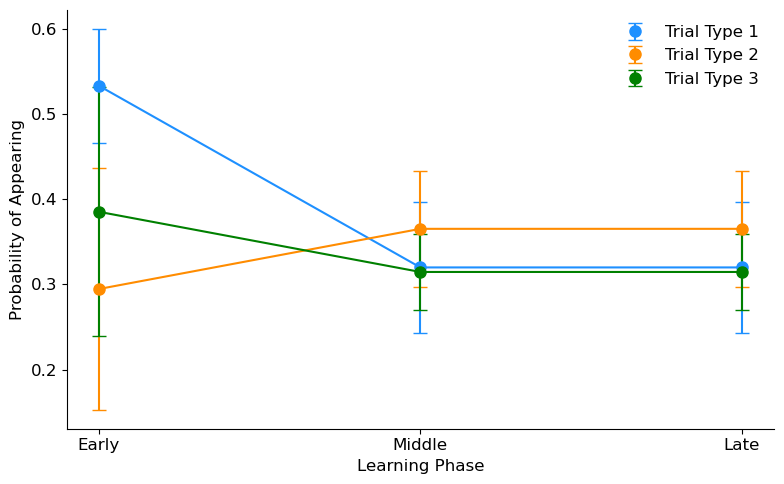

In [244]:
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
from scipy.stats import sem

# Step 1: Collect values by phase and label
phase_label_values = {
    'early': defaultdict(list),
    'middle': defaultdict(list),
    'late': defaultdict(list)
}

for animal in animal_changepoints_dict_early:
    for label, value in animal_changepoints_dict_early[animal].items():
        phase_label_values['early'][label].append(value)

for animal in animal_changepoints_dict_middle:
    for label, value in animal_changepoints_dict_middle[animal].items():
        phase_label_values['middle'][label].append(value)

for animal in animal_changepoints_dict_late:
    for label, value in animal_changepoints_dict_late[animal].items():
        phase_label_values['late'][label].append(value)

# Step 2: Compute mean and SEM per label per phase
labels_sorted = sorted(set(phase_label_values['early'].keys()) |
                       set(phase_label_values['middle'].keys()) |
                       set(phase_label_values['late'].keys()))

means = []
sems = []

for phase in ['early', 'middle', 'late']:
    means.append([np.mean(phase_label_values[phase][label]) for label in labels_sorted])
    sems.append([sem(phase_label_values[phase][label]) for label in labels_sorted])

means = np.array(means).T  # shape: (trial_type, phase)
sems = np.array(sems).T

# Step 3: Plot markers with vertical SEM whiskers (balls + whiskers ✨)
plt.figure(figsize=(8, 5))
x = np.arange(len(['Early', 'Middle', 'Late']))
colors = ['dodgerblue', 'darkorange', 'green']
phases = ['Early', 'Middle', 'Late']

for i, (mean_vals, sem_vals, color) in enumerate(zip(means, sems, colors), start=1):
    plt.plot(x, mean_vals, color=color)
    plt.errorbar(x, mean_vals, yerr=sem_vals, fmt='o', color=color, capsize=5, label=f'Trial Type {i}', markersize=8)

plt.xticks(x, phases)
plt.ylabel("Probability of Appearing")
plt.xlabel("Learning Phase")
plt.legend()
plt.tight_layout()
plt.show()


In [141]:

def get_per_animal_diff_score(internals_per_animal_dict_EC_animal_x00_contig):

    per_animal_diff_score = []
    for animal in internals_per_animal_dict_EC_animal_x00_contig:

        diff_score_list = []

        for cell in internals_per_animal_dict_EC_animal_x00_contig[animal]:
            mean_list = internals_per_animal_dict_EC_animal_x00_contig[animal][cell]["cluster_trial_mean_dict"]["clusters_chosen_3"]

            data = np.stack([mean_list[0], mean_list[1], mean_list[2]])
            diff_score = np.mean(np.std(data, axis=0))
            diff_score_list.append(diff_score)

        diff_score_cell_av = np.mean(diff_score_list)
        per_animal_diff_score.append(diff_score_cell_av)
    
    return per_animal_diff_score
    

In [465]:
per_animal_diff_score_EC = get_per_animal_diff_score(internals_per_animal_dict_EC_animal_x00_contig)

In [466]:
per_animal_diff_score_SST = get_per_animal_diff_score(internals_per_animal_dict_SST_animal_x00_contig)

In [ ]:
plot_comparison(data, title='Dominance Across Cell Types', ylabel='Dominance Score')

In [468]:
per_animal_diff_score_NDNF = get_per_animal_diff_score(internals_per_animal_dict_NDNF_animal_x00_contig)

In [464]:

def get_per_animal_diff_score(internals_per_animal_dict_EC_animal_x00_contig):

    per_animal_diff_score = {}
    for animal in internals_per_animal_dict_EC_animal_x00_contig:

        diff_dict = {}

        for cell in internals_per_animal_dict_EC_animal_x00_contig[animal]:
            mean_list = internals_per_animal_dict_EC_animal_x00_contig[animal][cell]["cluster_trial_mean_dict"]["clusters_chosen_3"]

            early = mean_list[0]
            middle = mean_list[1]
            late = mean_list[2]
            
            diff_dict[cell] = {}
            
            MSE_E_M = np.mean(np.square(early - middle))
            MSE_E_L = np.mean(np.square(early - late))
            MSE_L_M = np.mean(np.square(late - middle))
            
            diff_dict[cell]["MSE_E_M"] = MSE_E_M
            diff_dict[cell]["MSE_E_L"] = MSE_E_L
            diff_dict[cell]["MSE_L_M"] = MSE_L_M
            
        per_animal_diff_score[animal] = diff_dict
    
    return per_animal_diff_score
    

In [476]:

def get_MSE_per_animal_contig_eml(per_animal_diff_score_SST):

    animal_ealy_mid_list = []
    animal_ealy_late_list = []
    animal_late_mid_list = []
    animal_overall_list = []


    for animal in per_animal_diff_score_SST:

        ealy_mid_list = []
        ealy_late_list = []
        late_mid_list = []
        overall_list = []

        for cell in per_animal_diff_score_SST[animal]:
            ealy_mid = per_animal_diff_score_SST[animal][cell]['MSE_E_M']
            ealy_mid_list.append(ealy_mid)
            ealy_late = per_animal_diff_score_SST[animal][cell]['MSE_E_L']
            ealy_late_list.append(ealy_late)
            late_mid = per_animal_diff_score_SST[animal][cell]['MSE_L_M']
            late_mid_list.append(late_mid)
            overall = ealy_mid + ealy_late + late_mid
            overall_list.append(overall)

        ealy_mid_list_av = np.mean(ealy_mid_list)
        animal_ealy_mid_list.append(ealy_mid_list_av)
        ealy_late_list_av = np.mean(ealy_late_list)
        animal_ealy_late_list.append(ealy_late_list_av)
        late_mid_list_av = np.mean(late_mid_list)
        animal_late_mid_list.append(late_mid_list_av)
        overall_av = np.mean(overall)
        animal_overall_list.append(overall_av)
        
        
    return animal_ealy_mid_list, animal_ealy_late_list, animal_late_mid_list, animal_overall_list


In [477]:
animal_ealy_mid_list_SST, animal_ealy_late_list_SST, animal_late_mid_list_SST, animal_overall_list_SST = get_MSE_per_animal_contig_eml(per_animal_diff_score_SST)

In [478]:
animal_ealy_mid_list_EC, animal_ealy_late_list_EC, animal_late_mid_list_EC, animal_overall_list_EC = get_MSE_per_animal_contig_eml(per_animal_diff_score_EC)

In [479]:
animal_ealy_mid_list_NDNF, animal_ealy_late_list_NDNF, animal_late_mid_list_NDNF, animal_overall_list_NDNF = get_MSE_per_animal_contig_eml(per_animal_diff_score_NDNF)

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
    EC   NDNF   0.0004 0.9981 -0.0184 0.0192  False
    EC    SST   0.0175 0.0192  0.0027 0.0323   True
  NDNF    SST   0.0171 0.0606 -0.0007 0.0348  False
---------------------------------------------------


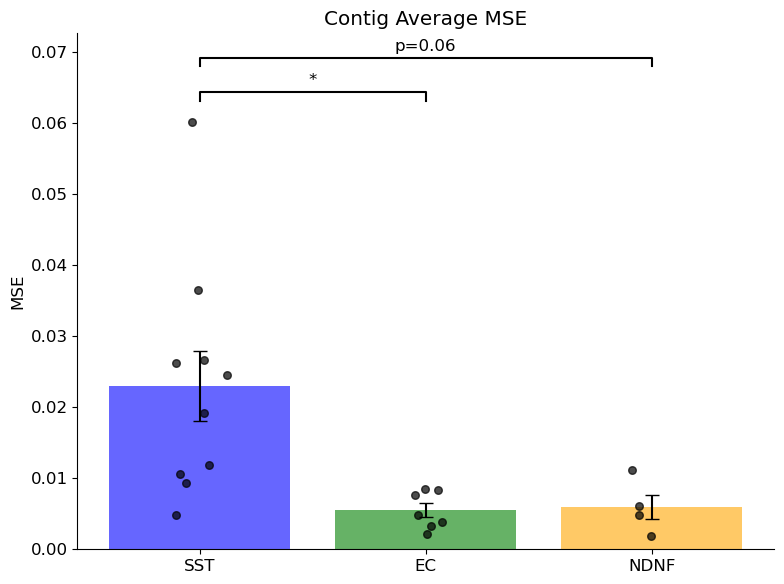

In [493]:
data = [animal_overall_list_SST, animal_overall_list_EC, animal_overall_list_NDNF]
plot_comparison(data, title='Contig Average MSE', ylabel='MSE')

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
    EC   NDNF      0.0 0.9999 -0.0074 0.0075  False
    EC    SST   0.0035  0.298 -0.0023 0.0094  False
  NDNF    SST   0.0035 0.4334 -0.0036 0.0105  False
---------------------------------------------------


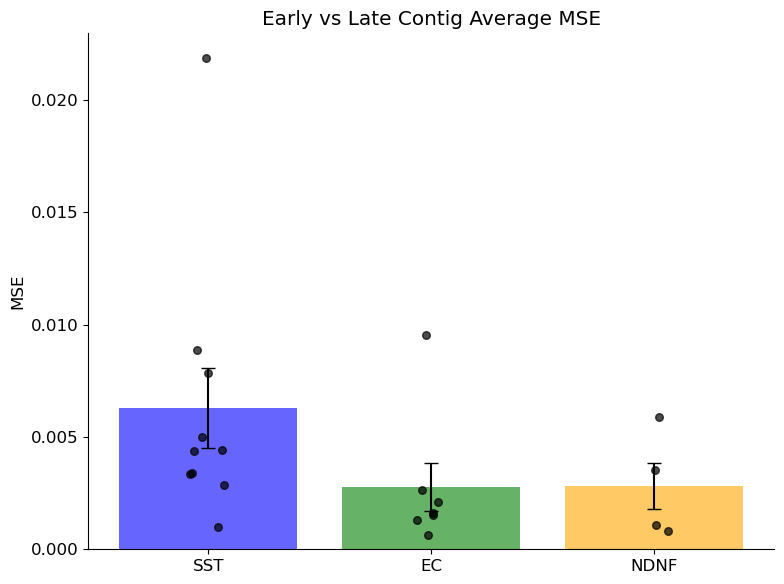

In [485]:
data = [animal_late_mid_list_SST, animal_late_mid_list_EC, animal_late_mid_list_NDNF]
plot_comparison(data, title='Early vs Late Contig Average MSE', ylabel='MSE')

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
    EC   NDNF   0.0112 0.1876 -0.0044 0.0267  False
    EC    SST   0.0073 0.3084  -0.005 0.0195  False
  NDNF    SST  -0.0039 0.7775 -0.0186 0.0108  False
---------------------------------------------------


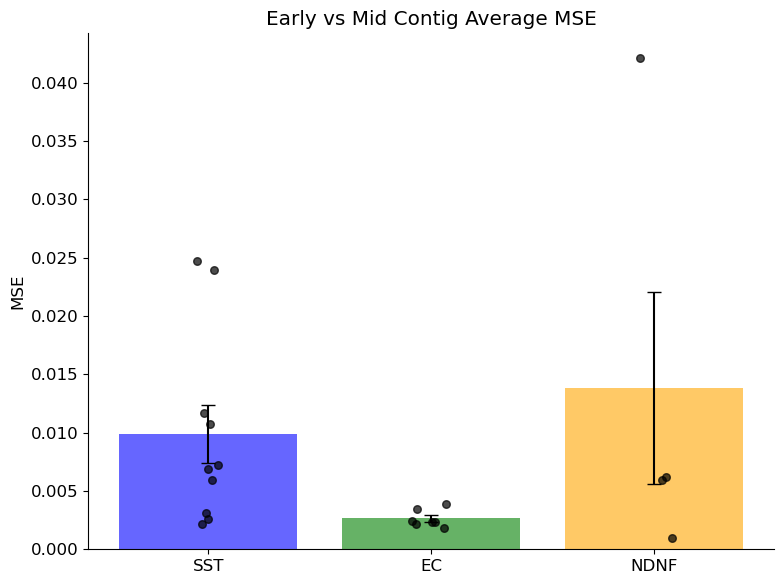

In [484]:
data = [animal_ealy_mid_list_SST, animal_ealy_mid_list_EC, animal_ealy_mid_list_NDNF]
plot_comparison(data, title='Early vs Mid Contig Average MSE', ylabel='MSE')

Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
    EC   NDNF   0.0117 0.1857 -0.0045 0.0279  False
    EC    SST   0.0049 0.5924 -0.0078 0.0177  False
  NDNF    SST  -0.0067 0.5128  -0.022 0.0086  False
---------------------------------------------------


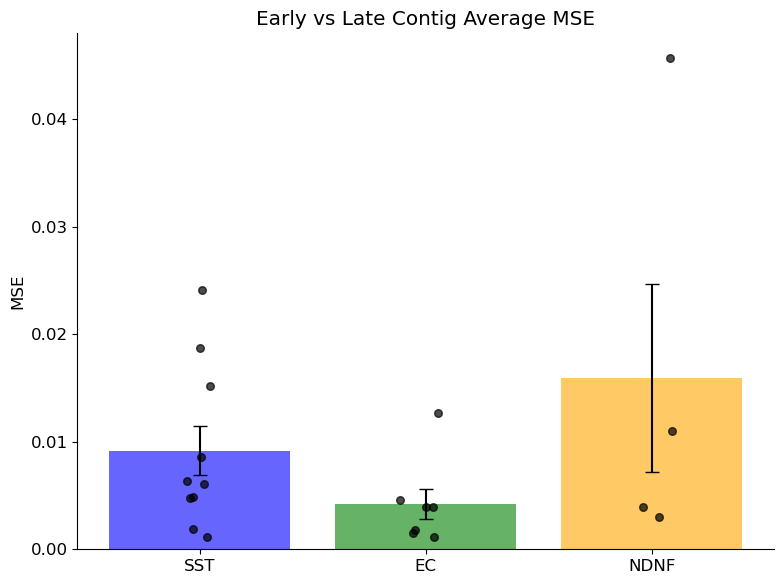

In [483]:
data = [animal_ealy_late_list_SST, animal_ealy_late_list_EC, animal_ealy_late_list_NDNF]
plot_comparison(data, title='Early vs Late Contig Average MSE', ylabel='MSE')

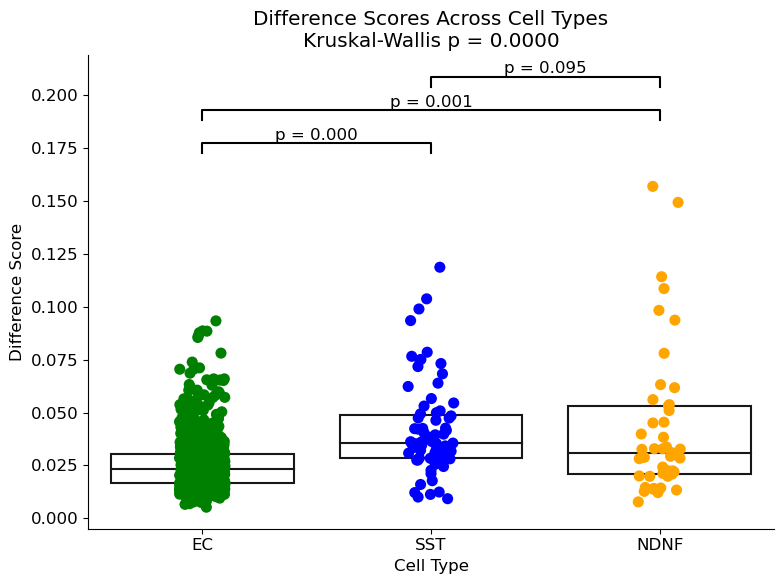

In [173]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import kruskal
import scikit_posthocs as sp

# Prepare data
data = (
    per_cell_diff_score_EC +
    per_cell_diff_score_SST +
    per_cell_diff_score_NDNF
)
labels = (
    ['EC'] * len(per_cell_diff_score_EC) +
    ['SST'] * len(per_cell_diff_score_SST) +
    ['NDNF'] * len(per_cell_diff_score_NDNF)
)
df = pd.DataFrame({'Cell Type': labels, 'Difference Score': data})

# Statistical test
kruskal_stat, kruskal_p = kruskal(
    per_cell_diff_score_EC,
    per_cell_diff_score_SST,
    per_cell_diff_score_NDNF
)

# Post-hoc pairwise tests
posthoc_results = sp.posthoc_dunn(df, val_col='Difference Score', group_col='Cell Type', p_adjust='bonferroni')

# Create plot
plt.figure(figsize=(8, 6))
ax = sns.stripplot(data=df, x='Cell Type', y='Difference Score', jitter=True,
                   palette={'EC': 'green', 'SST': 'blue', 'NDNF': 'orange'}, size=8)
sns.boxplot(data=df, x='Cell Type', y='Difference Score', showcaps=False,
            boxprops={'facecolor':'none'}, showfliers=False,
            whiskerprops={'linewidth':0}, palette='dark:.3')

# Annotate p-values
y_max = df['Difference Score'].max()
spacing = y_max * 0.1
comparisons = [('EC', 'SST'), ('EC', 'NDNF'), ('SST', 'NDNF')]

for i, (g1, g2) in enumerate(comparisons):
    p_val = posthoc_results.loc[g1, g2]
    x1, x2 = ['EC', 'SST', 'NDNF'].index(g1), ['EC', 'SST', 'NDNF'].index(g2)
    y = y_max + (i+1)*spacing
    h = spacing * 0.3
    plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, color='black')
    plt.text((x1 + x2) * .5, y + h*1.05, f"p = {p_val:.3f}", ha='center', va='bottom')

plt.title(f'Difference Scores Across Cell Types\nKruskal-Wallis p = {kruskal_p:.4f}')
plt.tight_layout()
plt.show()


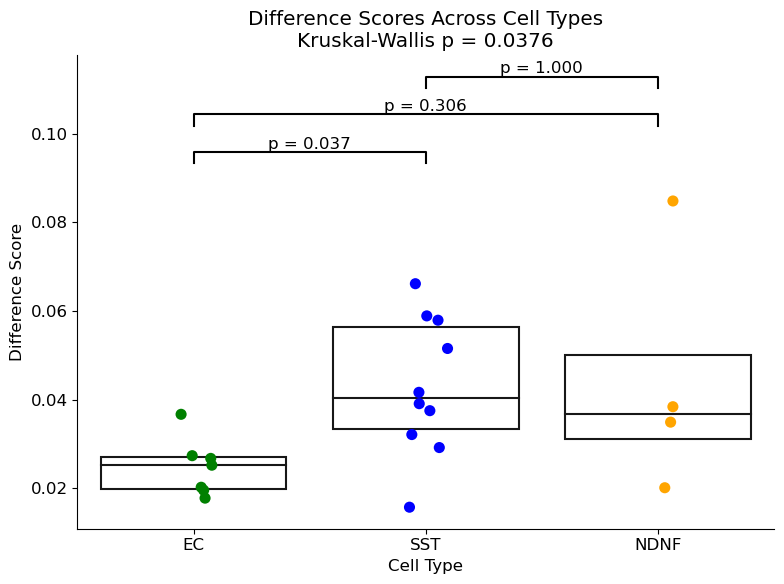

In [158]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import kruskal
import scikit_posthocs as sp

# Prepare data
data = (
    per_animal_diff_score_EC +
    per_animal_diff_score_SST +
    per_animal_diff_score_NDNF
)
labels = (
    ['EC'] * len(per_animal_diff_score_EC) +
    ['SST'] * len(per_animal_diff_score_SST) +
    ['NDNF'] * len(per_animal_diff_score_NDNF)
)
df = pd.DataFrame({'Cell Type': labels, 'Difference Score': data})

# Statistical test
kruskal_stat, kruskal_p = kruskal(
    per_animal_diff_score_EC,
    per_animal_diff_score_SST,
    per_animal_diff_score_NDNF
)

# Post-hoc pairwise tests
posthoc_results = sp.posthoc_dunn(df, val_col='Difference Score', group_col='Cell Type', p_adjust='bonferroni')

# Create plot
plt.figure(figsize=(8, 6))
ax = sns.stripplot(data=df, x='Cell Type', y='Difference Score', jitter=True,
                   palette={'EC': 'green', 'SST': 'blue', 'NDNF': 'orange'}, size=8)
sns.boxplot(data=df, x='Cell Type', y='Difference Score', showcaps=False,
            boxprops={'facecolor':'none'}, showfliers=False,
            whiskerprops={'linewidth':0}, palette='dark:.3')

# Annotate p-values
y_max = df['Difference Score'].max()
spacing = y_max * 0.1
comparisons = [('EC', 'SST'), ('EC', 'NDNF'), ('SST', 'NDNF')]

for i, (g1, g2) in enumerate(comparisons):
    p_val = posthoc_results.loc[g1, g2]
    x1, x2 = ['EC', 'SST', 'NDNF'].index(g1), ['EC', 'SST', 'NDNF'].index(g2)
    y = y_max + (i+1)*spacing
    h = spacing * 0.3
    plt.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1.5, color='black')
    plt.text((x1 + x2) * .5, y + h*1.05, f"p = {p_val:.3f}", ha='center', va='bottom')

plt.title(f'Difference Scores Across Cell Types\nKruskal-Wallis p = {kruskal_p:.4f}')
plt.tight_layout()
plt.show()


In [161]:

def get_contig_cluster_av(internals_per_animal_dict_EC_animal_x00_contig):
    animal_clust_1_list = []
    animal_clust_2_list = []
    animal_clust_3_list = []

    for animal in internals_per_animal_dict_EC_animal_x00_contig:
        clust_1_list = []
        clust_2_list = []
        clust_3_list = []

        for cell in internals_per_animal_dict_EC_animal_x00_contig[animal]:
            mean_list = internals_per_animal_dict_EC_animal_x00_contig[animal][cell]["cluster_trial_mean_dict"]["clusters_chosen_3"]
            clust_1_list.append(mean_list[0])
            clust_2_list.append(mean_list[1])
            clust_3_list.append(mean_list[2])

        clust_1_array = np.array(clust_1_list)
        clust_2_array = np.array(clust_2_list)
        clust_3_array = np.array(clust_3_list)

        clust_1_mean = np.mean(clust_1_array, axis=0)
        clust_2_mean = np.mean(clust_2_array, axis=0)
        clust_3_mean = np.mean(clust_3_array, axis=0)

        animal_clust_1_list.append(clust_1_mean)
        animal_clust_2_list.append(clust_2_mean)
        animal_clust_3_list.append(clust_3_mean)


    animal_clust_1_array = np.array(animal_clust_1_list)
    animal_clust_2_array = np.array(animal_clust_2_list)
    animal_clust_3_array = np.array(animal_clust_3_list)

    mean_animal_clust_1 = np.mean(animal_clust_1_array, axis=0)
    mean_animal_clust_2 = np.mean(animal_clust_2_array, axis=0)
    mean_animal_clust_3 = np.mean(animal_clust_3_array, axis=0)

    sem_animal_clust_1 = sem(animal_clust_1_array, axis=0)
    sem_animal_clust_2 = sem(animal_clust_2_array, axis=0)
    sem_animal_clust_3 = sem(animal_clust_3_array, axis=0)
    
    
    mean_list = [mean_animal_clust_1, mean_animal_clust_2, mean_animal_clust_3]
    sem_list = [sem_animal_clust_1, sem_animal_clust_2, sem_animal_clust_3]
    
    return mean_list, sem_list
   

In [162]:
mean_list_EC_animal_x00, sem_list_EC_animal_x00 = get_contig_cluster_av(internals_per_animal_dict_EC_animal_x00_contig)

In [163]:
mean_list_SST_animal_x00, sem_list_SST_animal_x00 = get_contig_cluster_av(internals_per_animal_dict_SST_animal_x00_contig)

In [164]:
mean_list_NDNF_animal_x00, sem_list_NDNF_animal_x00 = get_contig_cluster_av(internals_per_animal_dict_NDNF_animal_x00_contig)

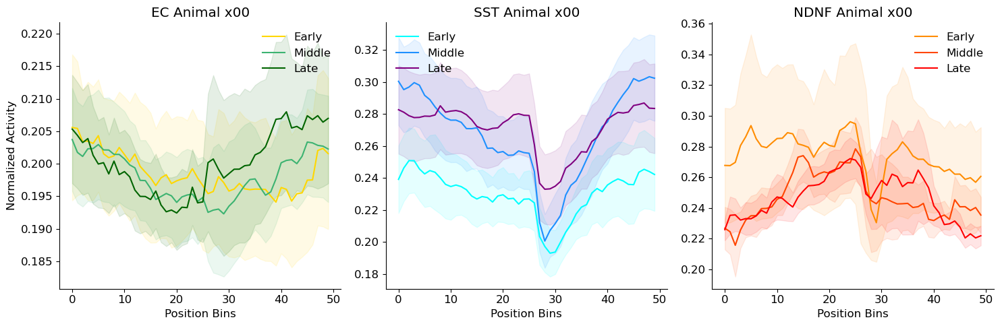

In [180]:
import matplotlib.pyplot as plt

# Use consistent matching colors for line and fill
colors_EC = ["gold", 'mediumseagreen', 'darkgreen']
colors_SST = ['cyan', 'dodgerblue', 'purple']
colors_NDNF = ['darkorange', 'orangered', 'red']

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# --- EC ---
for i in range(3):
    axs[0].plot(mean_list_EC_animal_x00[i], label=["Early", "Middle", "Late"][i], color=colors_EC[i])
    axs[0].fill_between(range(len(mean_list_EC_animal_x00[i])),
                        mean_list_EC_animal_x00[i] + sem_list_EC_animal_x00[i],
                        mean_list_EC_animal_x00[i] - sem_list_EC_animal_x00[i],
                        color=colors_EC[i], alpha=0.1)
axs[0].set_title("EC Animal x00")
axs[0].set_xlabel("Position Bins")
axs[0].set_ylabel("Normalized Activity")
axs[0].legend()

# --- SST ---
for i in range(3):
    axs[1].plot(mean_list_SST_animal_x00[i], label=["Early", "Middle", "Late"][i], color=colors_SST[i])
    axs[1].fill_between(range(len(mean_list_SST_animal_x00[i])),
                        mean_list_SST_animal_x00[i] + sem_list_SST_animal_x00[i],
                        mean_list_SST_animal_x00[i] - sem_list_SST_animal_x00[i],
                        color=colors_SST[i], alpha=0.1)
axs[1].set_title("SST Animal x00")
axs[1].set_xlabel("Position Bins")
axs[1].legend()

# --- NDNF ---
for i in range(3):
    axs[2].plot(mean_list_NDNF_animal_x00[i], label=["Early", "Middle", "Late"][i], color=colors_NDNF[i])
    axs[2].fill_between(range(len(mean_list_NDNF_animal_x00[i])),
                        mean_list_NDNF_animal_x00[i] + sem_list_NDNF_animal_x00[i],
                        mean_list_NDNF_animal_x00[i] - sem_list_NDNF_animal_x00[i],
                        color=colors_NDNF[i], alpha=0.1)
axs[2].set_title("NDNF Animal x00")
axs[2].set_xlabel("Position Bins")
axs[2].legend()

plt.tight_layout()
plt.show()


In [ ]:
################## regular kmeans ########################################

In [12]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_EC_model_ranks20_contig_00x"
animal_EC_model_ranks20_contig_00x = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_EC_animal_00x_kmean_reassign = preprocess_animal(animal_EC_model_ranks20_contig_00x, residual_activity_dict_EC, num_clusters=8, reassign_clusters=True, x00=False, umap=False, contiguous=False, ranks=20)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_SST_model_ranks20_contig_00x"
animal_SST_model_ranks20_contig_00x = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_SST_animal_00x_kmean_reassign  = preprocess_animal(animal_SST_model_ranks20_contig_00x, residual_activity_dict_SST, num_clusters=8, reassign_clusters=True, x00=False, umap=False, contiguous=False, ranks=20)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_NDNF_model_ranks20_contig_00x"
animal_NDNF_model_ranks20_contig_00x = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_NDNF_animal_00x_kmean_reassign  = preprocess_animal(animal_NDNF_model_ranks20_contig_00x, residual_activity_dict_NDNF, num_clusters=8, reassign_clusters=True, x00=False, umap=False, contiguous=False, ranks=20)



Loaded MSEs for 1 rank(s).
  Rank 20: 7 animals loaded.
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 78 trials
After reassignment:
  Cluster 0: 78 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 77 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 60 trials
  Cluster 2: 17 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 61 trials
  Cluster 2: 17 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 16 trials
  Cluster 2: 1 trials
  Cluster 3: 60 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 16 trials
  Cluster 2: 0 trials
  Cluster 3: 62 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15


clusters_chosen = 4
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 16 trials
  Cluster 2: 1 trials
  Cluster 3: 60 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 16 trials
  Cluster 2: 0 trials
  Cluster 3: 62 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 59 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 61 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 15 trials
  Cluster 2: 1 trials
  Cluster 3: 59 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
After re


clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 15 trials
  Cluster 2: 1 trials
  Cluster 3: 59 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 15 trials
  Cluster 2: 0 trials
  Cluster 3: 63 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 2 trials
  Cluster 3: 4 trials
  Cluster 4: 1 trials
  Cluster 5: 50 trials
  Cluster 6: 18 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 2 trials
  Cluster 3: 4 trials
  Cluster 4: 0 trials
  Cluster 5: 52 trials
  Cluster 6: 18 trials
Processing cell 71...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 78 

After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 60 trials
  Cluster 2: 17 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 61 trials
  Cluster 2: 17 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 16 trials
  Cluster 2: 1 trials
  Cluster 3: 60 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 16 trials
  Cluster 2: 0 trials
  Cluster 3: 62 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 59 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 61 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials

clusters_chosen = 6
Before r

  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 16 trials
  Cluster 2: 0 trials
  Cluster 3: 62 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 59 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 61 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 15 trials
  Cluster 2: 1 trials
  Cluster 3: 59 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 15 trials
  Cluster 2: 0 trials
  Cluster 3: 63 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials

clusters_chosen = 7
B


clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 59 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 61 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 15 trials
  Cluster 2: 1 trials
  Cluster 3: 59 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 15 trials
  Cluster 2: 0 trials
  Cluster 3: 63 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 2 trials
  Cluster 3: 4 trials
  Cluster 4: 1 trials
  Cluster 5: 50 

  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 2 trials
  Cluster 3: 4 trials
  Cluster 4: 0 trials
  Cluster 5: 52 trials
  Cluster 6: 18 trials
Processing cell 171...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 78 trials
After reassignment:
  Cluster 0: 78 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 77 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 60 trials
  Cluster 2: 17 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 61 trials
  Cluster 2: 17 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 16 trials
  Cluster 2: 1 trials
  Cluster 3: 60 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 66 trials
After reassignment:
  Cluster 0: 66 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 65 trials
  Cluster 1: 1 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 64 trials
  Cluster 1: 1 trials
  Cluster 2: 1 trials
  Reassigning cluster 1 (size=1)...
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 17 trials
  Cluster 2: 1 trials
  Cluster 3: 46 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 17 trials
  Cluster 2: 0 trials
  Cluster 3: 47 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 62 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Clus

  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
Processing cell 34...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 66 trials
After reassignment:
  Cluster 0: 66 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 65 trials
  Cluster 1: 1 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 64 trials
  Cluster 1: 1 trials
  Cluster 2: 1 trials
  Reassigning cluster 1 (size=1)...
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 tr

  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 66 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 17 trials
  Cluster 1: 45 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 17 trials
  Cluster 1: 49 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 60 trials
  Cluster 1: 1 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Reassigning cluster 1 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning clus


clusters_chosen = 5
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 62 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 66 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 17 trials
  Cluster 1: 45 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 17 trials
  Cluster 1: 49 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 60 trials
  Cluster 1: 1 trials
  Cluster 2


clusters_chosen = 6
Before reassignment:
  Cluster 0: 17 trials
  Cluster 1: 45 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 17 trials
  Cluster 1: 49 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 60 trials
  Cluster 1: 1 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Reassigning cluster 1 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cl

Processing cell 39...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 63 trials
After reassignment:
  Cluster 0: 63 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 17 trials
  Cluster 1: 46 trials
After reassignment:
  Cluster 0: 17 trials
  Cluster 1: 46 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 29 trials
  Cluster 2: 29 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 29 trials
  Cluster 2: 29 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 15 trials
  Cluster 2: 38 trials
  Cluster 3: 9 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 15 trials
  Cluster 2: 38 trials
  Cluster 3: 10 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 trials
  Cluster 3: 5 trials
  Cluster 4: 24 trials
After reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 tri


clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 52 trials
  Cluster 4: 4 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 54 trials
  Cluster 4: 4 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 13 trials
  Cluster 2: 2 trials
  Cluster 3: 42 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 3 trials
  Cluster 1: 13 trials
  Cluster 2: 2 trials
  Cluster 3: 45 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
Processing cell 77...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 63 trials
After reassignment:
  Cluster 0


clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 52 trials
  Cluster 4: 4 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 54 trials
  Cluster 4: 4 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 13 trials
  Cluster 2: 2 trials
  Cluster 3: 42 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 3 trials
  Cluster 1: 13 trials
  Cluster 2: 2 trials
  Cluster 3: 45 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
Processing cell 112...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 63 trials
After reassignment:
  Cluster 


clusters_chosen = 5
Before reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 trials
  Cluster 3: 5 trials
  Cluster 4: 24 trials
After reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 trials
  Cluster 3: 5 trials
  Cluster 4: 24 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 52 trials
  Cluster 4: 4 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 54 trials
  Cluster 4: 4 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 13 trials
  Cluster 2: 2 trials
  Cluster 3: 42 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After 

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 64 trials
After reassignment:
  Cluster 0: 64 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 50 trials
After reassignment:
  Cluster 0: 14 trials
  Cluster 1: 50 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
  Cluster 3: 1 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
  Cluster 3: 0 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 60 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cl

  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 64 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
Processing cell 43...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 64 trials
After reassignment:
  Cluster 0: 64 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 50 trials
After reassignment:
  Cluster 0: 14 trials
  Cluster 1: 50 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
  Cluster 3: 1 trials
  Reassigning cluster 3 (size=1

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 145 trials
After reassignment:
  Cluster 0: 145 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 140 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 140 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 91 trials
  Cluster 2: 53 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 92 trials
  Cluster 2: 53 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 45 trials
  Cluster 2: 91 trials
  Cluster 3: 7 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 45 trials
  Cluster 2: 91 trials
  Cluster 3: 7 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 4 trials
  Cluster 2: 33 trials
  Cluster 3: 87 trials
  Cluster 4: 19 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 4 trials
  Cluster 2: 33 tria


clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 45 trials
  Cluster 2: 91 trials
  Cluster 3: 7 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 45 trials
  Cluster 2: 91 trials
  Cluster 3: 7 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 4 trials
  Cluster 2: 33 trials
  Cluster 3: 87 trials
  Cluster 4: 19 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 4 trials
  Cluster 2: 33 trials
  Cluster 3: 87 trials
  Cluster 4: 19 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 53 trials
  Cluster 2: 1 trials
  Cluster 3: 82 trials
  Cluster 4: 6 trials
  Cluster 5: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 53 trials
  Cluster 2: 0 trials
  Cluster 3: 84 trials
  Cluster 4: 6 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 18 trials
  C

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 58 trials
After reassignment:
  Cluster 0: 58 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 53 trials
  Cluster 1: 5 trials
After reassignment:
  Cluster 0: 53 trials
  Cluster 1: 5 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 41 trials
  Cluster 1: 14 trials
  Cluster 2: 3 trials
After reassignment:
  Cluster 0: 41 trials
  Cluster 1: 14 trials
  Cluster 2: 3 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 52 trials
  Cluster 2: 1 trials
  Cluster 3: 3 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 53 trials
  Cluster 2: 0 trials
  Cluster 3: 3 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 7 trials
  Cluster 1: 45 trials
  Cluster 2: 3 trials
  Cluster 3: 1 trials
  Cluster 4: 2 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 7 trials
  Cluster 1: 4


clusters_chosen = 3
Before reassignment:
  Cluster 0: 41 trials
  Cluster 1: 14 trials
  Cluster 2: 3 trials
After reassignment:
  Cluster 0: 41 trials
  Cluster 1: 14 trials
  Cluster 2: 3 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 52 trials
  Cluster 2: 1 trials
  Cluster 3: 3 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 53 trials
  Cluster 2: 0 trials
  Cluster 3: 3 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 7 trials
  Cluster 1: 45 trials
  Cluster 2: 3 trials
  Cluster 3: 1 trials
  Cluster 4: 2 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 7 trials
  Cluster 1: 46 trials
  Cluster 2: 3 trials
  Cluster 3: 0 trials
  Cluster 4: 2 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 10 trials
  Cluster 2: 2 trials
  Cluster 3: 17 trials
  Cluster 4: 3 trials
  Cluster 5: 25 trials
  Reassigning cluster 0 (size

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 101 trials
After reassignment:
  Cluster 0: 101 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 96 trials
  Cluster 1: 5 trials
After reassignment:
  Cluster 0: 96 trials
  Cluster 1: 5 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 18 trials
  Cluster 2: 82 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 18 trials
  Cluster 2: 83 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 4 trials
  Cluster 2: 68 trials
  Cluster 3: 15 trials
After reassignment:
  Cluster 0: 14 trials
  Cluster 1: 4 trials
  Cluster 2: 68 trials
  Cluster 3: 15 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 6 trials
  Cluster 1: 75 trials
  Cluster 2: 18 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassig

  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 6 trials
  Cluster 1: 77 trials
  Cluster 2: 18 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 17 trials
  Cluster 2: 10 trials
  Cluster 3: 5 trials
  Cluster 4: 1 trials
  Cluster 5: 67 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 17 trials
  Cluster 2: 10 trials
  Cluster 3: 5 trials
  Cluster 4: 0 trials
  Cluster 5: 69 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 43 trials
  Cluster 2: 8 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 42 trials
  Cluster 6: 1 trials
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 46 trials
  Cluster 2: 8 trials
  Cluster 3: 0 trials
  Cluster 4: 

Loaded MSEs for 1 rank(s).
  Rank 20: 10 animals loaded.
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 212 trials
After reassignment:
  Cluster 0: 212 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 92 trials
  Cluster 1: 120 trials
After reassignment:
  Cluster 0: 92 trials
  Cluster 1: 120 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 54 trials
  Cluster 1: 50 trials
  Cluster 2: 108 trials
After reassignment:
  Cluster 0: 54 trials
  Cluster 1: 50 trials
  Cluster 2: 108 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 21 trials
  Cluster 1: 29 trials
  Cluster 2: 119 trials
  Cluster 3: 43 trials
After reassignment:
  Cluster 0: 21 trials
  Cluster 1: 29 trials
  Cluster 2: 119 trials
  Cluster 3: 43 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 29 trials
  Cluster 1: 28 trials
  Cluster 2: 105 trials
  Cluster 3: 30 trials
  Cluster 4: 20 trials
After reassignment:
  Cluster 0: 29 trials
  Clu

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 152 trials
After reassignment:
  Cluster 0: 152 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 70 trials
  Cluster 1: 82 trials
After reassignment:
  Cluster 0: 70 trials
  Cluster 1: 82 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 54 trials
  Cluster 1: 67 trials
  Cluster 2: 31 trials
After reassignment:
  Cluster 0: 54 trials
  Cluster 1: 67 trials
  Cluster 2: 31 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 41 trials
  Cluster 1: 47 trials
  Cluster 2: 44 trials
  Cluster 3: 20 trials
After reassignment:
  Cluster 0: 41 trials
  Cluster 1: 47 trials
  Cluster 2: 44 trials
  Cluster 3: 20 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 4 trials
  Cluster 1: 44 trials
  Cluster 2: 24 trials
  Cluster 3: 43 trials
  Cluster 4: 37 trials
After reassignment:
  Cluster 0: 4 trials
  Cluster 1: 44 trials
  Cluster 2: 24 trials
  Cluster 3: 43 trials
  

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 73 trials
After reassignment:
  Cluster 0: 73 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 63 trials
  Cluster 1: 10 trials
After reassignment:
  Cluster 0: 63 trials
  Cluster 1: 10 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 34 trials
  Cluster 1: 27 trials
  Cluster 2: 12 trials
After reassignment:
  Cluster 0: 34 trials
  Cluster 1: 27 trials
  Cluster 2: 12 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 23 trials
  Cluster 1: 14 trials
  Cluster 2: 4 trials
  Cluster 3: 32 trials
After reassignment:
  Cluster 0: 23 trials
  Cluster 1: 14 trials
  Cluster 2: 4 trials
  Cluster 3: 32 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 24 trials
  Cluster 1: 7 trials
  Cluster 2: 39 trials
  Cluster 3: 1 trials
  Cluster 4: 2 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 24 trials
  Cluster 1: 8 trials
  Cluster 2: 39 tr

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 137 trials
After reassignment:
  Cluster 0: 137 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 65 trials
  Cluster 1: 72 trials
After reassignment:
  Cluster 0: 65 trials
  Cluster 1: 72 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 68 trials
  Cluster 1: 33 trials
  Cluster 2: 36 trials
After reassignment:
  Cluster 0: 68 trials
  Cluster 1: 33 trials
  Cluster 2: 36 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 21 trials
  Cluster 1: 43 trials
  Cluster 2: 48 trials
  Cluster 3: 25 trials
After reassignment:
  Cluster 0: 21 trials
  Cluster 1: 43 trials
  Cluster 2: 48 trials
  Cluster 3: 25 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 23 trials
  Cluster 1: 30 trials
  Cluster 2: 19 trials
  Cluster 3: 30 trials
  Cluster 4: 35 trials
After reassignment:
  Cluster 0: 23 trials
  Cluster 1: 30 trials
  Cluster 2: 19 trials
  Cluster 3: 30 trials


Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 163 trials
After reassignment:
  Cluster 0: 163 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 86 trials
  Cluster 1: 77 trials
After reassignment:
  Cluster 0: 86 trials
  Cluster 1: 77 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 26 trials
  Cluster 1: 59 trials
  Cluster 2: 78 trials
After reassignment:
  Cluster 0: 26 trials
  Cluster 1: 59 trials
  Cluster 2: 78 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 49 trials
  Cluster 1: 22 trials
  Cluster 2: 54 trials
  Cluster 3: 38 trials
After reassignment:
  Cluster 0: 49 trials
  Cluster 1: 22 trials
  Cluster 2: 54 trials
  Cluster 3: 38 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 10 trials
  Cluster 1: 50 trials
  Cluster 2: 50 trials
  Cluster 3: 33 trials
  Cluster 4: 20 trials
After reassignment:
  Cluster 0: 10 trials
  Cluster 1: 50 trials
  Cluster 2: 50 trials
  Cluster 3: 33 trials


Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 82 trials
After reassignment:
  Cluster 0: 82 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 29 trials
  Cluster 1: 53 trials
After reassignment:
  Cluster 0: 29 trials
  Cluster 1: 53 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 13 trials
  Cluster 1: 23 trials
  Cluster 2: 46 trials
After reassignment:
  Cluster 0: 13 trials
  Cluster 1: 23 trials
  Cluster 2: 46 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 23 trials
  Cluster 1: 14 trials
  Cluster 2: 30 trials
  Cluster 3: 15 trials
After reassignment:
  Cluster 0: 23 trials
  Cluster 1: 14 trials
  Cluster 2: 30 trials
  Cluster 3: 15 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 16 trials
  Cluster 2: 9 trials
  Cluster 3: 23 trials
  Cluster 4: 19 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 16 trials
  Cluster 2: 9 trials
  Cluster 3: 23 trials
  Cl

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 83 trials
After reassignment:
  Cluster 0: 83 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 69 trials
After reassignment:
  Cluster 0: 14 trials
  Cluster 1: 69 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 62 trials
  Cluster 1: 20 trials
  Cluster 2: 1 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 63 trials
  Cluster 1: 20 trials
  Cluster 2: 0 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 30 trials
  Cluster 1: 17 trials
  Cluster 2: 22 trials
  Cluster 3: 14 trials
After reassignment:
  Cluster 0: 30 trials
  Cluster 1: 17 trials
  Cluster 2: 22 trials
  Cluster 3: 14 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 17 trials
  Cluster 1: 3 trials
  Cluster 2: 46 trials
  Cluster 3: 1 trials
  Cluster 4: 16 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 18 trials
  C

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 52 trials
After reassignment:
  Cluster 0: 52 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 7 trials
  Cluster 1: 45 trials
After reassignment:
  Cluster 0: 7 trials
  Cluster 1: 45 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 6 trials
  Cluster 1: 8 trials
  Cluster 2: 38 trials
After reassignment:
  Cluster 0: 6 trials
  Cluster 1: 8 trials
  Cluster 2: 38 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 2 trials
  Cluster 2: 22 trials
  Cluster 3: 14 trials
After reassignment:
  Cluster 0: 14 trials
  Cluster 1: 2 trials
  Cluster 2: 22 trials
  Cluster 3: 14 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 16 trials
  Cluster 1: 8 trials
  Cluster 2: 2 trials
  Cluster 3: 4 trials
  Cluster 4: 22 trials
After reassignment:
  Cluster 0: 16 trials
  Cluster 1: 8 trials
  Cluster 2: 2 trials
  Cluster 3: 4 trials
  Cluster 4: 22 

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 426 trials
After reassignment:
  Cluster 0: 426 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 150 trials
  Cluster 1: 276 trials
After reassignment:
  Cluster 0: 150 trials
  Cluster 1: 276 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 134 trials
  Cluster 1: 84 trials
  Cluster 2: 208 trials
After reassignment:
  Cluster 0: 134 trials
  Cluster 1: 84 trials
  Cluster 2: 208 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 52 trials
  Cluster 1: 102 trials
  Cluster 2: 201 trials
  Cluster 3: 71 trials
After reassignment:
  Cluster 0: 52 trials
  Cluster 1: 102 trials
  Cluster 2: 201 trials
  Cluster 3: 71 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 182 trials
  Cluster 1: 44 trials
  Cluster 2: 89 trials
  Cluster 3: 82 trials
  Cluster 4: 29 trials
After reassignment:
  Cluster 0: 182 trials
  Cluster 1: 44 trials
  Cluster 2: 89 trials
  Cluster

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 107 trials
After reassignment:
  Cluster 0: 107 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 50 trials
  Cluster 1: 57 trials
After reassignment:
  Cluster 0: 50 trials
  Cluster 1: 57 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 36 trials
  Cluster 1: 10 trials
  Cluster 2: 61 trials
After reassignment:
  Cluster 0: 36 trials
  Cluster 1: 10 trials
  Cluster 2: 61 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 46 trials
  Cluster 1: 11 trials
  Cluster 2: 9 trials
  Cluster 3: 41 trials
After reassignment:
  Cluster 0: 46 trials
  Cluster 1: 11 trials
  Cluster 2: 9 trials
  Cluster 3: 41 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 13 trials
  Cluster 1: 10 trials
  Cluster 2: 54 trials
  Cluster 3: 19 trials
  Cluster 4: 11 trials
After reassignment:
  Cluster 0: 13 trials
  Cluster 1: 10 trials
  Cluster 2: 54 trials
  Cluster 3: 19 trials
  

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 390 trials
After reassignment:
  Cluster 0: 390 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 186 trials
  Cluster 1: 204 trials
After reassignment:
  Cluster 0: 186 trials
  Cluster 1: 204 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 157 trials
  Cluster 1: 108 trials
  Cluster 2: 125 trials
After reassignment:
  Cluster 0: 157 trials
  Cluster 1: 108 trials
  Cluster 2: 125 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 151 trials
  Cluster 2: 51 trials
  Cluster 3: 185 trials
After reassignment:
  Cluster 0: 3 trials
  Cluster 1: 151 trials
  Cluster 2: 51 trials
  Cluster 3: 185 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 30 trials
  Cluster 1: 96 trials
  Cluster 2: 138 trials
  Cluster 3: 3 trials
  Cluster 4: 123 trials
After reassignment:
  Cluster 0: 30 trials
  Cluster 1: 96 trials
  Cluster 2: 138 trials
  Cluster

In [13]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_EC_model_ranks20_contig_x00"
animal_EC_model_ranks20_contig_x00 = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_EC_animal_x00_kmean_reassign = preprocess_animal(animal_EC_model_ranks20_contig_x00, residual_activity_dict_EC, num_clusters=8, reassign_clusters=True, x00=True, umap=False, contiguous=False, ranks=20)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_SST_model_ranks20_contig_x00"
animal_SST_model_ranks20_contig_x00 = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_SST_animal_x00_kmean_reassign  = preprocess_animal(animal_SST_model_ranks20_contig_x00, residual_activity_dict_SST, num_clusters=8, reassign_clusters=True, x00=True, umap=False, contiguous=False, ranks=20)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_NDNF_model_ranks20_contig_x00"
animal_NDNF_model_ranks20_contig_x00 = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_NDNF_animal_x00_kmean_reassign  = preprocess_animal(animal_NDNF_model_ranks20_contig_x00, residual_activity_dict_NDNF, num_clusters=8, reassign_clusters=True, x00=True, umap=False, contiguous=False, ranks=20)



Loaded MSEs for 1 rank(s).
  Rank 20: 7 animals loaded.
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 78 trials
After reassignment:
  Cluster 0: 78 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 77 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 4 trials
  Cluster 1: 73 trials
  Cluster 2: 1 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 4 trials
  Cluster 1: 74 trials
  Cluster 2: 0 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 7 trials
  Cluster 1: 69 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 7 trials
  Cluster 1: 71 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 18 trials
  Cluster 1: 51 tr


clusters_chosen = 4
Before reassignment:
  Cluster 0: 7 trials
  Cluster 1: 69 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 7 trials
  Cluster 1: 71 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 18 trials
  Cluster 1: 51 trials
  Cluster 2: 1 trials
  Cluster 3: 5 trials
  Cluster 4: 3 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 18 trials
  Cluster 1: 52 trials
  Cluster 2: 0 trials
  Cluster 3: 5 trials
  Cluster 4: 3 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 13 trials
  Cluster 1: 6 trials
  Cluster 2: 7 trials
  Cluster 3: 49 trials
  Cluster 4: 2 trials
  Cluster 5: 1 trials
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 13 trials
  Cluster 1: 6 trials
  Cluster 2: 7 trials
  Cluster 3: 50 trials
  Cluster 4: 2 trials
  Cluster 5: 0 trials



clusters_chosen = 4
Before reassignment:
  Cluster 0: 7 trials
  Cluster 1: 69 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 7 trials
  Cluster 1: 71 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 18 trials
  Cluster 1: 51 trials
  Cluster 2: 1 trials
  Cluster 3: 5 trials
  Cluster 4: 3 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 18 trials
  Cluster 1: 52 trials
  Cluster 2: 0 trials
  Cluster 3: 5 trials
  Cluster 4: 3 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 13 trials
  Cluster 1: 6 trials
  Cluster 2: 7 trials
  Cluster 3: 49 trials
  Cluster 4: 2 trials
  Cluster 5: 1 trials
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 13 trials
  Cluster 1: 6 trials
  Cluster 2: 7 trials
  Cluster 3: 50 trials
  Cluster 4: 2 trials
  Cluster 5: 0 trials



clusters_chosen = 7
Before reassignment:
  Cluster 0: 35 trials
  Cluster 1: 12 trials
  Cluster 2: 1 trials
  Cluster 3: 24 trials
  Cluster 4: 2 trials
  Cluster 5: 3 trials
  Cluster 6: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 37 trials
  Cluster 1: 12 trials
  Cluster 2: 0 trials
  Cluster 3: 24 trials
  Cluster 4: 2 trials
  Cluster 5: 3 trials
  Cluster 6: 0 trials
Processing cell 126...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 78 trials
After reassignment:
  Cluster 0: 78 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 77 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 4 trials
  Cluster 1: 73 trials
  Cluster 2: 1 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 4 trials
  Cluster 1: 74 trials
  Cluster 2: 0 trials




clusters_chosen = 1
Before reassignment:
  Cluster 0: 78 trials
After reassignment:
  Cluster 0: 78 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 77 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 4 trials
  Cluster 1: 73 trials
  Cluster 2: 1 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 4 trials
  Cluster 1: 74 trials
  Cluster 2: 0 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 7 trials
  Cluster 1: 69 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 7 trials
  Cluster 1: 71 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 18 trials
  Cluster 1: 51 trials
  Cluster 2: 1 trials
  Cluster 3: 5 trials
  Cluster 4: 3 trials
  Reas

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 66 trials
After reassignment:
  Cluster 0: 66 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 65 trials
  Cluster 1: 1 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 24 trials
  Cluster 1: 1 trials
  Cluster 2: 41 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 24 trials
  Cluster 1: 0 trials
  Cluster 2: 42 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 27 trials
  Cluster 1: 37 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 27 trials
  Cluster 1: 39 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 27 trials
  Cluster 2: 36 trials
  Cluster 3: 1 trials
  C

After reassignment:
  Cluster 0: 16 trials
  Cluster 1: 15 trials
  Cluster 2: 35 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
Processing cell 35...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 66 trials
After reassignment:
  Cluster 0: 66 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 65 trials
  Cluster 1: 1 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 24 trials
  Cluster 1: 1 trials
  Cluster 2: 41 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 24 trials
  Cluster 1: 0 trials
  Cluster 2: 42 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 27 trials
  Cluster 1: 37 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 27 trials
  Cluster 1: 39 trials
 


clusters_chosen = 7
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 13 trials
  Cluster 2: 34 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 16 trials
  Cluster 1: 15 trials
  Cluster 2: 35 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
Processing cell 77...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 66 trials
After reassignment:
  Cluster 0: 66 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 65 trials
  Cluster 1: 1 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 24 trials
  Cluster 1: 1 trials
  Cluster 2: 41 trials
  Reassigning cluster 1 (size=1)...
After reassignme


clusters_chosen = 6
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 20 trials
  Cluster 2: 1 trials
  Cluster 3: 24 trials
  Cluster 4: 1 trials
  Cluster 5: 17 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 3 trials
  Cluster 1: 20 trials
  Cluster 2: 0 trials
  Cluster 3: 25 trials
  Cluster 4: 0 trials
  Cluster 5: 18 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 13 trials
  Cluster 2: 34 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 16 trials
  Cluster 1: 15 trials
  Cluster 2: 35 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
Processing cell 121...

clusters_chosen = 1
Before reassignment:
  Cluster 0

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 63 trials
After reassignment:
  Cluster 0: 63 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 49 trials
  Cluster 1: 14 trials
After reassignment:
  Cluster 0: 49 trials
  Cluster 1: 14 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 40 trials
  Cluster 2: 18 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 40 trials
  Cluster 2: 18 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 26 trials
  Cluster 2: 14 trials
  Cluster 3: 9 trials
After reassignment:
  Cluster 0: 14 trials
  Cluster 1: 26 trials
  Cluster 2: 14 trials
  Cluster 3: 9 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 13 trials
  Cluster 1: 3 trials
  Cluster 2: 27 trials
  Cluster 3: 1 trials
  Cluster 4: 19 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 13 trials
  Cluster 1: 3 trials
  Cluster 2: 28 tri


clusters_chosen = 3
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 40 trials
  Cluster 2: 18 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 40 trials
  Cluster 2: 18 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 26 trials
  Cluster 2: 14 trials
  Cluster 3: 9 trials
After reassignment:
  Cluster 0: 14 trials
  Cluster 1: 26 trials
  Cluster 2: 14 trials
  Cluster 3: 9 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 13 trials
  Cluster 1: 3 trials
  Cluster 2: 27 trials
  Cluster 3: 1 trials
  Cluster 4: 19 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 13 trials
  Cluster 1: 3 trials
  Cluster 2: 28 trials
  Cluster 3: 0 trials
  Cluster 4: 19 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 22 trials
  Cluster 1: 8 trials
  Cluster 2: 18 trials
  Cluster 3: 1 trials
  Cluster 4: 10 trials
  Cluster 5: 4 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
 


clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 26 trials
  Cluster 2: 14 trials
  Cluster 3: 9 trials
After reassignment:
  Cluster 0: 14 trials
  Cluster 1: 26 trials
  Cluster 2: 14 trials
  Cluster 3: 9 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 13 trials
  Cluster 1: 3 trials
  Cluster 2: 27 trials
  Cluster 3: 1 trials
  Cluster 4: 19 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 13 trials
  Cluster 1: 3 trials
  Cluster 2: 28 trials
  Cluster 3: 0 trials
  Cluster 4: 19 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 22 trials
  Cluster 1: 8 trials
  Cluster 2: 18 trials
  Cluster 3: 1 trials
  Cluster 4: 10 trials
  Cluster 5: 4 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 23 trials
  Cluster 1: 8 trials
  Cluster 2: 18 trials
  Cluster 3: 0 trials
  Cluster 4: 10 trials
  Cluster 5: 4 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 21 trials


clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 26 trials
  Cluster 2: 14 trials
  Cluster 3: 9 trials
After reassignment:
  Cluster 0: 14 trials
  Cluster 1: 26 trials
  Cluster 2: 14 trials
  Cluster 3: 9 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 13 trials
  Cluster 1: 3 trials
  Cluster 2: 27 trials
  Cluster 3: 1 trials
  Cluster 4: 19 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 13 trials
  Cluster 1: 3 trials
  Cluster 2: 28 trials
  Cluster 3: 0 trials
  Cluster 4: 19 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 22 trials
  Cluster 1: 8 trials
  Cluster 2: 18 trials
  Cluster 3: 1 trials
  Cluster 4: 10 trials
  Cluster 5: 4 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 23 trials
  Cluster 1: 8 trials
  Cluster 2: 18 trials
  Cluster 3: 0 trials
  Cluster 4: 10 trials
  Cluster 5: 4 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 21 trials

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 64 trials
After reassignment:
  Cluster 0: 64 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 56 trials
  Cluster 1: 8 trials
After reassignment:
  Cluster 0: 56 trials
  Cluster 1: 8 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 24 trials
  Cluster 1: 7 trials
  Cluster 2: 33 trials
After reassignment:
  Cluster 0: 24 trials
  Cluster 1: 7 trials
  Cluster 2: 33 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 22 trials
  Cluster 1: 1 trials
  Cluster 2: 33 trials
  Cluster 3: 8 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 22 trials
  Cluster 1: 0 trials
  Cluster 2: 34 trials
  Cluster 3: 8 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 20 trials
  Cluster 1: 7 trials
  Cluster 2: 5 trials
  Cluster 3: 31 trials
  Cluster 4: 1 trials
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 21 trials
  Cluster 

Processing cell 39...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 64 trials
After reassignment:
  Cluster 0: 64 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 56 trials
  Cluster 1: 8 trials
After reassignment:
  Cluster 0: 56 trials
  Cluster 1: 8 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 24 trials
  Cluster 1: 7 trials
  Cluster 2: 33 trials
After reassignment:
  Cluster 0: 24 trials
  Cluster 1: 7 trials
  Cluster 2: 33 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 22 trials
  Cluster 1: 1 trials
  Cluster 2: 33 trials
  Cluster 3: 8 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 22 trials
  Cluster 1: 0 trials
  Cluster 2: 34 trials
  Cluster 3: 8 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 20 trials
  Cluster 1: 7 trials
  Cluster 2: 5 trials
  Cluster 3: 31 trials
  Cluster 4: 1 trials
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 21 trials
  Cluster

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 145 trials
After reassignment:
  Cluster 0: 145 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 27 trials
  Cluster 1: 118 trials
After reassignment:
  Cluster 0: 27 trials
  Cluster 1: 118 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 52 trials
  Cluster 1: 37 trials
  Cluster 2: 56 trials
After reassignment:
  Cluster 0: 52 trials
  Cluster 1: 37 trials
  Cluster 2: 56 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 51 trials
  Cluster 2: 32 trials
  Cluster 3: 47 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 51 trials
  Cluster 2: 32 trials
  Cluster 3: 47 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 24 trials
  Cluster 1: 61 trials
  Cluster 2: 22 trials
  Cluster 3: 23 trials
  Cluster 4: 15 trials
After reassignment:
  Cluster 0: 24 trials
  Cluster 1: 61 trials
  Cluster 2: 22 trials
  Cluster 3: 23 trial

Processing cell 33...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 145 trials
After reassignment:
  Cluster 0: 145 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 27 trials
  Cluster 1: 118 trials
After reassignment:
  Cluster 0: 27 trials
  Cluster 1: 118 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 52 trials
  Cluster 1: 37 trials
  Cluster 2: 56 trials
After reassignment:
  Cluster 0: 52 trials
  Cluster 1: 37 trials
  Cluster 2: 56 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 51 trials
  Cluster 2: 32 trials
  Cluster 3: 47 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 51 trials
  Cluster 2: 32 trials
  Cluster 3: 47 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 24 trials
  Cluster 1: 61 trials
  Cluster 2: 22 trials
  Cluster 3: 23 trials
  Cluster 4: 15 trials
After reassignment:
  Cluster 0: 24 trials
  Cluster 1: 61 trials
  Cluster 2: 22 trials
  Cluster 3: 23 tria

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 58 trials
After reassignment:
  Cluster 0: 58 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 43 trials
  Cluster 1: 15 trials
After reassignment:
  Cluster 0: 43 trials
  Cluster 1: 15 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 18 trials
  Cluster 1: 10 trials
  Cluster 2: 30 trials
After reassignment:
  Cluster 0: 18 trials
  Cluster 1: 10 trials
  Cluster 2: 30 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 39 trials
  Cluster 2: 1 trials
  Cluster 3: 16 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 40 trials
  Cluster 2: 0 trials
  Cluster 3: 16 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 1 trials
  Cluster 2: 43 trials
  Cluster 3: 8 trials
  Cluster 4: 3 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 3 trials
  Cluste


clusters_chosen = 5
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 1 trials
  Cluster 2: 43 trials
  Cluster 3: 8 trials
  Cluster 4: 3 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 3 trials
  Cluster 1: 0 trials
  Cluster 2: 44 trials
  Cluster 3: 8 trials
  Cluster 4: 3 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 11 trials
  Cluster 1: 2 trials
  Cluster 2: 15 trials
  Cluster 3: 28 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 12 trials
  Cluster 1: 2 trials
  Cluster 2: 16 trials
  Cluster 3: 28 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 9 trials
  Cluster 1: 14 trials
  Cluster 2: 21 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 11 trials
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Rea

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 101 trials
After reassignment:
  Cluster 0: 101 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 46 trials
  Cluster 1: 55 trials
After reassignment:
  Cluster 0: 46 trials
  Cluster 1: 55 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 35 trials
  Cluster 1: 36 trials
  Cluster 2: 30 trials
After reassignment:
  Cluster 0: 35 trials
  Cluster 1: 36 trials
  Cluster 2: 30 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 40 trials
  Cluster 1: 35 trials
  Cluster 2: 14 trials
  Cluster 3: 12 trials
After reassignment:
  Cluster 0: 40 trials
  Cluster 1: 35 trials
  Cluster 2: 14 trials
  Cluster 3: 12 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 27 trials
  Cluster 2: 5 trials
  Cluster 3: 27 trials
  Cluster 4: 40 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 27 trials
  Cluster 2: 5 trials
  Cluster 3: 27 trials
  Cl


clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 27 trials
  Cluster 2: 5 trials
  Cluster 3: 27 trials
  Cluster 4: 40 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 27 trials
  Cluster 2: 5 trials
  Cluster 3: 27 trials
  Cluster 4: 40 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 27 trials
  Cluster 2: 5 trials
  Cluster 3: 31 trials
  Cluster 4: 16 trials
  Cluster 5: 17 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 27 trials
  Cluster 2: 5 trials
  Cluster 3: 31 trials
  Cluster 4: 16 trials
  Cluster 5: 17 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 18 trials
  Cluster 2: 42 trials
  Cluster 3: 6 trials
  Cluster 4: 2 trials
  Cluster 5: 16 trials
  Cluster 6: 2 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 18 trials
  Cluster 2: 42 trials
  Cluster 3: 6 trials
  Cluster 4: 2 trials
  Cluster 5: 16 trials
  Cluster 6: 2 trials



clusters_chosen = 2
Before reassignment:
  Cluster 0: 46 trials
  Cluster 1: 55 trials
After reassignment:
  Cluster 0: 46 trials
  Cluster 1: 55 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 35 trials
  Cluster 1: 36 trials
  Cluster 2: 30 trials
After reassignment:
  Cluster 0: 35 trials
  Cluster 1: 36 trials
  Cluster 2: 30 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 40 trials
  Cluster 1: 35 trials
  Cluster 2: 14 trials
  Cluster 3: 12 trials
After reassignment:
  Cluster 0: 40 trials
  Cluster 1: 35 trials
  Cluster 2: 14 trials
  Cluster 3: 12 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 27 trials
  Cluster 2: 5 trials
  Cluster 3: 27 trials
  Cluster 4: 40 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 27 trials
  Cluster 2: 5 trials
  Cluster 3: 27 trials
  Cluster 4: 40 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 27 trials
  Cluster 2: 5 trials
  C

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 212 trials
After reassignment:
  Cluster 0: 212 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 125 trials
  Cluster 1: 87 trials
After reassignment:
  Cluster 0: 125 trials
  Cluster 1: 87 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 52 trials
  Cluster 1: 97 trials
  Cluster 2: 63 trials
After reassignment:
  Cluster 0: 52 trials
  Cluster 1: 97 trials
  Cluster 2: 63 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 87 trials
  Cluster 1: 52 trials
  Cluster 2: 41 trials
  Cluster 3: 32 trials
After reassignment:
  Cluster 0: 87 trials
  Cluster 1: 52 trials
  Cluster 2: 41 trials
  Cluster 3: 32 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 34 trials
  Cluster 1: 67 trials
  Cluster 2: 44 trials
  Cluster 3: 29 trials
  Cluster 4: 38 trials
After reassignment:
  Cluster 0: 34 trials
  Cluster 1: 67 trials
  Cluster 2: 44 trials
  Cluster 3: 29 trial

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 152 trials
After reassignment:
  Cluster 0: 152 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 91 trials
  Cluster 1: 61 trials
After reassignment:
  Cluster 0: 91 trials
  Cluster 1: 61 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 43 trials
  Cluster 1: 55 trials
  Cluster 2: 54 trials
After reassignment:
  Cluster 0: 43 trials
  Cluster 1: 55 trials
  Cluster 2: 54 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 43 trials
  Cluster 1: 47 trials
  Cluster 2: 41 trials
  Cluster 3: 21 trials
After reassignment:
  Cluster 0: 43 trials
  Cluster 1: 47 trials
  Cluster 2: 41 trials
  Cluster 3: 21 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 20 trials
  Cluster 1: 23 trials
  Cluster 2: 30 trials
  Cluster 3: 18 trials
  Cluster 4: 61 trials
After reassignment:
  Cluster 0: 20 trials
  Cluster 1: 23 trials
  Cluster 2: 30 trials
  Cluster 3: 18 trials


Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 73 trials
After reassignment:
  Cluster 0: 73 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 28 trials
  Cluster 1: 45 trials
After reassignment:
  Cluster 0: 28 trials
  Cluster 1: 45 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 16 trials
  Cluster 1: 21 trials
  Cluster 2: 36 trials
After reassignment:
  Cluster 0: 16 trials
  Cluster 1: 21 trials
  Cluster 2: 36 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 42 trials
  Cluster 1: 10 trials
  Cluster 2: 7 trials
  Cluster 3: 14 trials
After reassignment:
  Cluster 0: 42 trials
  Cluster 1: 10 trials
  Cluster 2: 7 trials
  Cluster 3: 14 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 24 trials
  Cluster 1: 12 trials
  Cluster 2: 9 trials
  Cluster 3: 18 trials
  Cluster 4: 10 trials
After reassignment:
  Cluster 0: 24 trials
  Cluster 1: 12 trials
  Cluster 2: 9 trials
  Cluster 3: 18 trials
  Clus

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 137 trials
After reassignment:
  Cluster 0: 137 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 51 trials
  Cluster 1: 86 trials
After reassignment:
  Cluster 0: 51 trials
  Cluster 1: 86 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 49 trials
  Cluster 1: 27 trials
  Cluster 2: 61 trials
After reassignment:
  Cluster 0: 49 trials
  Cluster 1: 27 trials
  Cluster 2: 61 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 30 trials
  Cluster 1: 35 trials
  Cluster 2: 28 trials
  Cluster 3: 44 trials
After reassignment:
  Cluster 0: 30 trials
  Cluster 1: 35 trials
  Cluster 2: 28 trials
  Cluster 3: 44 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 26 trials
  Cluster 1: 25 trials
  Cluster 2: 26 trials
  Cluster 3: 36 trials
  Cluster 4: 24 trials
After reassignment:
  Cluster 0: 26 trials
  Cluster 1: 25 trials
  Cluster 2: 26 trials
  Cluster 3: 36 trials


Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 163 trials
After reassignment:
  Cluster 0: 163 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 100 trials
  Cluster 1: 63 trials
After reassignment:
  Cluster 0: 100 trials
  Cluster 1: 63 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 72 trials
  Cluster 1: 62 trials
  Cluster 2: 29 trials
After reassignment:
  Cluster 0: 72 trials
  Cluster 1: 62 trials
  Cluster 2: 29 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 26 trials
  Cluster 1: 37 trials
  Cluster 2: 62 trials
  Cluster 3: 38 trials
After reassignment:
  Cluster 0: 26 trials
  Cluster 1: 37 trials
  Cluster 2: 62 trials
  Cluster 3: 38 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 41 trials
  Cluster 1: 11 trials
  Cluster 2: 55 trials
  Cluster 3: 36 trials
  Cluster 4: 20 trials
After reassignment:
  Cluster 0: 41 trials
  Cluster 1: 11 trials
  Cluster 2: 55 trials
  Cluster 3: 36 trial

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 82 trials
After reassignment:
  Cluster 0: 82 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 43 trials
  Cluster 1: 39 trials
After reassignment:
  Cluster 0: 43 trials
  Cluster 1: 39 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 22 trials
  Cluster 1: 33 trials
  Cluster 2: 27 trials
After reassignment:
  Cluster 0: 22 trials
  Cluster 1: 33 trials
  Cluster 2: 27 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 12 trials
  Cluster 1: 31 trials
  Cluster 2: 22 trials
  Cluster 3: 17 trials
After reassignment:
  Cluster 0: 12 trials
  Cluster 1: 31 trials
  Cluster 2: 22 trials
  Cluster 3: 17 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 9 trials
  Cluster 1: 16 trials
  Cluster 2: 18 trials
  Cluster 3: 24 trials
  Cluster 4: 15 trials
After reassignment:
  Cluster 0: 9 trials
  Cluster 1: 16 trials
  Cluster 2: 18 trials
  Cluster 3: 24 trials
  Cl

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 83 trials
After reassignment:
  Cluster 0: 83 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 67 trials
  Cluster 1: 16 trials
After reassignment:
  Cluster 0: 67 trials
  Cluster 1: 16 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 16 trials
  Cluster 1: 66 trials
  Cluster 2: 1 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 16 trials
  Cluster 1: 67 trials
  Cluster 2: 0 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 47 trials
  Cluster 1: 15 trials
  Cluster 2: 20 trials
  Cluster 3: 1 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 48 trials
  Cluster 1: 15 trials
  Cluster 2: 20 trials
  Cluster 3: 0 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 6 trials
  Cluster 1: 14 trials
  Cluster 2: 8 trials
  Cluster 3: 54 trials
  Cluster 4: 1 trials
  Reassigning cluster 4 (size=1)...
After reassig

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 52 trials
After reassignment:
  Cluster 0: 52 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 33 trials
  Cluster 1: 19 trials
After reassignment:
  Cluster 0: 33 trials
  Cluster 1: 19 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 20 trials
  Cluster 1: 19 trials
  Cluster 2: 13 trials
After reassignment:
  Cluster 0: 20 trials
  Cluster 1: 19 trials
  Cluster 2: 13 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 7 trials
  Cluster 1: 12 trials
  Cluster 2: 25 trials
  Cluster 3: 8 trials
After reassignment:
  Cluster 0: 7 trials
  Cluster 1: 12 trials
  Cluster 2: 25 trials
  Cluster 3: 8 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 9 trials
  Cluster 2: 17 trials
  Cluster 3: 7 trials
  Cluster 4: 4 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 9 trials
  Cluster 2: 17 trials
  Cluster 3: 7 trials
  Cluster 4

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 426 trials
After reassignment:
  Cluster 0: 426 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 300 trials
  Cluster 1: 126 trials
After reassignment:
  Cluster 0: 300 trials
  Cluster 1: 126 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 43 trials
  Cluster 1: 203 trials
  Cluster 2: 180 trials
After reassignment:
  Cluster 0: 43 trials
  Cluster 1: 203 trials
  Cluster 2: 180 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 121 trials
  Cluster 1: 168 trials
  Cluster 2: 33 trials
  Cluster 3: 104 trials
After reassignment:
  Cluster 0: 121 trials
  Cluster 1: 168 trials
  Cluster 2: 33 trials
  Cluster 3: 104 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 34 trials
  Cluster 1: 60 trials
  Cluster 2: 98 trials
  Cluster 3: 137 trials
  Cluster 4: 97 trials
After reassignment:
  Cluster 0: 34 trials
  Cluster 1: 60 trials
  Cluster 2: 98 trials
  Cluste

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 107 trials
After reassignment:
  Cluster 0: 107 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 48 trials
  Cluster 1: 59 trials
After reassignment:
  Cluster 0: 48 trials
  Cluster 1: 59 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 29 trials
  Cluster 1: 46 trials
  Cluster 2: 32 trials
After reassignment:
  Cluster 0: 29 trials
  Cluster 1: 46 trials
  Cluster 2: 32 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 22 trials
  Cluster 1: 27 trials
  Cluster 2: 35 trials
  Cluster 3: 23 trials
After reassignment:
  Cluster 0: 22 trials
  Cluster 1: 27 trials
  Cluster 2: 35 trials
  Cluster 3: 23 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 40 trials
  Cluster 1: 22 trials
  Cluster 2: 2 trials
  Cluster 3: 26 trials
  Cluster 4: 17 trials
After reassignment:
  Cluster 0: 40 trials
  Cluster 1: 22 trials
  Cluster 2: 2 trials
  Cluster 3: 26 trials
  

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 390 trials
After reassignment:
  Cluster 0: 390 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 131 trials
  Cluster 1: 259 trials
After reassignment:
  Cluster 0: 131 trials
  Cluster 1: 259 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 160 trials
  Cluster 1: 92 trials
  Cluster 2: 138 trials
After reassignment:
  Cluster 0: 160 trials
  Cluster 1: 92 trials
  Cluster 2: 138 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 9 trials
  Cluster 1: 140 trials
  Cluster 2: 108 trials
  Cluster 3: 133 trials
After reassignment:
  Cluster 0: 9 trials
  Cluster 1: 140 trials
  Cluster 2: 108 trials
  Cluster 3: 133 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 101 trials
  Cluster 1: 86 trials
  Cluster 2: 108 trials
  Cluster 3: 3 trials
  Cluster 4: 92 trials
After reassignment:
  Cluster 0: 101 trials
  Cluster 1: 86 trials
  Cluster 2: 108 trials
  Cluste

In [42]:
cell=0
internals_per_animal_dict_NDNF_animal_x00_kmean_reassign[1][f"cell_{cell}"]["labels_dict"][f'clusters_chosen_4']

array([3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 3, 1, 1, 1, 1, 1, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 1, 1,
       3, 1, 0, 0, 1, 0, 3, 3, 1, 1, 3, 1, 1, 1, 3, 1, 1, 1, 0, 1, 0, 1,
       3, 3, 1, 1, 1, 0, 3, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 3, 3, 1, 0,
       0, 1, 1, 3, 3, 3, 0, 3, 1, 3, 1, 3, 1, 1, 3, 0, 3, 1, 1, 0, 0, 3,
       1, 1, 0, 1, 3, 3, 1, 3, 0, 1, 1, 3, 1, 1, 0, 1, 0, 2, 2, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 3, 0, 1, 0, 0, 0, 0, 1, 3, 0, 0, 1, 0, 0, 1, 1,
       1, 3, 3, 3, 3, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 3,
       3, 0, 1, 0, 0, 0, 1, 1, 0, 3, 0, 0, 0, 0, 0, 0, 0, 3, 3, 0, 0, 0,
       1, 0, 0, 0, 3, 0, 0, 0, 0, 1, 1, 1, 1, 0, 3, 0, 2, 0, 0, 3, 3, 0,
       0, 0, 0, 0, 1, 0, 0, 3, 0, 1, 0, 0, 0, 0, 3,

In [78]:

def get_cluster_data_per_cell(internals_per_animal_dict_EC_animal_x00, clusters_chosen=6, animal_num=1, do_4=True):
    clust_1 = []
    clust_2 = []
    clust_3 = []
    if do_4:
        clust_4 = []
    
    labels = internals_per_animal_dict_EC_animal_x00[animal_num]["cell_1"]["labels_dict"][f'clusters_chosen_{clusters_chosen}']

    unique_labels, counts = np.unique(labels, return_counts=True)
    print(unique_labels)

    for cell in internals_per_animal_dict_EC_animal_x00[animal_num]:
        means = internals_per_animal_dict_EC_animal_x00[animal_num][cell]["cluster_trial_mean_dict"][f'clusters_chosen_{clusters_chosen}']
        cluster = means[0]
        clust_1.append(cluster)
        cluster = means[1]
        clust_2.append(cluster)
        cluster =  means[2]
        clust_3.append(cluster)
        if do_4:
            cluster = means[3]
            clust_4.append(cluster)


    clust_1 = np.array(clust_1)
    clust_2 = np.array(clust_2)
    clust_3 = np.array(clust_3)
    if do_4:
        clust_4 = np.array(clust_4)

    sort_idx = np.argsort(np.argmax(clust_1, axis=1))  # shape: (num_cells,)

    # Apply sorting to all cluster arrays
    clust_1 = clust_1[sort_idx]
    clust_2 = clust_2[sort_idx]
    clust_3 = clust_3[sort_idx]
    if do_4:
        clust_4 = clust_4[sort_idx]
    
    if do_4:
        return clust_1, clust_2, clust_3, clust_4, counts
    else:
        return clust_1, clust_2, clust_3, counts

In [79]:
clust_1_EC, clust_2_EC, clust_3_EC, clust_4_EC, counts_EC = get_cluster_data_per_cell(internals_per_animal_dict_EC_animal_x00_kmean_reassign, clusters_chosen=6, animal_num=1, do_4=True)
clust_1_SST, clust_2_SST, clust_3_SST, clust_4_SST, counts_SST = get_cluster_data_per_cell(internals_per_animal_dict_SST_animal_x00_kmean_reassign, clusters_chosen=4, animal_num=1, do_4=True)
clust_1_NDNF, clust_2_NDNF, clust_3_NDNF, clust_4_NDNF, counts_NDNF = get_cluster_data_per_cell(internals_per_animal_dict_NDNF_animal_x00_kmean_reassign, clusters_chosen=4, animal_num=1, do_4=True)

[0 1 3 5]
[0 1 2 3]
[0 1 2 3]


In [81]:
clust_1_EC, clust_2_EC, clust_3_EC, counts_EC = get_cluster_data_per_cell(internals_per_animal_dict_EC_animal_x00_kmean_reassign, clusters_chosen=3, animal_num=2, do_4=False)
clust_1_SST, clust_2_SST, clust_3_SST, counts_SST = get_cluster_data_per_cell(internals_per_animal_dict_SST_animal_x00_kmean_reassign, clusters_chosen=3, animal_num=2, do_4=False)
clust_1_NDNF, clust_2_NDNF, clust_3_NDNF, counts_NDNF = get_cluster_data_per_cell(internals_per_animal_dict_NDNF_animal_x00_kmean_reassign, clusters_chosen=3, animal_num=2, do_4=False)

[0 1 2]
[0 1 2]
[0 1 2]


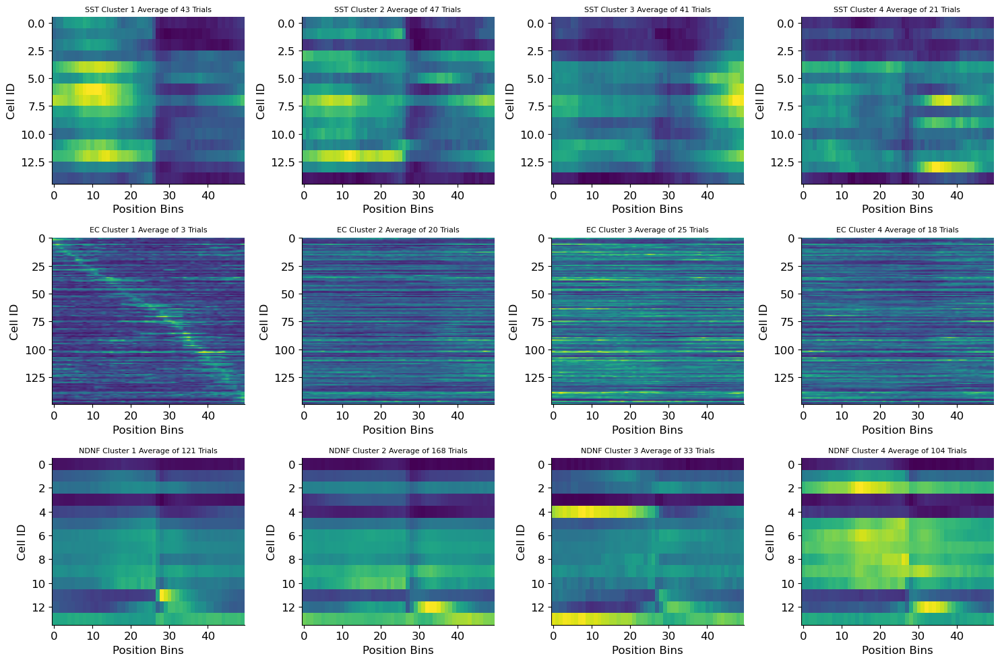

In [64]:
fig, axs = plt.subplots(3, 4, figsize=(15, 10))

axs = axs.flatten()  # 💫 This flattens the 3x4 grid into a 1D list of 12 axes

clusters_SST = [clust_1_SST, clust_2_SST, clust_3_SST, clust_4_SST]
for i, (ax, clust) in enumerate(zip(axs[0:4], clusters_SST), start=1):
    ax.imshow(clust, aspect="auto")
    ax.set_title(f"SST Cluster {i} Average of {counts_SST[i-1]} Trials", fontsize=8)
    ax.set_xlabel("Position Bins")
    ax.set_ylabel("Cell ID")

clusters_EC = [clust_1_EC, clust_2_EC, clust_3_EC, clust_4_EC]
for i, (ax, clust) in enumerate(zip(axs[4:8], clusters_EC), start=1):
    ax.imshow(clust, aspect="auto")
    ax.set_title(f"EC Cluster {i} Average of {counts_EC[i-1]} Trials", fontsize=8)
    ax.set_xlabel("Position Bins")
    ax.set_ylabel("Cell ID")

clusters_NDNF = [clust_1_NDNF, clust_2_NDNF, clust_3_NDNF, clust_4_NDNF]
for i, (ax, clust) in enumerate(zip(axs[8:12], clusters_NDNF), start=1):
    ax.imshow(clust, aspect="auto")
    ax.set_title(f"NDNF Cluster {i} Average of {counts_NDNF[i-1]} Trials", fontsize=8)
    ax.set_xlabel("Position Bins")
    ax.set_ylabel("Cell ID")

plt.tight_layout()
plt.show()


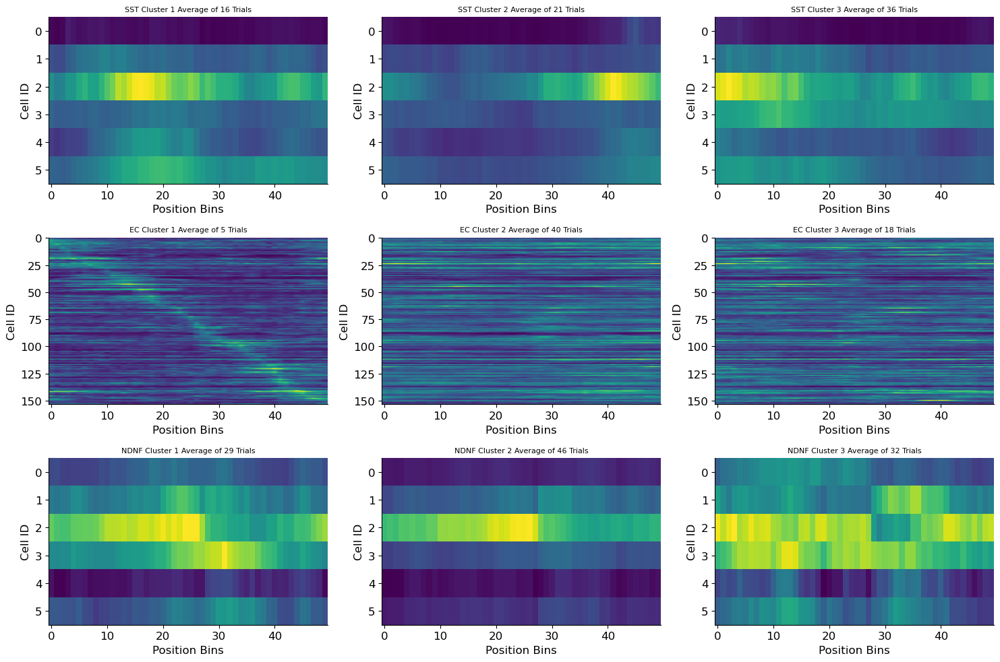

In [82]:
fig, axs = plt.subplots(3, 3, figsize=(15, 10))

axs = axs.flatten()  # 💫 This flattens the 3x4 grid into a 1D list of 12 axes

clusters_SST = [clust_1_SST, clust_2_SST, clust_3_SST]
for i, (ax, clust) in enumerate(zip(axs[0:3], clusters_SST), start=1):
    ax.imshow(clust, aspect="auto")
    ax.set_title(f"SST Cluster {i} Average of {counts_SST[i-1]} Trials", fontsize=8)
    ax.set_xlabel("Position Bins")
    ax.set_ylabel("Cell ID")

clusters_EC = [clust_1_EC, clust_2_EC, clust_3_EC]
for i, (ax, clust) in enumerate(zip(axs[3:6], clusters_EC), start=1):
    ax.imshow(clust, aspect="auto")
    ax.set_title(f"EC Cluster {i} Average of {counts_EC[i-1]} Trials", fontsize=8)
    ax.set_xlabel("Position Bins")
    ax.set_ylabel("Cell ID")

clusters_NDNF = [clust_1_NDNF, clust_2_NDNF, clust_3_NDNF]
for i, (ax, clust) in enumerate(zip(axs[6:9], clusters_NDNF), start=1):
    ax.imshow(clust, aspect="auto")
    ax.set_title(f"NDNF Cluster {i} Average of {counts_NDNF[i-1]} Trials", fontsize=8)
    ax.set_xlabel("Position Bins")
    ax.set_ylabel("Cell ID")

plt.tight_layout()
plt.show()


In [ ]:
### load the animal reassign data 

In [641]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_SST_model_ranks20_kmean_reassign_x00_fixed"
animal_SST_model_ranks20_kmean_reassign_x00_fixed = get_model_data_per_animal(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_SST_model_ranks20_kmean_reassign_00x_fixed"
animal_SST_model_ranks20_kmean_reassign_00x_fixed = get_model_data_per_animal(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_NDNF_model_ranks20_kmean_reassign_x00_fixed"
animal_NDNF_model_ranks20_kmean_reassign_x00_fixed = get_model_data_per_animal(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_NDNF_model_ranks20_kmean_reassign_00x_fixed"
animal_NDNF_model_ranks20_kmean_reassign_00x_fixed = get_model_data_per_animal(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_EC_model_ranks20_kmean_reassign_x00_fixed"
animal_EC_model_ranks20_kmean_reassign_x00_fixed = get_model_data_per_animal(mse_dir)

# mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_EC_model_ranks20_kmean_reassign_00x_fixed"
# animal_EC_model_ranks20_kmean_reassign_x00_fixed = get_model_data_per_animal(mse_dir)

Loaded MSEs for 1 rank(s).
  Rank 20: 10 animals loaded.
Loaded MSEs for 1 rank(s).
  Rank 20: 10 animals loaded.
Loaded MSEs for 1 rank(s).
  Rank 20: 4 animals loaded.
Loaded MSEs for 1 rank(s).
  Rank 20: 4 animals loaded.
Loaded MSEs for 1 rank(s).
  Rank 20: 7 animals loaded.


In [402]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_EC_model_ranks20_contig_00x"
animal_EC_model_ranks20_contig_00x = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_EC_animal_00x = preprocess_animal(animal_EC_model_ranks20_contig_00x, residual_activity_dict_EC, num_clusters=10, reassign_clusters=True, x00=False, umap=False, contiguous=False, ranks=20)


Loaded MSEs for 1 rank(s).
  Rank 20: 7 animals loaded.
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 78 trials
After reassignment:
  Cluster 0: 78 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 77 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 60 trials
  Cluster 2: 17 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 61 trials
  Cluster 2: 17 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 16 trials
  Cluster 2: 1 trials
  Cluster 3: 60 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 16 trials
  Cluster 2: 0 trials
  Cluster 3: 62 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15


clusters_chosen = 8
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 71 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
  Reassigning cluster 7 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
  Cluster 7: 0 trials

clusters_chosen = 9
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 69 trials
  Cluster 2: 2 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Cluster 8: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning clust

Processing cell 42...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 78 trials
After reassignment:
  Cluster 0: 78 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 77 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 60 trials
  Cluster 2: 17 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 61 trials
  Cluster 2: 17 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 16 trials
  Cluster 2: 1 trials
  Cluster 3: 60 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 16 trials
  Cluster 2: 0 trials
  Cluster 3: 62 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 59 trials
  Cluster 3: 1 trials
  


clusters_chosen = 7
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 2 trials
  Cluster 3: 4 trials
  Cluster 4: 1 trials
  Cluster 5: 50 trials
  Cluster 6: 18 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 2 trials
  Cluster 3: 4 trials
  Cluster 4: 0 trials
  Cluster 5: 52 trials
  Cluster 6: 18 trials

clusters_chosen = 8
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 71 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
  Reassigning cluster 7 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials
  Cluster 2: 0 tri


clusters_chosen = 8
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 71 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
  Reassigning cluster 7 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
  Cluster 7: 0 trials

clusters_chosen = 9
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 69 trials
  Cluster 2: 2 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Cluster 8: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning clust


clusters_chosen = 9
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 69 trials
  Cluster 2: 2 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Cluster 8: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
  Reassigning cluster 7 (size=1)...
  Reassigning cluster 8 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 76 trials
  Cluster 2: 2 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
  Cluster 7: 0 trials
  Cluster 8: 0 trials
Processing cell 94...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 78 trials
After reassignment:
  Cluster 0: 78 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 77 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 


clusters_chosen = 7
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 2 trials
  Cluster 3: 4 trials
  Cluster 4: 1 trials
  Cluster 5: 50 trials
  Cluster 6: 18 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 2 trials
  Cluster 3: 4 trials
  Cluster 4: 0 trials
  Cluster 5: 52 trials
  Cluster 6: 18 trials

clusters_chosen = 8
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 71 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
  Reassigning cluster 7 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials
  Cluster 2: 0 tri

After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 16 trials
  Cluster 2: 0 trials
  Cluster 3: 62 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 59 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 61 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 15 trials
  Cluster 2: 1 trials
  Cluster 3: 59 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 15 trials
  Cluster 2: 0 trials
  Cluster 3: 63 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 1 t


clusters_chosen = 9
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 69 trials
  Cluster 2: 2 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Cluster 8: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
  Reassigning cluster 7 (size=1)...
  Reassigning cluster 8 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 76 trials
  Cluster 2: 2 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
  Cluster 7: 0 trials
  Cluster 8: 0 trials
Processing cell 149...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 78 trials
After reassignment:
  Cluster 0: 78 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 77 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0

Processing cell 168...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 78 trials
After reassignment:
  Cluster 0: 78 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 77 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 78 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 60 trials
  Cluster 2: 17 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 61 trials
  Cluster 2: 17 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 16 trials
  Cluster 2: 1 trials
  Cluster 3: 60 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 16 trials
  Cluster 2: 0 trials
  Cluster 3: 62 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 59 trials
  Cluster 3: 1 trials
 

  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 15 trials
  Cluster 2: 61 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 15 trials
  Cluster 2: 1 trials
  Cluster 3: 59 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 15 trials
  Cluster 2: 0 trials
  Cluster 3: 63 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 2 trials
  Cluster 3: 4 trials
  Cluster 4: 1 trials
  Cluster 5: 50 trials
  Cluster 6: 18 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 2 trials
  

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 66 trials
After reassignment:
  Cluster 0: 66 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 65 trials
  Cluster 1: 1 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 64 trials
  Cluster 1: 1 trials
  Cluster 2: 1 trials
  Reassigning cluster 1 (size=1)...
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 17 trials
  Cluster 2: 1 trials
  Cluster 3: 46 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 17 trials
  Cluster 2: 0 trials
  Cluster 3: 47 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 62 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Clus

  Reassigning cluster 3 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 7 (size=1)...
  Reassigning cluster 8 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 8 trials
  Cluster 3: 0 trials
  Cluster 4: 3 trials
  Cluster 5: 0 trials
  Cluster 6: 53 trials
  Cluster 7: 0 trials
  Cluster 8: 0 trials
Processing cell 20...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 66 trials
After reassignment:
  Cluster 0: 66 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 65 trials
  Cluster 1: 1 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 64 trials
  Cluster 1: 1 trials
  Cluster 2: 1 trials
  Reassigning cluster 1 (size=1)...
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trials

clusters_chosen = 4
Before reassignment:
  Cluster

  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials

clusters_chosen = 8
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 59 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
  Reassigning cluster 7 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 66 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials

  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 17 trials
  Cluster 2: 1 trials
  Cluster 3: 46 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 17 trials
  Cluster 2: 0 trials
  Cluster 3: 47 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 62 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 66 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 17 trials
  Cluster 1: 45 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 tr


clusters_chosen = 9
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 8 trials
  Cluster 3: 1 trials
  Cluster 4: 3 trials
  Cluster 5: 1 trials
  Cluster 6: 48 trials
  Cluster 7: 1 trials
  Cluster 8: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 7 (size=1)...
  Reassigning cluster 8 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 8 trials
  Cluster 3: 0 trials
  Cluster 4: 3 trials
  Cluster 5: 0 trials
  Cluster 6: 53 trials
  Cluster 7: 0 trials
  Cluster 8: 0 trials
Processing cell 86...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 66 trials
After reassignment:
  Cluster 0: 66 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 65 trials
  Cluster 1: 1 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials

clusters_chosen = 3
Before reassignment:



clusters_chosen = 8
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 59 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
  Reassigning cluster 7 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 66 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
  Cluster 7: 0 trials

clusters_chosen = 9
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 8 trials
  Cluster 3: 1 trials
  Cluster 4: 3 trials
  Cluster 5: 1 trials
  Cluster 6: 48 trials
  Cluster 7: 1 trials
  Cluster 8: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning clust

  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials

clusters_chosen = 8
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 59 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
  Reassigning cluster 7 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 66 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials


clusters_chosen = 9
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 8 trials
  Cluster 3: 1 trials
  Cluster 4: 3 trials
  Cluster 5: 1 trials
  Cluster 6: 48 trials
  Cluster 7: 1 trials
  Cluster 8: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 7 (size=1)...
  Reassigning cluster 8 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 8 trials
  Cluster 3: 0 trials
  Cluster 4: 3 trials
  Cluster 5: 0 trials
  Cluster 6: 53 trials
  Cluster 7: 0 trials
  Cluster 8: 0 trials
Processing cell 123...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 66 trials
After reassignment:
  Cluster 0: 66 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 65 trials
  Cluster 1: 1 trials
  Reassigning cluster 1 (size=1)...
After reassignment:
  Cluster 0: 66 trials
  Cluster 1: 0 trials

clusters_chosen = 3
Before reassignment:

  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
  Reassigning cluster 7 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 66 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
  Cluster 7: 0 trials

clusters_chosen = 9
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 8 trials
  Cluster 3: 1 trials
  Cluster 4: 3 trials
  Cluster 5: 1 trials
  Cluster 6: 48 trials
  Cluster 7: 1 trials
  Cluster 8: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 7 (size=1)...
  Reassigning cluster 8 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 8 trials
  Cluster 3: 0 trials
  Cluster 4: 3 trials
  Cluster 5: 0 trials
  Cluster 6: 5

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 63 trials
After reassignment:
  Cluster 0: 63 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 17 trials
  Cluster 1: 46 trials
After reassignment:
  Cluster 0: 17 trials
  Cluster 1: 46 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 29 trials
  Cluster 2: 29 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 29 trials
  Cluster 2: 29 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 15 trials
  Cluster 2: 38 trials
  Cluster 3: 9 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 15 trials
  Cluster 2: 38 trials
  Cluster 3: 10 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 trials
  Cluster 3: 5 trials
  Cluster 4: 24 trials
After reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 tria

Processing cell 22...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 63 trials
After reassignment:
  Cluster 0: 63 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 17 trials
  Cluster 1: 46 trials
After reassignment:
  Cluster 0: 17 trials
  Cluster 1: 46 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 29 trials
  Cluster 2: 29 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 29 trials
  Cluster 2: 29 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 15 trials
  Cluster 2: 38 trials
  Cluster 3: 9 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 15 trials
  Cluster 2: 38 trials
  Cluster 3: 10 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 trials
  Cluster 3: 5 trials
  Cluster 4: 24 trials
After reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 tri


clusters_chosen = 4
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 15 trials
  Cluster 2: 38 trials
  Cluster 3: 9 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 15 trials
  Cluster 2: 38 trials
  Cluster 3: 10 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 trials
  Cluster 3: 5 trials
  Cluster 4: 24 trials
After reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 trials
  Cluster 3: 5 trials
  Cluster 4: 24 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 52 trials
  Cluster 4: 4 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 54 trials
  Cluster 4: 4 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reass


clusters_chosen = 8
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 7 trials
  Cluster 2: 10 trials
  Cluster 3: 5 trials
  Cluster 4: 13 trials
  Cluster 5: 1 trials
  Cluster 6: 23 trials
  Cluster 7: 1 trials
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 7 (size=1)...
After reassignment:
  Cluster 0: 3 trials
  Cluster 1: 7 trials
  Cluster 2: 10 trials
  Cluster 3: 5 trials
  Cluster 4: 13 trials
  Cluster 5: 0 trials
  Cluster 6: 25 trials
  Cluster 7: 0 trials

clusters_chosen = 9
Before reassignment:
  Cluster 0: 10 trials
  Cluster 1: 1 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 31 trials
  Cluster 6: 14 trials
  Cluster 7: 3 trials
  Cluster 8: 1 trials
  Reassigning cluster 1 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 8 (size=1)...
After reassignment:
  Cluster 0: 10 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trial


clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 52 trials
  Cluster 4: 4 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 54 trials
  Cluster 4: 4 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 13 trials
  Cluster 2: 2 trials
  Cluster 3: 42 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 3 trials
  Cluster 1: 13 trials
  Cluster 2: 2 trials
  Cluster 3: 45 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials

clusters_chosen = 8
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 7 trials
  Cluster 2: 10 trials
  Cluster


clusters_chosen = 3
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 29 trials
  Cluster 2: 29 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 29 trials
  Cluster 2: 29 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 15 trials
  Cluster 2: 38 trials
  Cluster 3: 9 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 15 trials
  Cluster 2: 38 trials
  Cluster 3: 10 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 trials
  Cluster 3: 5 trials
  Cluster 4: 24 trials
After reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 trials
  Cluster 3: 5 trials
  Cluster 4: 24 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 52 trials
  Cluster 4: 4 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 5 


clusters_chosen = 5
Before reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 trials
  Cluster 3: 5 trials
  Cluster 4: 24 trials
After reassignment:
  Cluster 0: 8 trials
  Cluster 1: 13 trials
  Cluster 2: 13 trials
  Cluster 3: 5 trials
  Cluster 4: 24 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 52 trials
  Cluster 4: 4 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 2 trials
  Cluster 2: 3 trials
  Cluster 3: 54 trials
  Cluster 4: 4 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 13 trials
  Cluster 2: 2 trials
  Cluster 3: 42 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After 

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 64 trials
After reassignment:
  Cluster 0: 64 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 50 trials
After reassignment:
  Cluster 0: 14 trials
  Cluster 1: 50 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
  Cluster 3: 1 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
  Cluster 3: 0 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 60 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cl


clusters_chosen = 3
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
  Cluster 3: 1 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
  Cluster 3: 0 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 60 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 64 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 59 trials
  Cluster

  Reassigning cluster 1 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 0 trials
  Cluster 2: 2 trials
  Cluster 3: 48 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
  Cluster 7: 14 trials

clusters_chosen = 9
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 4 trials
  Cluster 2: 18 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Cluster 8: 36 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
  Reassigning cluster 7 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 4 trials
  Cluster 2: 18 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
  Cluster 7: 0 trials
  C


clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
  Cluster 3: 1 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 2 trials
  Cluster 2: 47 trials
  Cluster 3: 0 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 60 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 64 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 59 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigni

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 145 trials
After reassignment:
  Cluster 0: 145 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 140 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 140 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 91 trials
  Cluster 2: 53 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 92 trials
  Cluster 2: 53 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 45 trials
  Cluster 2: 91 trials
  Cluster 3: 7 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 45 trials
  Cluster 2: 91 trials
  Cluster 3: 7 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 4 trials
  Cluster 2: 33 trials
  Cluster 3: 87 trials
  Cluster 4: 19 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 4 trials
  Cluster 2: 33 tria


clusters_chosen = 2
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 140 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 140 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 91 trials
  Cluster 2: 53 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 92 trials
  Cluster 2: 53 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 45 trials
  Cluster 2: 91 trials
  Cluster 3: 7 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 45 trials
  Cluster 2: 91 trials
  Cluster 3: 7 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 4 trials
  Cluster 2: 33 trials
  Cluster 3: 87 trials
  Cluster 4: 19 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 4 trials
  Cluster 2: 33 trials
  Cluster 3: 87 trials
  Cluster 4: 19 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 53 tr


clusters_chosen = 6
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 53 trials
  Cluster 2: 1 trials
  Cluster 3: 82 trials
  Cluster 4: 6 trials
  Cluster 5: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 53 trials
  Cluster 2: 0 trials
  Cluster 3: 84 trials
  Cluster 4: 6 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 18 trials
  Cluster 1: 1 trials
  Cluster 2: 16 trials
  Cluster 3: 42 trials
  Cluster 4: 49 trials
  Cluster 5: 1 trials
  Cluster 6: 18 trials
  Reassigning cluster 1 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 18 trials
  Cluster 1: 0 trials
  Cluster 2: 16 trials
  Cluster 3: 44 trials
  Cluster 4: 49 trials
  Cluster 5: 0 trials
  Cluster 6: 18 trials

clusters_chosen = 8
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 1 trials
  Cluster 2: 9 trials
  Cluster 3: 1 trials
  Cluster 4: 1 t


clusters_chosen = 9
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 31 trials
  Cluster 2: 8 trials
  Cluster 3: 14 trials
  Cluster 4: 1 trials
  Cluster 5: 1 trials
  Cluster 6: 1 trials
  Cluster 7: 1 trials
  Cluster 8: 73 trials
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 6 (size=1)...
  Reassigning cluster 7 (size=1)...
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 32 trials
  Cluster 2: 8 trials
  Cluster 3: 14 trials
  Cluster 4: 0 trials
  Cluster 5: 0 trials
  Cluster 6: 0 trials
  Cluster 7: 0 trials
  Cluster 8: 76 trials
Processing cell 48...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 145 trials
After reassignment:
  Cluster 0: 145 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 140 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 140 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 91 trials
  Cluster 2: 53 t


clusters_chosen = 7
Before reassignment:
  Cluster 0: 18 trials
  Cluster 1: 1 trials
  Cluster 2: 16 trials
  Cluster 3: 42 trials
  Cluster 4: 49 trials
  Cluster 5: 1 trials
  Cluster 6: 18 trials
  Reassigning cluster 1 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 18 trials
  Cluster 1: 0 trials
  Cluster 2: 16 trials
  Cluster 3: 44 trials
  Cluster 4: 49 trials
  Cluster 5: 0 trials
  Cluster 6: 18 trials

clusters_chosen = 8
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 1 trials
  Cluster 2: 9 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 95 trials
  Cluster 6: 34 trials
  Cluster 7: 1 trials
  Reassigning cluster 1 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 7 (size=1)...
After reassignment:
  Cluster 0: 3 trials
  Cluster 1: 0 trials
  Cluster 2: 9 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 98 trials
  Cluster 6: 35 trials
  Cluste


clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 45 trials
  Cluster 2: 91 trials
  Cluster 3: 7 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 45 trials
  Cluster 2: 91 trials
  Cluster 3: 7 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 4 trials
  Cluster 2: 33 trials
  Cluster 3: 87 trials
  Cluster 4: 19 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 4 trials
  Cluster 2: 33 trials
  Cluster 3: 87 trials
  Cluster 4: 19 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 53 trials
  Cluster 2: 1 trials
  Cluster 3: 82 trials
  Cluster 4: 6 trials
  Cluster 5: 1 trials
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 5 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 53 trials
  Cluster 2: 0 trials
  Cluster 3: 84 trials
  Cluster 4: 6 trials
  Cluster 5: 0 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 18 trials
  C


clusters_chosen = 2
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 140 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 140 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 91 trials
  Cluster 2: 53 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 92 trials
  Cluster 2: 53 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 45 trials
  Cluster 2: 91 trials
  Cluster 3: 7 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 45 trials
  Cluster 2: 91 trials
  Cluster 3: 7 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 4 trials
  Cluster 2: 33 trials
  Cluster 3: 87 trials
  Cluster 4: 19 trials
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 4 trials
  Cluster 2: 33 trials
  Cluster 3: 87 trials
  Cluster 4: 19 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 53 tr

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 58 trials
After reassignment:
  Cluster 0: 58 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 53 trials
  Cluster 1: 5 trials
After reassignment:
  Cluster 0: 53 trials
  Cluster 1: 5 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 41 trials
  Cluster 1: 14 trials
  Cluster 2: 3 trials
After reassignment:
  Cluster 0: 41 trials
  Cluster 1: 14 trials
  Cluster 2: 3 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 52 trials
  Cluster 2: 1 trials
  Cluster 3: 3 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 53 trials
  Cluster 2: 0 trials
  Cluster 3: 3 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 7 trials
  Cluster 1: 45 trials
  Cluster 2: 3 trials
  Cluster 3: 1 trials
  Cluster 4: 2 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 7 trials
  Cluster 1: 4

After reassignment:
  Cluster 0: 41 trials
  Cluster 1: 14 trials
  Cluster 2: 3 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 52 trials
  Cluster 2: 1 trials
  Cluster 3: 3 trials
  Reassigning cluster 2 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluster 1: 53 trials
  Cluster 2: 0 trials
  Cluster 3: 3 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 7 trials
  Cluster 1: 45 trials
  Cluster 2: 3 trials
  Cluster 3: 1 trials
  Cluster 4: 2 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 7 trials
  Cluster 1: 46 trials
  Cluster 2: 3 trials
  Cluster 3: 0 trials
  Cluster 4: 2 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 10 trials
  Cluster 2: 2 trials
  Cluster 3: 17 trials
  Cluster 4: 3 trials
  Cluster 5: 25 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 10 trials
  Cluster 2: 2 trials
  Cluster 3: 18 


clusters_chosen = 9
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 12 trials
  Cluster 2: 9 trials
  Cluster 3: 3 trials
  Cluster 4: 28 trials
  Cluster 5: 1 trials
  Cluster 6: 2 trials
  Cluster 7: 1 trials
  Cluster 8: 1 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 5 (size=1)...
  Reassigning cluster 7 (size=1)...
  Reassigning cluster 8 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 12 trials
  Cluster 2: 9 trials
  Cluster 3: 3 trials
  Cluster 4: 32 trials
  Cluster 5: 0 trials
  Cluster 6: 2 trials
  Cluster 7: 0 trials
  Cluster 8: 0 trials
Processing cell 44...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 58 trials
After reassignment:
  Cluster 0: 58 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 53 trials
  Cluster 1: 5 trials
After reassignment:
  Cluster 0: 53 trials
  Cluster 1: 5 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 41 trials
  Cluster 1: 14 trials
  Cluster 2: 3 trials
Af

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 101 trials
After reassignment:
  Cluster 0: 101 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 96 trials
  Cluster 1: 5 trials
After reassignment:
  Cluster 0: 96 trials
  Cluster 1: 5 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 18 trials
  Cluster 2: 82 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 18 trials
  Cluster 2: 83 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 4 trials
  Cluster 2: 68 trials
  Cluster 3: 15 trials
After reassignment:
  Cluster 0: 14 trials
  Cluster 1: 4 trials
  Cluster 2: 68 trials
  Cluster 3: 15 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 6 trials
  Cluster 1: 75 trials
  Cluster 2: 18 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassig


clusters_chosen = 6
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 17 trials
  Cluster 2: 10 trials
  Cluster 3: 5 trials
  Cluster 4: 1 trials
  Cluster 5: 67 trials
  Reassigning cluster 0 (size=1)...
  Reassigning cluster 4 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 17 trials
  Cluster 2: 10 trials
  Cluster 3: 5 trials
  Cluster 4: 0 trials
  Cluster 5: 69 trials

clusters_chosen = 7
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 43 trials
  Cluster 2: 8 trials
  Cluster 3: 1 trials
  Cluster 4: 1 trials
  Cluster 5: 42 trials
  Cluster 6: 1 trials
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 4 (size=1)...
  Reassigning cluster 6 (size=1)...
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 46 trials
  Cluster 2: 8 trials
  Cluster 3: 0 trials
  Cluster 4: 0 trials
  Cluster 5: 42 trials
  Cluster 6: 0 trials

clusters_chosen = 8
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 1 trials
  Cluster 2: 43 trials
  Clu

  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 7 (size=1)...
  Reassigning cluster 8 (size=1)...
After reassignment:
  Cluster 0: 26 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 4 trials
  Cluster 5: 13 trials
  Cluster 6: 58 trials
  Cluster 7: 0 trials
  Cluster 8: 0 trials
Processing cell 43...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 101 trials
After reassignment:
  Cluster 0: 101 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 96 trials
  Cluster 1: 5 trials
After reassignment:
  Cluster 0: 96 trials
  Cluster 1: 5 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 18 trials
  Cluster 2: 82 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 18 trials
  Cluster 2: 83 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 4 trials
  Cluster 2: 68 trials
  Clust


clusters_chosen = 9
Before reassignment:
  Cluster 0: 26 trials
  Cluster 1: 1 trials
  Cluster 2: 1 trials
  Cluster 3: 1 trials
  Cluster 4: 4 trials
  Cluster 5: 13 trials
  Cluster 6: 53 trials
  Cluster 7: 1 trials
  Cluster 8: 1 trials
  Reassigning cluster 1 (size=1)...
  Reassigning cluster 2 (size=1)...
  Reassigning cluster 3 (size=1)...
  Reassigning cluster 7 (size=1)...
  Reassigning cluster 8 (size=1)...
After reassignment:
  Cluster 0: 26 trials
  Cluster 1: 0 trials
  Cluster 2: 0 trials
  Cluster 3: 0 trials
  Cluster 4: 4 trials
  Cluster 5: 13 trials
  Cluster 6: 58 trials
  Cluster 7: 0 trials
  Cluster 8: 0 trials
Processing cell 69...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 101 trials
After reassignment:
  Cluster 0: 101 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 96 trials
  Cluster 1: 5 trials
After reassignment:
  Cluster 0: 96 trials
  Cluster 1: 5 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluste

In [423]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_SST_model_ranks20_contig_00x"
animal_SST_model_ranks20_contig_00x = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_SST_animal_00x = preprocess_animal(animal_SST_model_ranks20_contig_00x, residual_activity_dict_SST, num_clusters=10, reassign_clusters=True, x00=False, umap=False, contiguous=False, ranks=20)


Loaded MSEs for 1 rank(s).
  Rank 20: 10 animals loaded.
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 212 trials
After reassignment:
  Cluster 0: 212 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 92 trials
  Cluster 1: 120 trials
After reassignment:
  Cluster 0: 92 trials
  Cluster 1: 120 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 54 trials
  Cluster 1: 50 trials
  Cluster 2: 108 trials
After reassignment:
  Cluster 0: 54 trials
  Cluster 1: 50 trials
  Cluster 2: 108 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 21 trials
  Cluster 1: 29 trials
  Cluster 2: 119 trials
  Cluster 3: 43 trials
After reassignment:
  Cluster 0: 21 trials
  Cluster 1: 29 trials
  Cluster 2: 119 trials
  Cluster 3: 43 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 29 trials
  Cluster 1: 28 trials
  Cluster 2: 105 trials
  Cluster 3: 30 trials
  Cluster 4: 20 trials
After reassignment:
  Cluster 0: 29 trials
  Clu

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 152 trials
After reassignment:
  Cluster 0: 152 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 70 trials
  Cluster 1: 82 trials
After reassignment:
  Cluster 0: 70 trials
  Cluster 1: 82 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 54 trials
  Cluster 1: 67 trials
  Cluster 2: 31 trials
After reassignment:
  Cluster 0: 54 trials
  Cluster 1: 67 trials
  Cluster 2: 31 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 41 trials
  Cluster 1: 47 trials
  Cluster 2: 44 trials
  Cluster 3: 20 trials
After reassignment:
  Cluster 0: 41 trials
  Cluster 1: 47 trials
  Cluster 2: 44 trials
  Cluster 3: 20 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 4 trials
  Cluster 1: 44 trials
  Cluster 2: 24 trials
  Cluster 3: 43 trials
  Cluster 4: 37 trials
After reassignment:
  Cluster 0: 4 trials
  Cluster 1: 44 trials
  Cluster 2: 24 trials
  Cluster 3: 43 trials
  

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 73 trials
After reassignment:
  Cluster 0: 73 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 63 trials
  Cluster 1: 10 trials
After reassignment:
  Cluster 0: 63 trials
  Cluster 1: 10 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 34 trials
  Cluster 1: 27 trials
  Cluster 2: 12 trials
After reassignment:
  Cluster 0: 34 trials
  Cluster 1: 27 trials
  Cluster 2: 12 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 23 trials
  Cluster 1: 14 trials
  Cluster 2: 4 trials
  Cluster 3: 32 trials
After reassignment:
  Cluster 0: 23 trials
  Cluster 1: 14 trials
  Cluster 2: 4 trials
  Cluster 3: 32 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 24 trials
  Cluster 1: 7 trials
  Cluster 2: 39 trials
  Cluster 3: 1 trials
  Cluster 4: 2 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 24 trials
  Cluster 1: 8 trials
  Cluster 2: 39 tr

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 137 trials
After reassignment:
  Cluster 0: 137 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 65 trials
  Cluster 1: 72 trials
After reassignment:
  Cluster 0: 65 trials
  Cluster 1: 72 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 68 trials
  Cluster 1: 33 trials
  Cluster 2: 36 trials
After reassignment:
  Cluster 0: 68 trials
  Cluster 1: 33 trials
  Cluster 2: 36 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 21 trials
  Cluster 1: 43 trials
  Cluster 2: 48 trials
  Cluster 3: 25 trials
After reassignment:
  Cluster 0: 21 trials
  Cluster 1: 43 trials
  Cluster 2: 48 trials
  Cluster 3: 25 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 23 trials
  Cluster 1: 30 trials
  Cluster 2: 19 trials
  Cluster 3: 30 trials
  Cluster 4: 35 trials
After reassignment:
  Cluster 0: 23 trials
  Cluster 1: 30 trials
  Cluster 2: 19 trials
  Cluster 3: 30 trials


Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 63 trials
After reassignment:
  Cluster 0: 63 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 46 trials
  Cluster 1: 17 trials
After reassignment:
  Cluster 0: 46 trials
  Cluster 1: 17 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 1 trials
  Cluster 1: 23 trials
  Cluster 2: 39 trials
  Reassigning cluster 0 (size=1)...
After reassignment:
  Cluster 0: 0 trials
  Cluster 1: 23 trials
  Cluster 2: 40 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 5 trials
  Cluster 1: 21 trials
  Cluster 2: 8 trials
  Cluster 3: 29 trials
After reassignment:
  Cluster 0: 5 trials
  Cluster 1: 21 trials
  Cluster 2: 8 trials
  Cluster 3: 29 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 2 trials
  Cluster 1: 19 trials
  Cluster 2: 25 trials
  Cluster 3: 1 trials
  Cluster 4: 16 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 2 trials
  Cluste

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 163 trials
After reassignment:
  Cluster 0: 163 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 86 trials
  Cluster 1: 77 trials
After reassignment:
  Cluster 0: 86 trials
  Cluster 1: 77 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 26 trials
  Cluster 1: 59 trials
  Cluster 2: 78 trials
After reassignment:
  Cluster 0: 26 trials
  Cluster 1: 59 trials
  Cluster 2: 78 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 49 trials
  Cluster 1: 22 trials
  Cluster 2: 54 trials
  Cluster 3: 38 trials
After reassignment:
  Cluster 0: 49 trials
  Cluster 1: 22 trials
  Cluster 2: 54 trials
  Cluster 3: 38 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 10 trials
  Cluster 1: 50 trials
  Cluster 2: 50 trials
  Cluster 3: 33 trials
  Cluster 4: 20 trials
After reassignment:
  Cluster 0: 10 trials
  Cluster 1: 50 trials
  Cluster 2: 50 trials
  Cluster 3: 33 trials


Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 82 trials
After reassignment:
  Cluster 0: 82 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 29 trials
  Cluster 1: 53 trials
After reassignment:
  Cluster 0: 29 trials
  Cluster 1: 53 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 13 trials
  Cluster 1: 23 trials
  Cluster 2: 46 trials
After reassignment:
  Cluster 0: 13 trials
  Cluster 1: 23 trials
  Cluster 2: 46 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 23 trials
  Cluster 1: 14 trials
  Cluster 2: 30 trials
  Cluster 3: 15 trials
After reassignment:
  Cluster 0: 23 trials
  Cluster 1: 14 trials
  Cluster 2: 30 trials
  Cluster 3: 15 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 16 trials
  Cluster 2: 9 trials
  Cluster 3: 23 trials
  Cluster 4: 19 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 16 trials
  Cluster 2: 9 trials
  Cluster 3: 23 trials
  Cl

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 177 trials
After reassignment:
  Cluster 0: 177 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 69 trials
  Cluster 1: 108 trials
After reassignment:
  Cluster 0: 69 trials
  Cluster 1: 108 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 26 trials
  Cluster 1: 58 trials
  Cluster 2: 93 trials
After reassignment:
  Cluster 0: 26 trials
  Cluster 1: 58 trials
  Cluster 2: 93 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 19 trials
  Cluster 1: 68 trials
  Cluster 2: 39 trials
  Cluster 3: 51 trials
After reassignment:
  Cluster 0: 19 trials
  Cluster 1: 68 trials
  Cluster 2: 39 trials
  Cluster 3: 51 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 94 trials
  Cluster 1: 27 trials
  Cluster 2: 42 trials
  Cluster 3: 1 trials
  Cluster 4: 13 trials
  Reassigning cluster 3 (size=1)...
After reassignment:
  Cluster 0: 94 trials
  Cluster 1: 27 trials
  Cluster

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 149 trials
After reassignment:
  Cluster 0: 149 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 84 trials
  Cluster 1: 65 trials
After reassignment:
  Cluster 0: 84 trials
  Cluster 1: 65 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 50 trials
  Cluster 1: 53 trials
  Cluster 2: 46 trials
After reassignment:
  Cluster 0: 50 trials
  Cluster 1: 53 trials
  Cluster 2: 46 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 11 trials
  Cluster 1: 56 trials
  Cluster 2: 32 trials
  Cluster 3: 50 trials
After reassignment:
  Cluster 0: 11 trials
  Cluster 1: 56 trials
  Cluster 2: 32 trials
  Cluster 3: 50 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 33 trials
  Cluster 1: 11 trials
  Cluster 2: 30 trials
  Cluster 3: 42 trials
  Cluster 4: 33 trials
After reassignment:
  Cluster 0: 33 trials
  Cluster 1: 11 trials
  Cluster 2: 30 trials
  Cluster 3: 42 trials


In [406]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_SST_model_ranks20_contig_x00"
animal_SST_model_ranks20_contig_x00 = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_SST_animal_x00 = preprocess_animal(animal_SST_model_ranks20_contig_x00, residual_activity_dict_SST, num_clusters=10, reassign_clusters=True, x00=True, umap=False, contiguous=False, ranks=20)


Loaded MSEs for 1 rank(s).
  Rank 20: 10 animals loaded.
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 212 trials
After reassignment:
  Cluster 0: 212 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 125 trials
  Cluster 1: 87 trials
After reassignment:
  Cluster 0: 125 trials
  Cluster 1: 87 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 52 trials
  Cluster 1: 97 trials
  Cluster 2: 63 trials
After reassignment:
  Cluster 0: 52 trials
  Cluster 1: 97 trials
  Cluster 2: 63 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 87 trials
  Cluster 1: 52 trials
  Cluster 2: 41 trials
  Cluster 3: 32 trials
After reassignment:
  Cluster 0: 87 trials
  Cluster 1: 52 trials
  Cluster 2: 41 trials
  Cluster 3: 32 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 34 trials
  Cluster 1: 67 trials
  Cluster 2: 44 trials
  Cluster 3: 29 trials
  Cluster 4: 38 trials
After reassignment:
  Cluster 0: 34 trials
  Cluster 

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 152 trials
After reassignment:
  Cluster 0: 152 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 91 trials
  Cluster 1: 61 trials
After reassignment:
  Cluster 0: 91 trials
  Cluster 1: 61 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 43 trials
  Cluster 1: 55 trials
  Cluster 2: 54 trials
After reassignment:
  Cluster 0: 43 trials
  Cluster 1: 55 trials
  Cluster 2: 54 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 43 trials
  Cluster 1: 47 trials
  Cluster 2: 41 trials
  Cluster 3: 21 trials
After reassignment:
  Cluster 0: 43 trials
  Cluster 1: 47 trials
  Cluster 2: 41 trials
  Cluster 3: 21 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 20 trials
  Cluster 1: 23 trials
  Cluster 2: 30 trials
  Cluster 3: 18 trials
  Cluster 4: 61 trials
After reassignment:
  Cluster 0: 20 trials
  Cluster 1: 23 trials
  Cluster 2: 30 trials
  Cluster 3: 18 trials


Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 73 trials
After reassignment:
  Cluster 0: 73 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 28 trials
  Cluster 1: 45 trials
After reassignment:
  Cluster 0: 28 trials
  Cluster 1: 45 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 16 trials
  Cluster 1: 21 trials
  Cluster 2: 36 trials
After reassignment:
  Cluster 0: 16 trials
  Cluster 1: 21 trials
  Cluster 2: 36 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 42 trials
  Cluster 1: 10 trials
  Cluster 2: 7 trials
  Cluster 3: 14 trials
After reassignment:
  Cluster 0: 42 trials
  Cluster 1: 10 trials
  Cluster 2: 7 trials
  Cluster 3: 14 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 24 trials
  Cluster 1: 12 trials
  Cluster 2: 9 trials
  Cluster 3: 18 trials
  Cluster 4: 10 trials
After reassignment:
  Cluster 0: 24 trials
  Cluster 1: 12 trials
  Cluster 2: 9 trials
  Cluster 3: 18 trials
  Clus

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 137 trials
After reassignment:
  Cluster 0: 137 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 51 trials
  Cluster 1: 86 trials
After reassignment:
  Cluster 0: 51 trials
  Cluster 1: 86 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 49 trials
  Cluster 1: 27 trials
  Cluster 2: 61 trials
After reassignment:
  Cluster 0: 49 trials
  Cluster 1: 27 trials
  Cluster 2: 61 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 30 trials
  Cluster 1: 35 trials
  Cluster 2: 28 trials
  Cluster 3: 44 trials
After reassignment:
  Cluster 0: 30 trials
  Cluster 1: 35 trials
  Cluster 2: 28 trials
  Cluster 3: 44 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 26 trials
  Cluster 1: 25 trials
  Cluster 2: 26 trials
  Cluster 3: 36 trials
  Cluster 4: 24 trials
After reassignment:
  Cluster 0: 26 trials
  Cluster 1: 25 trials
  Cluster 2: 26 trials
  Cluster 3: 36 trials


Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 63 trials
After reassignment:
  Cluster 0: 63 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 25 trials
  Cluster 1: 38 trials
After reassignment:
  Cluster 0: 25 trials
  Cluster 1: 38 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 32 trials
  Cluster 1: 6 trials
  Cluster 2: 25 trials
After reassignment:
  Cluster 0: 32 trials
  Cluster 1: 6 trials
  Cluster 2: 25 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 9 trials
  Cluster 1: 10 trials
  Cluster 2: 17 trials
  Cluster 3: 27 trials
After reassignment:
  Cluster 0: 9 trials
  Cluster 1: 10 trials
  Cluster 2: 17 trials
  Cluster 3: 27 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 9 trials
  Cluster 1: 20 trials
  Cluster 2: 3 trials
  Cluster 3: 22 trials
  Cluster 4: 9 trials
After reassignment:
  Cluster 0: 9 trials
  Cluster 1: 20 trials
  Cluster 2: 3 trials
  Cluster 3: 22 trials
  Cluster 4

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 163 trials
After reassignment:
  Cluster 0: 163 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 100 trials
  Cluster 1: 63 trials
After reassignment:
  Cluster 0: 100 trials
  Cluster 1: 63 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 72 trials
  Cluster 1: 62 trials
  Cluster 2: 29 trials
After reassignment:
  Cluster 0: 72 trials
  Cluster 1: 62 trials
  Cluster 2: 29 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 26 trials
  Cluster 1: 37 trials
  Cluster 2: 62 trials
  Cluster 3: 38 trials
After reassignment:
  Cluster 0: 26 trials
  Cluster 1: 37 trials
  Cluster 2: 62 trials
  Cluster 3: 38 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 41 trials
  Cluster 1: 11 trials
  Cluster 2: 55 trials
  Cluster 3: 36 trials
  Cluster 4: 20 trials
After reassignment:
  Cluster 0: 41 trials
  Cluster 1: 11 trials
  Cluster 2: 55 trials
  Cluster 3: 36 trial


clusters_chosen = 9
Before reassignment:
  Cluster 0: 9 trials
  Cluster 1: 17 trials
  Cluster 2: 28 trials
  Cluster 3: 18 trials
  Cluster 4: 16 trials
  Cluster 5: 16 trials
  Cluster 6: 28 trials
  Cluster 7: 27 trials
  Cluster 8: 4 trials
After reassignment:
  Cluster 0: 9 trials
  Cluster 1: 17 trials
  Cluster 2: 28 trials
  Cluster 3: 18 trials
  Cluster 4: 16 trials
  Cluster 5: 16 trials
  Cluster 6: 28 trials
  Cluster 7: 27 trials
  Cluster 8: 4 trials
Processing cell 12...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 163 trials
After reassignment:
  Cluster 0: 163 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 100 trials
  Cluster 1: 63 trials
After reassignment:
  Cluster 0: 100 trials
  Cluster 1: 63 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 72 trials
  Cluster 1: 62 trials
  Cluster 2: 29 trials
After reassignment:
  Cluster 0: 72 trials
  Cluster 1: 62 trials
  Cluster 2: 29 trials

clusters_chosen = 4
Before reassignment

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 177 trials
After reassignment:
  Cluster 0: 177 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 126 trials
  Cluster 1: 51 trials
After reassignment:
  Cluster 0: 126 trials
  Cluster 1: 51 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 36 trials
  Cluster 1: 63 trials
  Cluster 2: 78 trials
After reassignment:
  Cluster 0: 36 trials
  Cluster 1: 63 trials
  Cluster 2: 78 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 62 trials
  Cluster 1: 58 trials
  Cluster 2: 28 trials
  Cluster 3: 29 trials
After reassignment:
  Cluster 0: 62 trials
  Cluster 1: 58 trials
  Cluster 2: 28 trials
  Cluster 3: 29 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 26 trials
  Cluster 1: 20 trials
  Cluster 2: 81 trials
  Cluster 3: 6 trials
  Cluster 4: 44 trials
After reassignment:
  Cluster 0: 26 trials
  Cluster 1: 20 trials
  Cluster 2: 81 trials
  Cluster 3: 6 trials


Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 149 trials
After reassignment:
  Cluster 0: 149 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 57 trials
  Cluster 1: 92 trials
After reassignment:
  Cluster 0: 57 trials
  Cluster 1: 92 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 50 trials
  Cluster 1: 59 trials
  Cluster 2: 40 trials
After reassignment:
  Cluster 0: 50 trials
  Cluster 1: 59 trials
  Cluster 2: 40 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 43 trials
  Cluster 1: 49 trials
  Cluster 2: 28 trials
  Cluster 3: 29 trials
After reassignment:
  Cluster 0: 43 trials
  Cluster 1: 49 trials
  Cluster 2: 28 trials
  Cluster 3: 29 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 42 trials
  Cluster 1: 43 trials
  Cluster 2: 10 trials
  Cluster 3: 35 trials
  Cluster 4: 19 trials
After reassignment:
  Cluster 0: 42 trials
  Cluster 1: 43 trials
  Cluster 2: 10 trials
  Cluster 3: 35 trials



clusters_chosen = 9
Before reassignment:
  Cluster 0: 13 trials
  Cluster 1: 12 trials
  Cluster 2: 7 trials
  Cluster 3: 26 trials
  Cluster 4: 18 trials
  Cluster 5: 16 trials
  Cluster 6: 21 trials
  Cluster 7: 14 trials
  Cluster 8: 22 trials
After reassignment:
  Cluster 0: 13 trials
  Cluster 1: 12 trials
  Cluster 2: 7 trials
  Cluster 3: 26 trials
  Cluster 4: 18 trials
  Cluster 5: 16 trials
  Cluster 6: 21 trials
  Cluster 7: 14 trials
  Cluster 8: 22 trials


In [409]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_NDNF_model_ranks20_contig_00x"
animal_NDNF_model_ranks20_contig_00x = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_NDNF_animal_00x = preprocess_animal(animal_NDNF_model_ranks20_contig_00x, residual_activity_dict_NDNF, num_clusters=10, reassign_clusters=True, x00=False, umap=False, contiguous=False, ranks=20)


Loaded MSEs for 1 rank(s).
  Rank 20: 4 animals loaded.
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 52 trials
After reassignment:
  Cluster 0: 52 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 7 trials
  Cluster 1: 45 trials
After reassignment:
  Cluster 0: 7 trials
  Cluster 1: 45 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 6 trials
  Cluster 1: 8 trials
  Cluster 2: 38 trials
After reassignment:
  Cluster 0: 6 trials
  Cluster 1: 8 trials
  Cluster 2: 38 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 14 trials
  Cluster 1: 2 trials
  Cluster 2: 22 trials
  Cluster 3: 14 trials
After reassignment:
  Cluster 0: 14 trials
  Cluster 1: 2 trials
  Cluster 2: 22 trials
  Cluster 3: 14 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 16 trials
  Cluster 1: 8 trials
  Cluster 2: 2 trials
  Cluster 3: 4 trials
  Cluster 4: 22 trials
After reassignment:
  Cluster 0: 16 trials
  Cluster 1: 8 trials
  Cl

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 426 trials
After reassignment:
  Cluster 0: 426 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 150 trials
  Cluster 1: 276 trials
After reassignment:
  Cluster 0: 150 trials
  Cluster 1: 276 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 134 trials
  Cluster 1: 84 trials
  Cluster 2: 208 trials
After reassignment:
  Cluster 0: 134 trials
  Cluster 1: 84 trials
  Cluster 2: 208 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 52 trials
  Cluster 1: 102 trials
  Cluster 2: 201 trials
  Cluster 3: 71 trials
After reassignment:
  Cluster 0: 52 trials
  Cluster 1: 102 trials
  Cluster 2: 201 trials
  Cluster 3: 71 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 182 trials
  Cluster 1: 44 trials
  Cluster 2: 89 trials
  Cluster 3: 82 trials
  Cluster 4: 29 trials
After reassignment:
  Cluster 0: 182 trials
  Cluster 1: 44 trials
  Cluster 2: 89 trials
  Cluster


clusters_chosen = 2
Before reassignment:
  Cluster 0: 150 trials
  Cluster 1: 276 trials
After reassignment:
  Cluster 0: 150 trials
  Cluster 1: 276 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 134 trials
  Cluster 1: 84 trials
  Cluster 2: 208 trials
After reassignment:
  Cluster 0: 134 trials
  Cluster 1: 84 trials
  Cluster 2: 208 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 52 trials
  Cluster 1: 102 trials
  Cluster 2: 201 trials
  Cluster 3: 71 trials
After reassignment:
  Cluster 0: 52 trials
  Cluster 1: 102 trials
  Cluster 2: 201 trials
  Cluster 3: 71 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 182 trials
  Cluster 1: 44 trials
  Cluster 2: 89 trials
  Cluster 3: 82 trials
  Cluster 4: 29 trials
After reassignment:
  Cluster 0: 182 trials
  Cluster 1: 44 trials
  Cluster 2: 89 trials
  Cluster 3: 82 trials
  Cluster 4: 29 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 114 trials
  Cluster 1: 84 trials
  Clu

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 390 trials
After reassignment:
  Cluster 0: 390 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 186 trials
  Cluster 1: 204 trials
After reassignment:
  Cluster 0: 186 trials
  Cluster 1: 204 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 157 trials
  Cluster 1: 108 trials
  Cluster 2: 125 trials
After reassignment:
  Cluster 0: 157 trials
  Cluster 1: 108 trials
  Cluster 2: 125 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 3 trials
  Cluster 1: 151 trials
  Cluster 2: 51 trials
  Cluster 3: 185 trials
After reassignment:
  Cluster 0: 3 trials
  Cluster 1: 151 trials
  Cluster 2: 51 trials
  Cluster 3: 185 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 30 trials
  Cluster 1: 96 trials
  Cluster 2: 138 trials
  Cluster 3: 3 trials
  Cluster 4: 123 trials
After reassignment:
  Cluster 0: 30 trials
  Cluster 1: 96 trials
  Cluster 2: 138 trials
  Cluster

In [410]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\animal_NDNF_model_ranks20_contig_x00"
animal_NDNF_model_ranks20_contig_x00 = get_model_data_per_animal2(mse_dir, cell_type="EC")
internals_per_animal_dict_NDNF_animal_x00 = preprocess_animal(animal_NDNF_model_ranks20_contig_x00, residual_activity_dict_NDNF, num_clusters=10, reassign_clusters=True, x00=True, umap=False, contiguous=False, ranks=20)


Loaded MSEs for 1 rank(s).
  Rank 20: 4 animals loaded.
Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 52 trials
After reassignment:
  Cluster 0: 52 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 33 trials
  Cluster 1: 19 trials
After reassignment:
  Cluster 0: 33 trials
  Cluster 1: 19 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 20 trials
  Cluster 1: 19 trials
  Cluster 2: 13 trials
After reassignment:
  Cluster 0: 20 trials
  Cluster 1: 19 trials
  Cluster 2: 13 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 7 trials
  Cluster 1: 12 trials
  Cluster 2: 25 trials
  Cluster 3: 8 trials
After reassignment:
  Cluster 0: 7 trials
  Cluster 1: 12 trials
  Cluster 2: 25 trials
  Cluster 3: 8 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 15 trials
  Cluster 1: 9 trials
  Cluster 2: 17 trials
  Cluster 3: 7 trials
  Cluster 4: 4 trials
After reassignment:
  Cluster 0: 15 trials
  Cluster 1: 9 trials


Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 426 trials
After reassignment:
  Cluster 0: 426 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 300 trials
  Cluster 1: 126 trials
After reassignment:
  Cluster 0: 300 trials
  Cluster 1: 126 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 43 trials
  Cluster 1: 203 trials
  Cluster 2: 180 trials
After reassignment:
  Cluster 0: 43 trials
  Cluster 1: 203 trials
  Cluster 2: 180 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 121 trials
  Cluster 1: 168 trials
  Cluster 2: 33 trials
  Cluster 3: 104 trials
After reassignment:
  Cluster 0: 121 trials
  Cluster 1: 168 trials
  Cluster 2: 33 trials
  Cluster 3: 104 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 34 trials
  Cluster 1: 60 trials
  Cluster 2: 98 trials
  Cluster 3: 137 trials
  Cluster 4: 97 trials
After reassignment:
  Cluster 0: 34 trials
  Cluster 1: 60 trials
  Cluster 2: 98 trials
  Cluste


clusters_chosen = 3
Before reassignment:
  Cluster 0: 43 trials
  Cluster 1: 203 trials
  Cluster 2: 180 trials
After reassignment:
  Cluster 0: 43 trials
  Cluster 1: 203 trials
  Cluster 2: 180 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 121 trials
  Cluster 1: 168 trials
  Cluster 2: 33 trials
  Cluster 3: 104 trials
After reassignment:
  Cluster 0: 121 trials
  Cluster 1: 168 trials
  Cluster 2: 33 trials
  Cluster 3: 104 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 34 trials
  Cluster 1: 60 trials
  Cluster 2: 98 trials
  Cluster 3: 137 trials
  Cluster 4: 97 trials
After reassignment:
  Cluster 0: 34 trials
  Cluster 1: 60 trials
  Cluster 2: 98 trials
  Cluster 3: 137 trials
  Cluster 4: 97 trials

clusters_chosen = 6
Before reassignment:
  Cluster 0: 78 trials
  Cluster 1: 82 trials
  Cluster 2: 121 trials
  Cluster 3: 25 trials
  Cluster 4: 66 trials
  Cluster 5: 54 trials
After reassignment:
  Cluster 0: 78 trials
  Cluster 1: 82 trials
  C

Processing cell 0...

clusters_chosen = 1
Before reassignment:
  Cluster 0: 390 trials
After reassignment:
  Cluster 0: 390 trials

clusters_chosen = 2
Before reassignment:
  Cluster 0: 131 trials
  Cluster 1: 259 trials
After reassignment:
  Cluster 0: 131 trials
  Cluster 1: 259 trials

clusters_chosen = 3
Before reassignment:
  Cluster 0: 160 trials
  Cluster 1: 92 trials
  Cluster 2: 138 trials
After reassignment:
  Cluster 0: 160 trials
  Cluster 1: 92 trials
  Cluster 2: 138 trials

clusters_chosen = 4
Before reassignment:
  Cluster 0: 9 trials
  Cluster 1: 140 trials
  Cluster 2: 108 trials
  Cluster 3: 133 trials
After reassignment:
  Cluster 0: 9 trials
  Cluster 1: 140 trials
  Cluster 2: 108 trials
  Cluster 3: 133 trials

clusters_chosen = 5
Before reassignment:
  Cluster 0: 101 trials
  Cluster 1: 86 trials
  Cluster 2: 108 trials
  Cluster 3: 3 trials
  Cluster 4: 92 trials
After reassignment:
  Cluster 0: 101 trials
  Cluster 1: 86 trials
  Cluster 2: 108 trials
  Cluste

dict_keys(['clusters_chosen_1', 'clusters_chosen_2', 'clusters_chosen_3', 'clusters_chosen_4', 'clusters_chosen_5', 'clusters_chosen_6', 'clusters_chosen_7'])
dict_keys(['clusters_chosen_1', 'clusters_chosen_2', 'clusters_chosen_3', 'clusters_chosen_4', 'clusters_chosen_5', 'clusters_chosen_6', 'clusters_chosen_7'])
dict_keys(['clusters_chosen_1', 'clusters_chosen_2', 'clusters_chosen_3', 'clusters_chosen_4', 'clusters_chosen_5', 'clusters_chosen_6', 'clusters_chosen_7'])
dict_keys(['clusters_chosen_1', 'clusters_chosen_2', 'clusters_chosen_3', 'clusters_chosen_4', 'clusters_chosen_5', 'clusters_chosen_6', 'clusters_chosen_7'])
dict_keys(['clusters_chosen_1', 'clusters_chosen_2', 'clusters_chosen_3', 'clusters_chosen_4', 'clusters_chosen_5', 'clusters_chosen_6', 'clusters_chosen_7'])
dict_keys(['clusters_chosen_1', 'clusters_chosen_2', 'clusters_chosen_3', 'clusters_chosen_4', 'clusters_chosen_5', 'clusters_chosen_6', 'clusters_chosen_7'])


KeyError: 'cell_6'

In [398]:

def get_example_cluster_counts(animal_SST_model_ranks20_kmean_reassign_x00_fixed, solo=False):
    
    max_clusters_per_cell = []
    
    max_clusters_dict = {}
    
    if solo:
        for animal in animal_SST_model_ranks20_kmean_reassign_x00_fixed:
            max_clusters_cell_list = []
            for cell in animal_SST_model_ranks20_kmean_reassign_x00_fixed[animal]:
                labels_dict = animal_SST_model_ranks20_kmean_reassign_x00_fixed[animal][cell]['labels_dict']
                new_max_unique = []
                for clusters_chosen in labels_dict:
    #                 print(f"labels_dict[clusters_chosen].shape {labels_dict[clusters_chosen].shape}")
                    labels = labels_dict[clusters_chosen]
                    unique_vals, counts = np.unique(labels, return_counts=True)
                    singleton_labels = unique_vals[counts == 1]
                    if len(singleton_labels) > 0:
                        print(f"Warning: {len(singleton_labels)} singleton(s) found in clusters_chosen = {clusters_chosen}")

                    num_unique = len(np.unique(labels_dict[clusters_chosen]))
                    new_max_unique.append(num_unique)
                new_max_unique = np.array(new_max_unique, dtype=int)
                max_unique = int(np.max(new_max_unique))
#                 max_clusters_per_cell.append(max_unique)
#                 max_clusters_cell_dict[cell] = max_unique
                max_clusters_cell_list.append(max_unique)
            
            max_clust = np.max(max_clusters_cell_list)
            max_clusters_dict[animal] = max_clust
            max_clusters_per_cell.append(int(max_clust))
#             unique_counts = set(max_clusters_cell_dict.values())
        
        print(len(max_clusters_per_cell))    

    else:
        
        for animal in animal_SST_model_ranks20_kmean_reassign_x00_fixed[20]:
            max_clusters_cell_list = []
            for cell in animal_SST_model_ranks20_kmean_reassign_x00_fixed[20][animal][1]:
                labels_dict = animal_SST_model_ranks20_kmean_reassign_x00_fixed[20][animal][1][cell]['labels_dict']
                new_max_unique = []
                for clusters_chosen in labels_dict:
                    labels = labels_dict[clusters_chosen]  
                    unique_vals, counts = np.unique(labels, return_counts=True)
                    
                    num_unique = len(np.unique(labels_dict[clusters_chosen]))
                    
                    new_max_unique.append(num_unique)
                new_max_unique = np.array(new_max_unique, dtype=int)
                max_unique = int(np.max(new_max_unique))
                
                
                max_clusters_cell_list.append(int(max_unique))
            max_clust = int(np.max(max_clusters_cell_list))
            max_clusters_dict[animal] = max_clust
            max_clusters_per_cell.append(int(max_clust))

        print(len(max_clusters_per_cell))    
            
    return max_clusters_per_cell, max_clusters_dict


In [8]:
def preprocess_animal(animal_EC_model_ranks20_contig_x00, residual_activity_dict, num_clusters=8, reassign_clusters=False, x00=True, umap=True, contiguous=True, ranks=20):

    tensor_list_by_animal_all_SST = []
    for animal in residual_activity_dict:
        neural_data = ut.get_animal_neural_tensor(residual_activity_dict, animal=animal)
        neural_data_tensor = torch.tensor(neural_data)
        # Normalize per cell
        for i in range(neural_data_tensor.shape[1]):
            cell = neural_data_tensor[:, i, :]
            min_val = cell.min()
            max_val = cell.max()
            neural_data_tensor[:, i, :] = (cell - min_val) / (max_val - min_val + 1e-8)
        tensor_list_by_animal_all_SST.append(neural_data_tensor)


    internals_per_animal_dict_EC_animal_x00_regkmean = {}
    for animal in animal_EC_model_ranks20_contig_x00[ranks]:
        animal_model = animal_EC_model_ranks20_contig_x00[ranks][animal][0]
        tensor_for_animal = tensor_list_by_animal_all_SST[animal]
        internals_dict = get_animal_model_reconstruction_dict_mod(animal_model, tensor_for_animal, max_clusters=num_clusters, display=False, reassign_small_clusters=reassign_clusters, x00=x00, use_umap=umap, use_breakpoints=contiguous)
    
        internals_per_animal_dict_EC_animal_x00_regkmean[animal] = internals_dict
        
    return internals_per_animal_dict_EC_animal_x00_regkmean

animal_SST_x00_example_cluster_counts, animal_SST_x00_example_cluster_dict = get_example_cluster_counts(animal_SST_model_ranks20_kmean_reassign_x00_fixed, solo=False)
animal_SST_00x_example_cluster_counts, animal_SST_00x_example_cluster_dict = get_example_cluster_counts(animal_SST_model_ranks20_kmean_reassign_00x_fixed, solo=False)

In [424]:
animal_SST_x00_example_cluster_counts, animal_SST_x00_example_cluster_dict = get_example_cluster_counts(internals_per_animal_dict_SST_animal_x00, solo=True)
animal_SST_00x_example_cluster_counts, animal_SST_00x_example_cluster_dict = get_example_cluster_counts(internals_per_animal_dict_SST_animal_00x, solo=True)

10
10


animal_NDNF_x00_example_cluster_counts, animal_NDNF_x00_example_cluster_dict = get_example_cluster_counts(animal_NDNF_model_ranks20_kmean_reassign_x00_fixed, solo=False)
animal_NDNF_00x_example_cluster_counts, animal_NDNF_00x_example_cluster_dict = get_example_cluster_counts(animal_NDNF_model_ranks20_kmean_reassign_00x_fixed, solo=False)

In [418]:
animal_NDNF_x00_example_cluster_counts, animal_NDNF_x00_example_cluster_dict = get_example_cluster_counts(internals_per_animal_dict_NDNF_animal_x00, solo=True)
animal_NDNF_00x_example_cluster_counts, animal_NDNF_00x_example_cluster_dict = get_example_cluster_counts(internals_per_animal_dict_NDNF_animal_00x, solo=True)

4
4


animal_EC_x00_example_cluster_counts, animal_EC_x00_example_cluster_dict = get_example_cluster_counts(animal_EC_model_ranks20_kmean_reassign_x00_fixed, solo=False)
animal_EC_00x_example_cluster_counts, animal_EC_00x_example_cluster_dict = get_example_cluster_counts(internals_per_animal_dict_EC_animal_00x, solo=True)

In [419]:
animal_EC_x00_example_cluster_counts, animal_EC_x00_example_cluster_dict = get_example_cluster_counts(internals_per_animal_dict_EC_animal_x00, solo=True)
animal_EC_00x_example_cluster_counts, animal_EC_00x_example_cluster_dict = get_example_cluster_counts(internals_per_animal_dict_EC_animal_00x, solo=True)

7
7


In [361]:
unique_animal_SST_x00_example_cluster_counts, bin_edges_animal_SST_x00 = np.unique(animal_SST_x00_example_cluster_counts, return_counts=True)
unique_animal_SST_00x_example_cluster_counts, bin_edges_animal_SST_00x = np.unique(animal_SST_00x_example_cluster_counts, return_counts=True)

unique_animal_NDNF_x00_example_cluster_counts, bin_edges_animal_NDNF_x00 = np.unique(animal_NDNF_x00_example_cluster_counts, return_counts=True)
unique_animal_NDNF_00x_example_cluster_counts, bin_edges_animal_NDNF_00x = np.unique(animal_NDNF_00x_example_cluster_counts, return_counts=True)

unique_animal_EC_x00_example_cluster_counts, bin_edges_animal_EC_x00 = np.unique(animal_EC_x00_example_cluster_counts, return_counts=True)
unique_animal_EC_00x_example_cluster_counts, bin_edges_animal_EC_00x = np.unique(animal_EC_00x_example_cluster_counts, return_counts=True)


In [294]:
mean_nan_animal_EC_kmeans_reassign_x00, sem_nan_animal_EC_kmeans_reassign_x00 = fix_reassignment(animal_EC_x00_example_cluster_dict, animal_EC_model_ranks20_kmean_reassign_x00_fixed, carry_forward=False, use_cell=False, use_animal=True, odd_animal=False)
mean_carry_animal_EC_kmeans_reassign_x00, sem_carry_animal_EC_kmeans_reassign_x00 = fix_reassignment(animal_EC_x00_example_cluster_dict, animal_EC_model_ranks20_kmean_reassign_x00_fixed, carry_forward=True, use_cell=False, use_animal=True, odd_animal=False)


(7,)
(7,)
(7,)
(7,)


C:\Users\Msfin\AppData\Local\Temp\ipykernel_47672\1699412402.py:42: RuntimeWarning: Mean of empty slice
  cell_mean = np.nanmean(cell_array, axis=0)
C:\Users\Msfin\AppData\Local\Temp\ipykernel_47672\1699412402.py:43: RuntimeWarning: Mean of empty slice
  cell_mean = np.nanmean(cell_array, axis=0)


In [295]:
mean_nan_animal_SST_kmeans_reassign_x00, sem_nan_animal_SST_kmeans_reassign_x00 = fix_reassignment(animal_SST_x00_example_cluster_dict, animal_SST_model_ranks20_kmean_reassign_x00_fixed, carry_forward=False, use_cell=False, use_animal=True, odd_animal=False)
mean_carry_animal_SST_kmeans_reassign_x00, sem_carry_animal_SST_kmeans_reassign_x00 = fix_reassignment(animal_SST_x00_example_cluster_dict, animal_SST_model_ranks20_kmean_reassign_x00_fixed, carry_forward=True, use_cell=False, use_animal=True, odd_animal=False)


(7,)
(7,)
(7,)
(7,)


C:\Users\Msfin\AppData\Local\Temp\ipykernel_47672\1699412402.py:42: RuntimeWarning: Mean of empty slice
  cell_mean = np.nanmean(cell_array, axis=0)
C:\Users\Msfin\AppData\Local\Temp\ipykernel_47672\1699412402.py:43: RuntimeWarning: Mean of empty slice
  cell_mean = np.nanmean(cell_array, axis=0)


In [296]:
mean_nan_animal_SST_kmeans_reassign_00x, sem_nan_animal_SST_kmeans_reassign_00x = fix_reassignment(animal_SST_00x_example_cluster_dict, animal_SST_model_ranks20_kmean_reassign_00x_fixed, carry_forward=False, use_cell=False, use_animal=True, odd_animal=False)
mean_carry_animal_SST_kmeans_reassign_00x, sem_carry_animal_SST_kmeans_reassign_00x = fix_reassignment(animal_SST_00x_example_cluster_dict, animal_SST_model_ranks20_kmean_reassign_00x_fixed, carry_forward=True, use_cell=False, use_animal=True, odd_animal=False)


(7,)
(7,)
(7,)
(7,)


C:\Users\Msfin\AppData\Local\Temp\ipykernel_47672\1699412402.py:42: RuntimeWarning: Mean of empty slice
  cell_mean = np.nanmean(cell_array, axis=0)
C:\Users\Msfin\AppData\Local\Temp\ipykernel_47672\1699412402.py:43: RuntimeWarning: Mean of empty slice
  cell_mean = np.nanmean(cell_array, axis=0)


In [297]:
mean_nan_animal_NDNF_kmeans_reassign_x00, sem_nan_animal_NDNF_kmeans_reassign_x00 = fix_reassignment(animal_NDNF_x00_example_cluster_dict, animal_NDNF_model_ranks20_kmean_reassign_x00_fixed, carry_forward=False, use_cell=False, use_animal=True, odd_animal=False)
mean_carry_animal_NDNF_kmeans_reassign_x00, sem_carry_animal_NDNF_kmeans_reassign_x00 = fix_reassignment(animal_NDNF_x00_example_cluster_dict, animal_NDNF_model_ranks20_kmean_reassign_x00_fixed, carry_forward=True, use_cell=False, use_animal=True, odd_animal=False)


(7,)
(7,)
(7,)
(7,)


C:\Users\Msfin\AppData\Local\Temp\ipykernel_47672\1699412402.py:42: RuntimeWarning: Mean of empty slice
  cell_mean = np.nanmean(cell_array, axis=0)
C:\Users\Msfin\AppData\Local\Temp\ipykernel_47672\1699412402.py:43: RuntimeWarning: Mean of empty slice
  cell_mean = np.nanmean(cell_array, axis=0)


In [298]:
mean_nan_animal_NDNF_kmeans_reassign_00x, sem_nan_animal_NDNF_kmeans_reassign_00x = fix_reassignment(animal_NDNF_00x_example_cluster_dict, animal_NDNF_model_ranks20_kmean_reassign_00x_fixed, carry_forward=False, use_cell=False, use_animal=True, odd_animal=False)
mean_carry_animal_NDNF_kmeans_reassign_00x, sem_carry_animal_NDNF_kmeans_reassign_00x = fix_reassignment(animal_NDNF_00x_example_cluster_dict, animal_NDNF_model_ranks20_kmean_reassign_00x_fixed, carry_forward=True, use_cell=False, use_animal=True, odd_animal=False)


(7,)
(7,)
(7,)
(7,)


C:\Users\Msfin\AppData\Local\Temp\ipykernel_47672\1699412402.py:42: RuntimeWarning: Mean of empty slice
  cell_mean = np.nanmean(cell_array, axis=0)
C:\Users\Msfin\AppData\Local\Temp\ipykernel_47672\1699412402.py:43: RuntimeWarning: Mean of empty slice
  cell_mean = np.nanmean(cell_array, axis=0)


In [311]:
mean_nan_animal_EC_kmeans_reassign_00x, sem_nan_animal_EC_kmeans_reassign_00x = fix_reassignment(animal_EC_00x_example_cluster_dict, internals_per_animal_dict_EC_animal_00x, carry_forward=False, use_cell=False, use_animal=False, odd_animal=True)
mean_carry_animal_EC_kmeans_reassign_00x, sem_carry_animal_EC_kmeans_reassign_00x = fix_reassignment(animal_EC_00x_example_cluster_dict, internals_per_animal_dict_EC_animal_00x, carry_forward=False, use_cell=False, use_animal=False, odd_animal=True)


(7,)
(7,)
(7,)
(7,)


In [ ]:
################################## cell by cell data #################################

In [103]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_SST_model_ranks20_contig_00x"
cell_SST_model_ranks20_contig_00x = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_EC_model_ranks20_contig_00x"
cell_EC_model_ranks20_contig_00x = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_NDNF_model_ranks20_contig_00x"
cell_NDNF_model_ranks20_contig_00x = get_model_data_per_cell(mse_dir)

Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 5 cells
    Animal 1: 15 cells
    Animal 2: 6 cells
    Animal 3: 4 cells
    Animal 4: 13 cells
    Animal 5: 13 cells
    Animal 6: 3 cells
    Animal 7: 3 cells
    Animal 8: 3 cells
    Animal 9: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 192 cells
    Animal 1: 150 cells
    Animal 2: 154 cells
    Animal 3: 82 cells
    Animal 4: 74 cells
    Animal 5: 64 cells
    Animal 6: 76 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 14 cells
    Animal 1: 14 cells
    Animal 2: 6 cells
    Animal 3: 10 cells


In [199]:
mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_SST_model_ranks20_kmeans_reassign_x00"
cell_SST_model_ranks20_kmeans_reassign_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_EC_model_ranks20_kmeans_reassign_x00"
cell_EC_model_ranks20_kmeans_reassign_x00 = get_model_data_per_cell(mse_dir)

mse_dir = r"C:\Users\Msfin\cloned_repositories\CA1-interneuron-GLM\datasets\cell_NDNF_model_ranks20_kmeans_reassign_x00"
cell_NDNF_model_ranks20_kmeans_reassign_x00 = get_model_data_per_cell(mse_dir)

Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 5 cells
    Animal 1: 15 cells
    Animal 2: 6 cells
    Animal 3: 4 cells
    Animal 4: 13 cells
    Animal 5: 13 cells
    Animal 6: 3 cells
    Animal 7: 3 cells
    Animal 8: 3 cells
    Animal 9: 10 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 192 cells
    Animal 1: 150 cells
    Animal 2: 154 cells
    Animal 3: 82 cells
    Animal 4: 74 cells
    Animal 5: 64 cells
    Animal 6: 76 cells
Loaded MSEs for 1 rank(s).
  Rank 20:
    Animal 0: 14 cells
    Animal 1: 14 cells
    Animal 2: 6 cells
    Animal 3: 10 cells


In [211]:

cell_SST_kmeans_reassign_x00_maxs, cell_SST_kmeans_reassign_x00_dict = get_example_cluster_counts_cell(cell_SST_model_ranks20_kmeans_reassign_x00)

cell_EC_kmeans_reassign_x00_maxs, cell_EC_kmeans_reassign_x00_dict = get_example_cluster_counts_cell(cell_EC_model_ranks20_kmeans_reassign_x00)

cell_NDNF_kmeans_reassign_x00_maxs, cell_NDNF_kmeans_reassign_x00_dict = get_example_cluster_counts_cell(cell_NDNF_model_ranks20_kmeans_reassign_x00)

75
792
44


In [222]:
mean_nan_cell_SST_kmeans_reassign_x00, sem_nan_cell_SST_kmeans_reassign_x00 = fix_reassignment(cell_SST_kmeans_reassign_x00_dict, cell_SST_model_ranks20_kmeans_reassign_x00, carry_forward=False, use_cell=True, use_animal=False, odd_animal=False)
mean_carry_cell_SST_kmeans_reassign_x00, sem_carry_cell_SST_kmeans_reassign_x00 = fix_reassignment(cell_SST_kmeans_reassign_x00_dict, cell_SST_model_ranks20_kmeans_reassign_x00, carry_forward=True, use_cell=True, use_animal=False, odd_animal=False)

(7,)
(7,)
(7,)
(7,)


In [223]:
mean_nan_cell_NDNF_kmeans_reassign_x00, sem_nan_cell_NDNF_kmeans_reassign_x00 = fix_reassignment(cell_NDNF_kmeans_reassign_x00_dict, cell_NDNF_model_ranks20_kmeans_reassign_x00, carry_forward=False)
mean_carry_cell_NDNF_kmeans_reassign_x00, sem_carry_cell_NDNF_kmeans_reassign_x00 = fix_reassignment(cell_NDNF_kmeans_reassign_x00_dict, cell_NDNF_model_ranks20_kmeans_reassign_x00, carry_forward=True)

(7,)
(7,)
(7,)
(7,)


In [224]:
mean_nan_cell_EC_kmeans_reassign_x00, sem_nan_cell_EC_kmeans_reassign_x00 = fix_reassignment(cell_EC_kmeans_reassign_x00_dict, cell_EC_model_ranks20_kmeans_reassign_x00, carry_forward=False)
mean_carry_cell_EC_kmeans_reassign_x00, sem_carry_cell_EC_kmeans_reassign_x00 = fix_reassignment(cell_EC_kmeans_reassign_x00_dict, cell_EC_model_ranks20_kmeans_reassign_x00, carry_forward=True)

(7,)
(7,)
(7,)
(7,)


In [ ]:
plt.plot(mean_nan_animal_SST_kmeans_reassign_x00, color='red', label='SST animal x00')
plt.fill_between(range(len(mean_nan_animal_SST_kmeans_reassign_x00)), mean_nan_animal_SST_kmeans_reassign_x00 + sem_nan_animal_SST_kmeans_reassign_x00, mean_nan_animal_SST_kmeans_reassign_x00 - sem_nan_animal_SST_kmeans_reassign_x00, color='red', alpha=0.3)

plt.plot(mean_nan_animal_SST_kmeans_reassign_00x, color='red', label='SST animal 00x')
plt.fill_between(range(len(mean_nan_animal_SST_kmeans_reassign_00x)), mean_nan_animal_SST_kmeans_reassign_00x + sem_nan_animal_SST_kmeans_reassign_00x, mean_nan_animal_SST_kmeans_reassign_00x - sem_nan_animal_SST_kmeans_reassign_00x, color='red', alpha=0.3)

plt.plot(mean_nan_animal_NDNF_kmeans_reassign_x00, color='red', label='NDNF animal x00')
plt.fill_between(range(len(mean_nan_animal_NDNF_kmeans_reassign_x00)), mean_nan_animal_NDNF_kmeans_reassign_x00 + sem_nan_animal_NDNF_kmeans_reassign_x00, mean_nan_animal_NDNF_kmeans_reassign_x00 - sem_nan_animal_NDNF_kmeans_reassign_x00, color='red', alpha=0.3)

plt.plot(mean_nan_animal_NDNF_kmeans_reassign_00x, color='red', label='NDNF animal 00x')
plt.fill_between(range(len(mean_nan_animal_NDNF_kmeans_reassign_00x)), mean_nan_animal_NDNF_kmeans_reassign_00x + sem_nan_animal_NDNF_kmeans_reassign_00x, mean_nan_animal_NDNF_kmeans_reassign_00x - sem_nan_animal_NDNF_kmeans_reassign_00x, color='red', alpha=0.3)

plt.plot(mean_nan_animal_EC_kmeans_reassign_x00, color='red', label='EC animal x00')
plt.fill_between(range(len(mean_nan_animal_EC_kmeans_reassign_x00)), mean_nan_animal_EC_kmeans_reassign_x00 + sem_nan_animal_EC_kmeans_reassign_x00, mean_nan_animal_EC_kmeans_reassign_x00 - sem_nan_animal_EC_kmeans_reassign_x00, color='red', alpha=0.3)

plt.plot(mean_nan_animal_EC_kmeans_reassign_00x, color='red', label='EC animal 00x')
plt.fill_between(range(len(mean_nan_animal_EC_kmeans_reassign_00x)), mean_nan_animal_EC_kmeans_reassign_00x + sem_nan_animal_EC_kmeans_reassign_00x, mean_nan_animal_EC_kmeans_reassign_00x - sem_nan_animal_EC_kmeans_reassign_00x, color='red', alpha=0.3)


In [ ]:
plt.plot(mean_carry_animal_SST_kmeans_reassign_x00, color='red', label='SST animal x00')
plt.fill_between(range(len(mean_carry_animal_SST_kmeans_reassign_x00)), mean_carry_animal_SST_kmeans_reassign_x00 + sem_carry_animal_SST_kmeans_reassign_x00, mean_carry_animal_SST_kmeans_reassign_x00 - sem_carry_animal_SST_kmeans_reassign_x00, color='red', alpha=0.3)

plt.plot(mean_carry_animal_SST_kmeans_reassign_00x, color='red', label='SST animal 00x')
plt.fill_between(range(len(mean_carry_animal_SST_kmeans_reassign_00x)), mean_carry_animal_SST_kmeans_reassign_00x + sem_carry_animal_SST_kmeans_reassign_00x, mean_carry_animal_SST_kmeans_reassign_00x - sem_carry_animal_SST_kmeans_reassign_00x, color='red', alpha=0.3)

plt.plot(mean_carry_animal_NDNF_kmeans_reassign_x00, color='red', label='NDNF cell x00')
plt.fill_between(range(len(mean_carry_animal_NDNF_kmeans_reassign_x00)), mean_carry_animal_NDNF_kmeans_reassign_x00 + sem_carry_animal_NDNF_kmeans_reassign_x00, mean_carry_animal_NDNF_kmeans_reassign_x00 - sem_carry_animal_NDNF_kmeans_reassign_x00, color='red', alpha=0.3)

plt.plot(mean_carry_animal_NDNF_kmeans_reassign_00x, color='red', label='NDNF cell 00x')
plt.fill_between(range(len(mean_carry_animal_NDNF_kmeans_reassign_00x)), mean_carry_animal_NDNF_kmeans_reassign_00x + sem_carry_animal_NDNF_kmeans_reassign_00x, mean_carry_animal_NDNF_kmeans_reassign_00x - sem_carry_animal_NDNF_kmeans_reassign_00x, color='red', alpha=0.3)

plt.plot(mean_carry_animal_EC_kmeans_reassign_x00, color='red', label='EC cell x00')
plt.fill_between(range(len(mean_carry_animal_EC_kmeans_reassign_x00)), mean_carry_animal_EC_kmeans_reassign_x00 + sem_carry_animal_EC_kmeans_reassign_x00, mean_carry_animal_EC_kmeans_reassign_x00 - sem_carry_animal_EC_kmeans_reassign_x00, color='red', alpha=0.3)

plt.plot(mean_carry_animal_EC_kmeans_reassign_00x, color='red', label='EC cell x00')
plt.fill_between(range(len(mean_carry_animal_EC_kmeans_reassign_00x)), mean_carry_animal_EC_kmeans_reassign_00x + sem_carry_animal_EC_kmeans_reassign_00x, mean_carry_animal_EC_kmeans_reassign_00x - sem_carry_animal_EC_kmeans_reassign_00x, color='red', alpha=0.3)


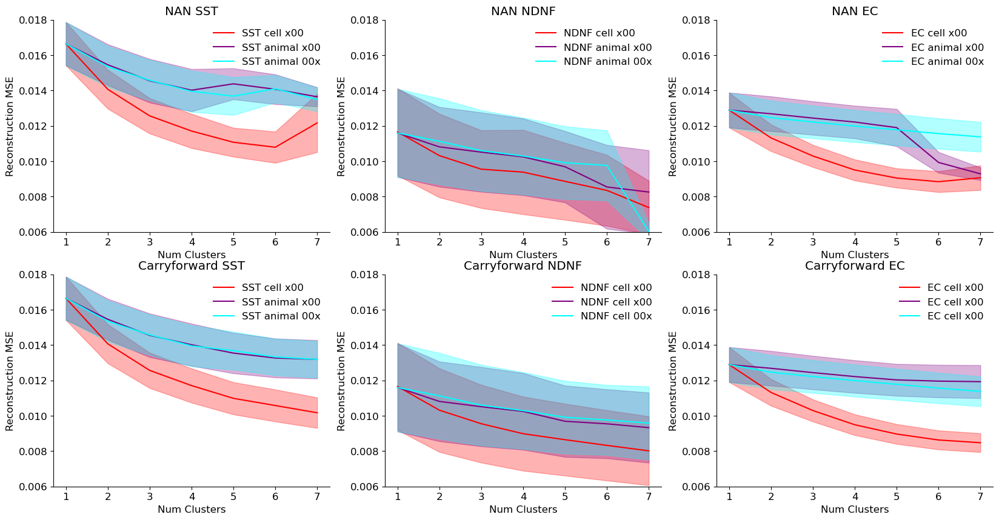

In [321]:
fig, axs = plt.subplots(2,3, figsize=(20,10))
axs[0,0].plot(mean_nan_cell_SST_kmeans_reassign_x00, color='red', label='SST cell x00')
axs[0,0].fill_between(range(len(mean_nan_cell_SST_kmeans_reassign_x00)), mean_nan_cell_SST_kmeans_reassign_x00 + sem_nan_cell_SST_kmeans_reassign_x00, mean_nan_cell_SST_kmeans_reassign_x00 - sem_nan_cell_SST_kmeans_reassign_x00, color='red', alpha=0.3)
axs[0,0].plot(mean_nan_animal_SST_kmeans_reassign_x00, color='purple', label='SST animal x00')
axs[0,0].fill_between(range(len(mean_nan_animal_SST_kmeans_reassign_x00)), mean_nan_animal_SST_kmeans_reassign_x00 + sem_nan_animal_SST_kmeans_reassign_x00, mean_nan_animal_SST_kmeans_reassign_x00 - sem_nan_animal_SST_kmeans_reassign_x00, color='purple', alpha=0.3)
axs[0,0].plot(mean_nan_animal_SST_kmeans_reassign_00x, color='cyan', label='SST animal 00x')
axs[0,0].fill_between(range(len(mean_nan_animal_SST_kmeans_reassign_00x)), mean_nan_animal_SST_kmeans_reassign_00x + sem_nan_animal_SST_kmeans_reassign_00x, mean_nan_animal_SST_kmeans_reassign_00x - sem_nan_animal_SST_kmeans_reassign_00x, color='cyan', alpha=0.3)
axs[0,0].set_title("NAN SST")
axs[0,0].set_xlabel("Num Clusters")
axs[0,0].set_ylabel("Reconstruction MSE")
axs[0,0].set_xticks(np.arange(7), np.arange(1,8))
axs[0,0].set_ylim(0.006, 0.018)
axs[0,0].legend()

axs[0,1].plot(mean_nan_cell_NDNF_kmeans_reassign_x00, color='red', label='NDNF cell x00')
axs[0,1].fill_between(range(len(mean_nan_cell_NDNF_kmeans_reassign_x00)), mean_nan_cell_NDNF_kmeans_reassign_x00 + sem_nan_cell_NDNF_kmeans_reassign_x00, mean_nan_cell_NDNF_kmeans_reassign_x00 - sem_nan_cell_NDNF_kmeans_reassign_x00, color='red', alpha=0.3)
axs[0,1].plot(mean_nan_animal_NDNF_kmeans_reassign_x00, color='purple', label='NDNF animal x00')
axs[0,1].fill_between(range(len(mean_nan_animal_NDNF_kmeans_reassign_x00)), mean_nan_animal_NDNF_kmeans_reassign_x00 + sem_nan_animal_NDNF_kmeans_reassign_x00, mean_nan_animal_NDNF_kmeans_reassign_x00 - sem_nan_animal_NDNF_kmeans_reassign_x00, color='purple', alpha=0.3)
axs[0,1].plot(mean_nan_animal_NDNF_kmeans_reassign_00x, color='cyan', label='NDNF animal 00x')
axs[0,1].fill_between(range(len(mean_nan_animal_NDNF_kmeans_reassign_00x)), mean_nan_animal_NDNF_kmeans_reassign_00x + sem_nan_animal_NDNF_kmeans_reassign_00x, mean_nan_animal_NDNF_kmeans_reassign_00x - sem_nan_animal_NDNF_kmeans_reassign_00x, color='cyan', alpha=0.3)
axs[0,1].set_title("NAN NDNF")
axs[0,1].set_xlabel("Num Clusters")
axs[0,1].set_ylabel("Reconstruction MSE")
axs[0,1].set_xticks(np.arange(7), np.arange(1,8))
axs[0,1].set_ylim(0.006, 0.018)
axs[0,1].legend()

axs[0,2].plot(mean_nan_cell_EC_kmeans_reassign_x00, color='red', label='EC cell x00')
axs[0,2].fill_between(range(len(mean_nan_cell_EC_kmeans_reassign_x00)), mean_nan_cell_EC_kmeans_reassign_x00 + sem_nan_cell_EC_kmeans_reassign_x00, mean_nan_cell_EC_kmeans_reassign_x00 - sem_nan_cell_EC_kmeans_reassign_x00, color='red', alpha=0.3)
axs[0,2].plot(mean_nan_animal_EC_kmeans_reassign_x00, color='purple', label='EC animal x00')
axs[0,2].fill_between(range(len(mean_nan_animal_EC_kmeans_reassign_x00)), mean_nan_animal_EC_kmeans_reassign_x00 + sem_nan_animal_EC_kmeans_reassign_x00, mean_nan_animal_EC_kmeans_reassign_x00 - sem_nan_animal_EC_kmeans_reassign_x00, color='purple', alpha=0.3)
axs[0,2].plot(mean_nan_animal_EC_kmeans_reassign_00x, color='cyan', label='EC animal 00x')
axs[0,2].fill_between(range(len(mean_nan_animal_EC_kmeans_reassign_00x)), mean_nan_animal_EC_kmeans_reassign_00x + sem_nan_animal_EC_kmeans_reassign_00x, mean_nan_animal_EC_kmeans_reassign_00x - sem_nan_animal_EC_kmeans_reassign_00x, color='cyan', alpha=0.3)
axs[0,2].set_title("NAN EC")
axs[0,2].set_xlabel("Num Clusters")
axs[0,2].set_ylabel("Reconstruction MSE")
axs[0,2].set_xticks(np.arange(7), np.arange(1,8))
axs[0,2].set_ylim(0.006, 0.018)
axs[0,2].legend()



axs[1,0].plot(mean_carry_cell_SST_kmeans_reassign_x00, color='red', label='SST cell x00')
axs[1,0].fill_between(range(len(mean_carry_cell_SST_kmeans_reassign_x00)), mean_carry_cell_SST_kmeans_reassign_x00 + sem_carry_cell_SST_kmeans_reassign_x00, mean_carry_cell_SST_kmeans_reassign_x00 - sem_carry_cell_SST_kmeans_reassign_x00, color='red', alpha=0.3)
axs[1,0].plot(mean_carry_animal_SST_kmeans_reassign_x00, color='purple', label='SST animal x00')
axs[1,0].fill_between(range(len(mean_carry_animal_SST_kmeans_reassign_x00)), mean_carry_animal_SST_kmeans_reassign_x00 + sem_carry_animal_SST_kmeans_reassign_x00, mean_carry_animal_SST_kmeans_reassign_x00 - sem_carry_animal_SST_kmeans_reassign_x00, color='purple', alpha=0.3)
axs[1,0].plot(mean_carry_animal_SST_kmeans_reassign_00x, color='cyan', label='SST animal 00x')
axs[1,0].fill_between(range(len(mean_carry_animal_SST_kmeans_reassign_00x)), mean_carry_animal_SST_kmeans_reassign_00x + sem_carry_animal_SST_kmeans_reassign_00x, mean_carry_animal_SST_kmeans_reassign_00x - sem_carry_animal_SST_kmeans_reassign_00x, color='cyan', alpha=0.3)
axs[1,0].set_title("Carryforward SST")
axs[1,0].set_xlabel("Num Clusters")
axs[1,0].set_ylabel("Reconstruction MSE")
axs[1,0].set_ylim(0.006, 0.018)
axs[1,0].set_xticks(np.arange(7), np.arange(1,8))
axs[1,0].legend()

axs[1,1].plot(mean_carry_cell_NDNF_kmeans_reassign_x00, color='red', label='NDNF cell x00')
axs[1,1].fill_between(range(len(mean_carry_cell_NDNF_kmeans_reassign_x00)), mean_carry_cell_NDNF_kmeans_reassign_x00 + sem_carry_cell_NDNF_kmeans_reassign_x00, mean_carry_cell_NDNF_kmeans_reassign_x00 - sem_carry_cell_NDNF_kmeans_reassign_x00, color='red', alpha=0.3)
axs[1,1].plot(mean_carry_animal_NDNF_kmeans_reassign_x00, color='purple', label='NDNF cell x00')
axs[1,1].fill_between(range(len(mean_carry_animal_NDNF_kmeans_reassign_x00)), mean_carry_animal_NDNF_kmeans_reassign_x00 + sem_carry_animal_NDNF_kmeans_reassign_x00, mean_carry_animal_NDNF_kmeans_reassign_x00 - sem_carry_animal_NDNF_kmeans_reassign_x00, color='purple', alpha=0.3)
axs[1,1].plot(mean_carry_animal_NDNF_kmeans_reassign_00x, color='cyan', label='NDNF cell 00x')
axs[1,1].fill_between(range(len(mean_carry_animal_NDNF_kmeans_reassign_00x)), mean_carry_animal_NDNF_kmeans_reassign_00x + sem_carry_animal_NDNF_kmeans_reassign_00x, mean_carry_animal_NDNF_kmeans_reassign_00x - sem_carry_animal_NDNF_kmeans_reassign_00x, color='cyan', alpha=0.3)
axs[1,1].set_title("Carryforward NDNF")
axs[1,1].set_xlabel("Num Clusters")
axs[1,1].set_ylabel("Reconstruction MSE")
axs[1,1].set_ylim(0.006, 0.018)
axs[1,1].set_xticks(np.arange(7), np.arange(1,8))
axs[1,1].legend()

axs[1,2].plot(mean_carry_cell_EC_kmeans_reassign_x00, color='red', label='EC cell x00')
axs[1,2].fill_between(range(len(mean_carry_cell_EC_kmeans_reassign_x00)), mean_carry_cell_EC_kmeans_reassign_x00 + sem_carry_cell_EC_kmeans_reassign_x00, mean_carry_cell_EC_kmeans_reassign_x00 - sem_carry_cell_EC_kmeans_reassign_x00, color='red', alpha=0.3)
axs[1,2].plot(mean_carry_animal_EC_kmeans_reassign_x00, color='purple', label='EC cell x00')
axs[1,2].fill_between(range(len(mean_carry_animal_EC_kmeans_reassign_x00)), mean_carry_animal_EC_kmeans_reassign_x00 + sem_carry_animal_EC_kmeans_reassign_x00, mean_carry_animal_EC_kmeans_reassign_x00 - sem_carry_animal_EC_kmeans_reassign_x00, color='purple', alpha=0.3)
axs[1,2].plot(mean_carry_animal_EC_kmeans_reassign_00x, color='cyan', label='EC cell x00')
axs[1,2].fill_between(range(len(mean_carry_animal_EC_kmeans_reassign_00x)), mean_carry_animal_EC_kmeans_reassign_00x + sem_carry_animal_EC_kmeans_reassign_00x, mean_carry_animal_EC_kmeans_reassign_00x - sem_carry_animal_EC_kmeans_reassign_00x, color='cyan', alpha=0.3)
axs[1,2].set_title("Carryforward EC")
axs[1,2].set_xlabel("Num Clusters")
axs[1,2].set_ylabel("Reconstruction MSE")
axs[1,2].set_ylim(0.006, 0.018)
axs[1,2].set_xticks(np.arange(7), np.arange(1,8))
axs[1,2].legend()

In [93]:
##################################################

In [384]:
animal_NDNF_00x_example_cluster_counts

array([6, 7, 6, 7])

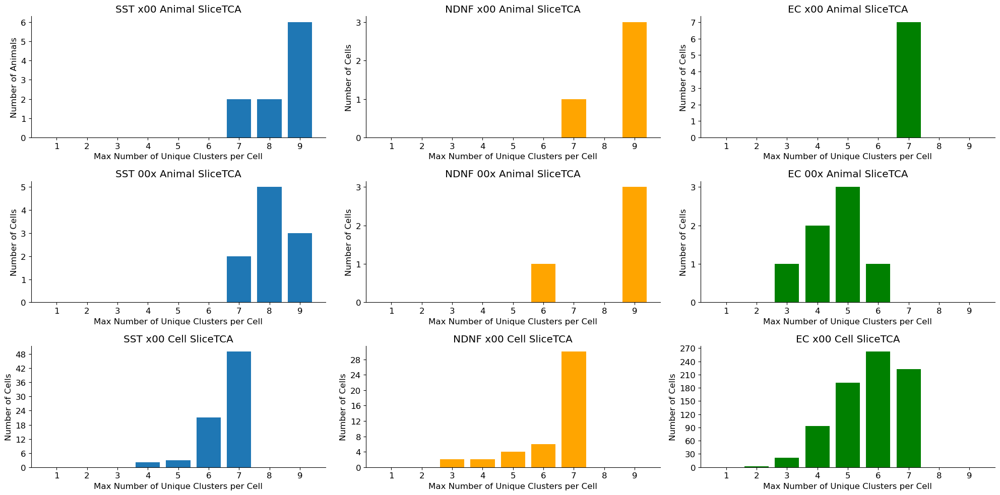

In [425]:

import numpy as np
import matplotlib.ticker as mticker 
# Full x-axis range you want for all plots
# cluster_range = np.arange(1, 8)  # 1 through 7

all_counts = (
    animal_SST_x00_example_cluster_counts +
    animal_NDNF_x00_example_cluster_counts +
    animal_EC_x00_example_cluster_counts +
    animal_SST_00x_example_cluster_counts +
    animal_NDNF_00x_example_cluster_counts +
    animal_EC_00x_example_cluster_counts +
    cell_SST_kmeans_reassign_x00_maxs +
    cell_NDNF_kmeans_reassign_x00_maxs +
    cell_EC_kmeans_reassign_x00_maxs
)

max_cluster_val = int(np.max(all_counts))
cluster_range = np.arange(1, max_cluster_val + 1)



def get_aligned_counts(data, full_range):
    unique_vals, counts = np.unique(data, return_counts=True)
    aligned_counts = np.zeros_like(full_range)
    for i, val in enumerate(full_range):
        if val in unique_vals:
            aligned_counts[i] = counts[np.where(unique_vals == val)[0][0]]
    return aligned_counts

# Align counts to full cluster range
counts_SST = get_aligned_counts(animal_SST_x00_example_cluster_counts, cluster_range)
counts_NDNF = get_aligned_counts(animal_NDNF_x00_example_cluster_counts, cluster_range)
counts_EC = get_aligned_counts(animal_EC_x00_example_cluster_counts, cluster_range)

# Plotting
fig, axs = plt.subplots(3, 3, figsize=(20, 10))


axs[0, 0].bar(cluster_range, counts_SST, tick_label=cluster_range)
axs[0, 0].set_xlabel("Max Number of Unique Clusters per Cell")
axs[0, 0].set_ylabel("Number of Animals")
axs[0, 0].set_title("SST x00 Animal SliceTCA")
axs[0, 0].set_xticks(cluster_range)

axs[0, 1].bar(cluster_range, counts_NDNF, tick_label=cluster_range, color='orange')
axs[0, 1].set_xlabel("Max Number of Unique Clusters per Cell")
axs[0, 1].set_ylabel("Number of Cells")
axs[0, 1].set_title("NDNF x00 Animal SliceTCA")
axs[0, 1].set_xticks(cluster_range)

axs[0, 2].bar(cluster_range, counts_EC, tick_label=cluster_range, color='green')
axs[0, 2].set_xlabel("Max Number of Unique Clusters per Cell")
axs[0, 2].set_ylabel("Number of Cells")
axs[0, 2].set_title("EC x00 Animal SliceTCA")
axs[0, 2].set_xticks(cluster_range)

counts_SST = get_aligned_counts(animal_SST_00x_example_cluster_counts, cluster_range)
counts_NDNF = get_aligned_counts(animal_NDNF_00x_example_cluster_counts, cluster_range)
counts_EC = get_aligned_counts(animal_EC_00x_example_cluster_counts, cluster_range)

axs[1, 0].bar(cluster_range, counts_SST, tick_label=cluster_range)
axs[1, 0].set_xlabel("Max Number of Unique Clusters per Cell")
axs[1, 0].set_ylabel("Number of Cells")
axs[1, 0].set_title("SST 00x Animal SliceTCA")
axs[1, 0].set_xticks(cluster_range)

axs[1, 1].bar(cluster_range, counts_NDNF, tick_label=cluster_range, color='orange')
axs[1, 1].set_xlabel("Max Number of Unique Clusters per Cell")
axs[1, 1].set_ylabel("Number of Cells")
axs[1, 1].set_title("NDNF 00x Animal SliceTCA")
axs[1, 1].set_xticks(cluster_range)

axs[1, 2].bar(cluster_range, counts_EC, tick_label=cluster_range, color='green')
axs[1, 2].set_xlabel("Max Number of Unique Clusters per Cell")
axs[1, 2].set_ylabel("Number of Cells")
axs[1, 2].set_title("EC 00x Animal SliceTCA")
axs[1, 2].set_xticks(cluster_range)

counts_cell_SST = get_aligned_counts(cell_SST_kmeans_reassign_x00_maxs, cluster_range)
counts_cell_NDNF = get_aligned_counts(cell_NDNF_kmeans_reassign_x00_maxs, cluster_range)
counts_cell_EC = get_aligned_counts(cell_EC_kmeans_reassign_x00_maxs, cluster_range)

axs[2, 0].bar(cluster_range, counts_cell_SST, tick_label=cluster_range)
axs[2, 0].set_xlabel("Max Number of Unique Clusters per Cell")
axs[2, 0].set_ylabel("Number of Cells")
axs[2, 0].set_title("SST x00 Cell SliceTCA")
axs[2, 0].set_xticks(cluster_range)

axs[2, 1].bar(cluster_range, counts_cell_NDNF, tick_label=cluster_range, color='orange')
axs[2, 1].set_xlabel("Max Number of Unique Clusters per Cell")
axs[2, 1].set_ylabel("Number of Cells")
axs[2, 1].set_title("NDNF x00 Cell SliceTCA")
axs[2, 1].set_xticks(cluster_range)

axs[2, 2].bar(cluster_range, counts_cell_EC, tick_label=cluster_range, color='green')
axs[2, 2].set_xlabel("Max Number of Unique Clusters per Cell")
axs[2, 2].set_ylabel("Number of Cells")
axs[2, 2].set_title("EC x00 Cell SliceTCA")
axs[2, 2].set_xticks(cluster_range)

for ax in axs.flatten():
    ax.set_xticks(cluster_range)
    ax.xaxis.set_major_locator(mticker.FixedLocator(cluster_range))
    ax.xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, _: f'{int(x)}'))

    ax.yaxis.set_major_locator(mticker.MaxNLocator(integer=True))


plt.tight_layout()
plt.show()


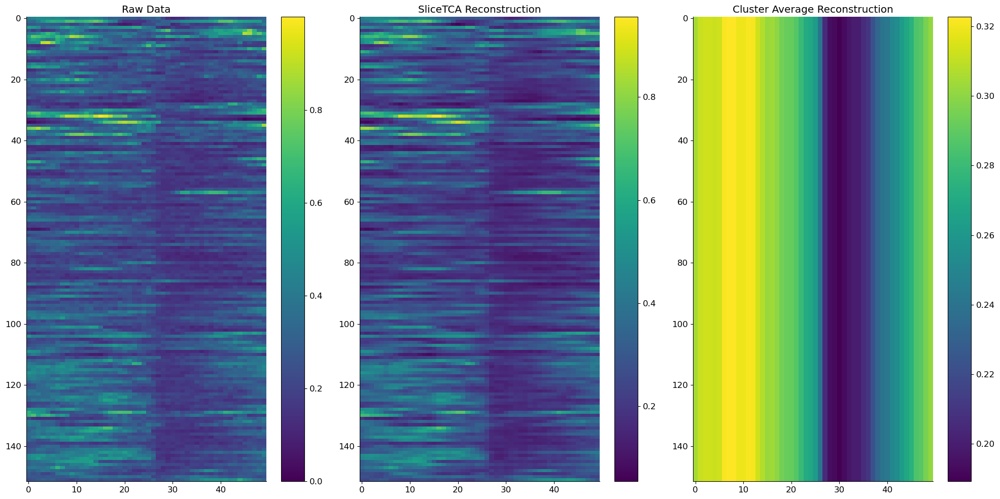

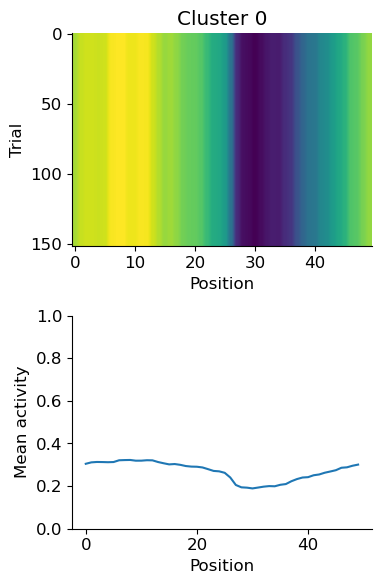

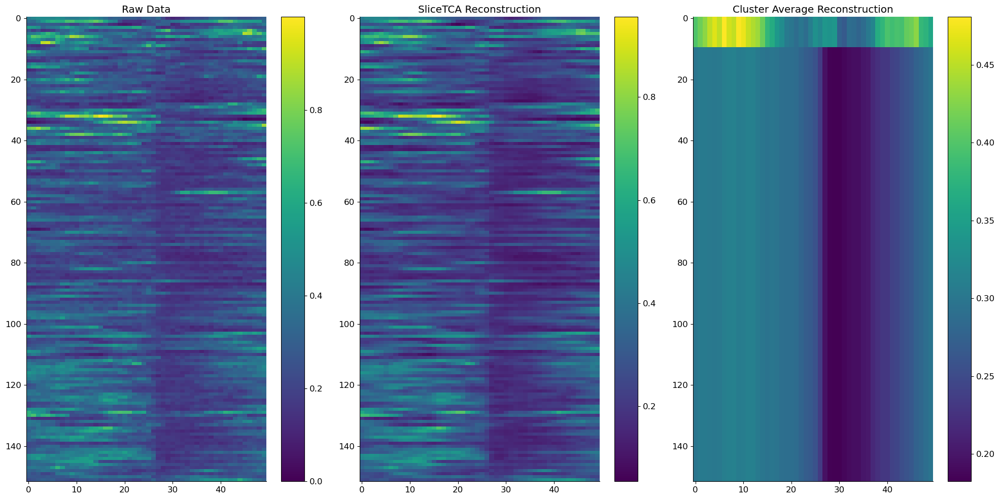

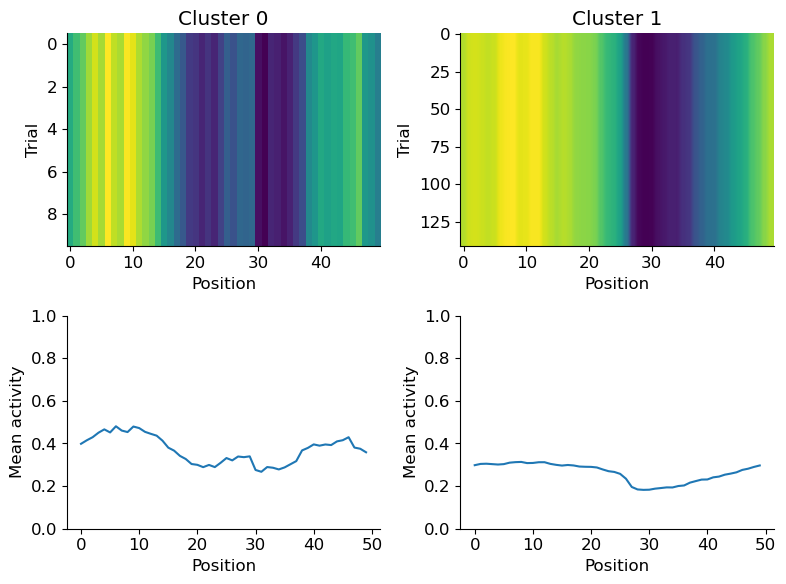

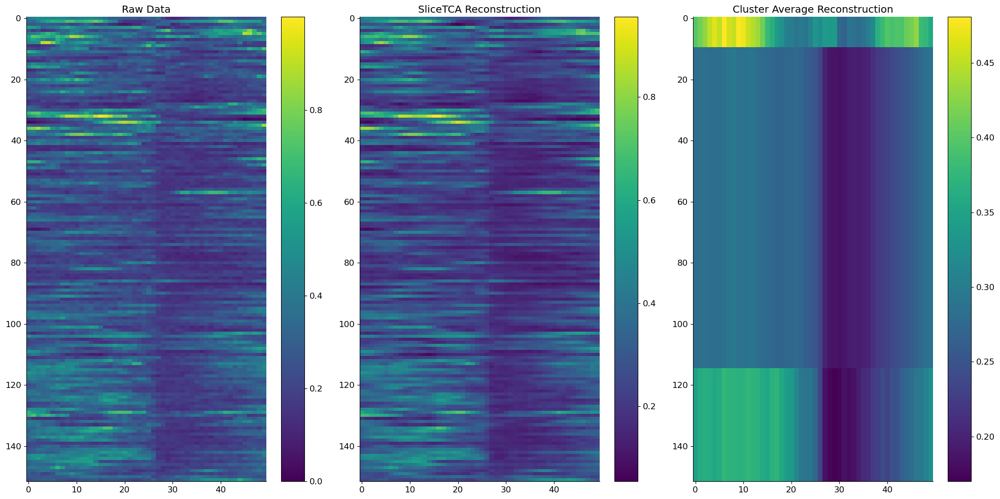

...

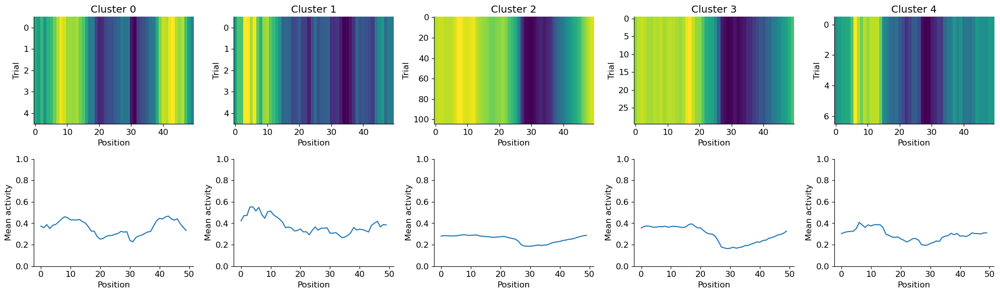

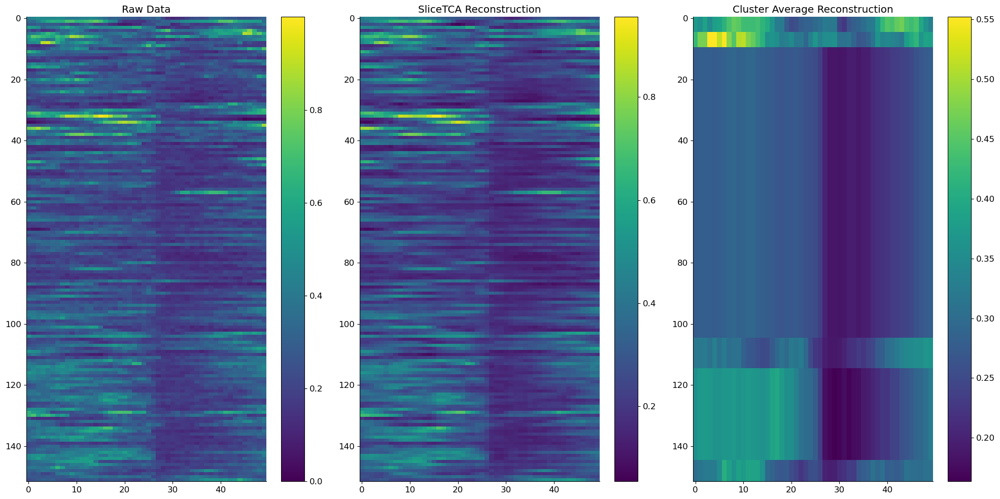

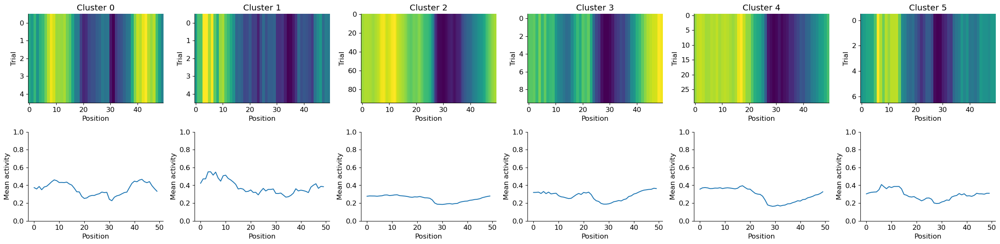

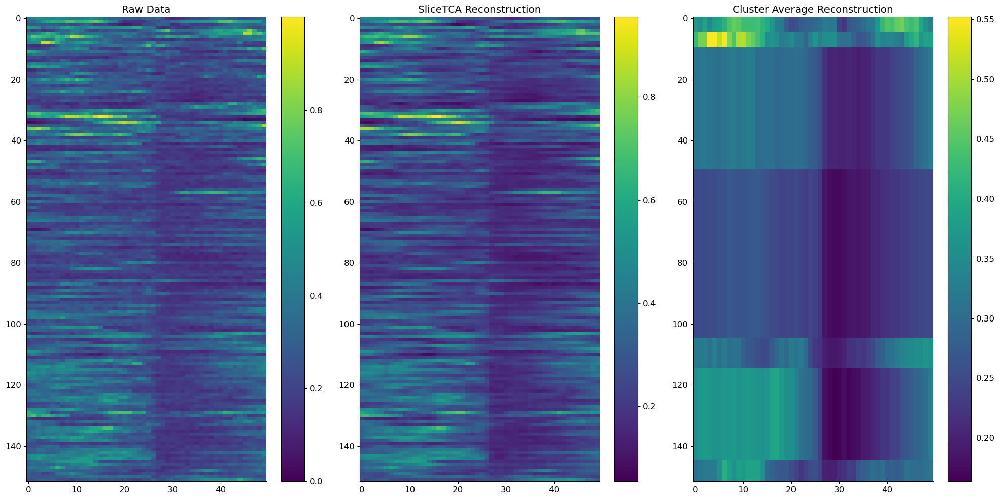

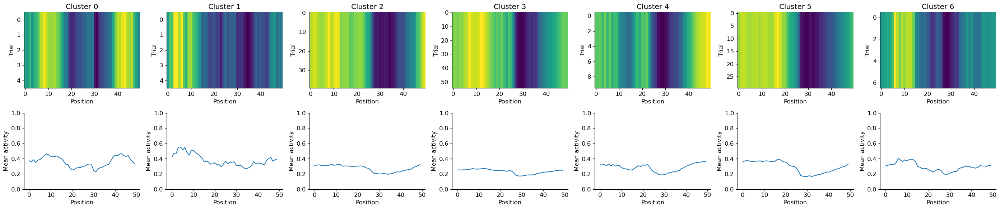

In [326]:
plot_per_cell_clustering_internals(cell_SST_model_ranks20_contig_x00, residual_activity_dict_SST, animal_id=1, cell_id=1)
   

In [707]:
def plot_per_cell_clustering_internals(cell_NDNF_model_ranks20_kmeans_reassign_umap_x00, residual_activity_dict_NDNF, animal_id=1, cell_id=1):
    tensor_list_by_animal_all_NDNF = []
    for animal in residual_activity_dict_NDNF:
        neural_data = ut.get_animal_neural_tensor(residual_activity_dict_NDNF, animal=animal)
        neural_data_tensor = torch.tensor(neural_data)
        # Normalize per cell
        for i in range(neural_data_tensor.shape[1]):
            cell = neural_data_tensor[:, i, :]
            min_val = cell.min()
            max_val = cell.max()
            neural_data_tensor[:, i, :] = (cell - min_val) / (max_val - min_val + 1e-8)
        tensor_list_by_animal_all_NDNF.append(neural_data_tensor)

    real_activity = tensor_list_by_animal_all_NDNF[animal_id][:,cell_id,:].detach().numpy()

    for culsters_chosen in cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["TCA_reconstructions_dict"]:
        TCA_reco = cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["TCA_reconstructions_dict"][culsters_chosen]

        animal_reco = cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["Recon_by_cluster_av_dict"][culsters_chosen]

        indices_dict = cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["indices_for_cluster_number"][culsters_chosen]

        fig, axs = plt.subplots(1,3, figsize = (20,10))
        im1 = (axs[0].imshow(real_activity, aspect='auto'))
        axs[0].set_title("Raw Data")
        fig.colorbar(im1, ax = axs[0])
        im2 = axs[1].imshow(TCA_reco, aspect='auto')
        fig.colorbar(im2, ax = axs[1])
        im3 = axs[2].imshow(animal_reco, aspect='auto')
        fig.colorbar(im3, ax = axs[2])
        axs[1].set_title("SliceTCA Reconstruction")
        axs[2].set_title("Cluster Average Reconstruction")
        plt.tight_layout()
        plt.show()


        num_clusters = len(indices_dict)
        fig, axs = plt.subplots(2, num_clusters, figsize=(num_clusters * 4, 6), squeeze=False)

        for n in range(num_clusters):
            indices = indices_dict[n]
            cluster = animal_reco[indices, :]  # trials x bins

            # Plot the cluster heatmap
            axs[0, n].imshow(cluster, aspect='auto')
            axs[0, n].set_title(f"Cluster {n}")
            axs[0, n].set_xlabel("Position")
            axs[0, n].set_ylabel("Trial")

            # Plot the cluster mean
            axs[1, n].plot(np.mean(cluster, axis=0))
            axs[1, n].set_xlabel("Position")
            axs[1, n].set_ylabel("Mean activity")
            axs[1, n].set_ylim(0, 1)

        plt.tight_layout()
        plt.show()
        


In [787]:
def plot_per_cell_clustering_internals_single_cluster(cell_NDNF_model_ranks20_kmeans_reassign_umap_x00, residual_activity_dict_NDNF, animal_id=1, cell_id=1, num_clusters=4):
    tensor_list_by_animal_all_NDNF = []
    for animal in residual_activity_dict_NDNF:
        neural_data = ut.get_animal_neural_tensor(residual_activity_dict_NDNF, animal=animal)
        neural_data_tensor = torch.tensor(neural_data)
        # Normalize per cell
        for i in range(neural_data_tensor.shape[1]):
            cell = neural_data_tensor[:, i, :]
            min_val = cell.min()
            max_val = cell.max()
            neural_data_tensor[:, i, :] = (cell - min_val) / (max_val - min_val + 1e-8)
        tensor_list_by_animal_all_NDNF.append(neural_data_tensor)

    real_activity = tensor_list_by_animal_all_NDNF[animal_id][:,cell_id,:].detach().numpy()

#     for culsters_chosen in cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["TCA_reconstructions_dict"]:
    
    TCA_reco = cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["TCA_reconstructions_dict"][f"clusters_chosen_{num_clusters}"]

    animal_reco = cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["Recon_by_cluster_av_dict"][f"clusters_chosen_{num_clusters}"]

    indices_dict = cell_NDNF_model_ranks20_kmeans_reassign_umap_x00[20][animal_id][cell_id][1][f"cell_{cell_id}"]["indices_for_cluster_number"][f"clusters_chosen_{num_clusters}"]

    fig, axs = plt.subplots(1,3, figsize = (20,10))
    im1 = (axs[0].imshow(real_activity, aspect='auto', vmin=0, vmax=1))
    axs[0].set_title("Raw Data")
    fig.colorbar(im1, ax = axs[0])
    im2 = axs[1].imshow(TCA_reco, aspect='auto', vmin=0, vmax=1)
    fig.colorbar(im2, ax = axs[1])
    im3 = axs[2].imshow(animal_reco, aspect='auto', vmin=0, vmax=1)
    fig.colorbar(im3, ax = axs[2])
    axs[1].set_title("SliceTCA Reconstruction")
    axs[2].set_title("Cluster Average Reconstruction")
    plt.tight_layout()
    plt.show()


    num_clusters = len(indices_dict)
    fig, axs = plt.subplots(2, num_clusters, figsize=(num_clusters * 4, 6), squeeze=False)

    for n in range(num_clusters):
        indices = indices_dict[n]
        cluster = real_activity[indices, :]  # trials x bins

        # Plot the cluster heatmap
        axs[0, n].imshow(cluster, aspect='auto', vmin=0, vmax=1)
        axs[0, n].set_title(f"Cluster {n}")
        axs[0, n].set_xlabel("Position")
        axs[0, n].set_ylabel("Trial")

        # Plot the cluster mean
        axs[1, n].plot(np.mean(cluster, axis=0))
        axs[1, n].set_xlabel("Position")
        axs[1, n].set_ylabel("Mean activity")
        axs[1, n].set_ylim(0, 1)

    plt.tight_layout()
    plt.show()
        


In [92]:
from scipy.stats import sem
import numpy as np

def get_cluster_MSE_for_plotting(internals_per_animal_dict, cell_or_animal="cell"):
    per_animal_list = []

    for animal in internals_per_animal_dict:
        cluster_keys = set()
        cell_dicts = internals_per_animal_dict[animal].values()

        for cell_dict in cell_dicts:
            MSE_dict = cell_dict["MSE_dict"] if cell_or_animal == "cell" else internals_per_animal_dict[animal]["MSE_dict"]
            cluster_keys.update(MSE_dict.keys())

        cluster_keys = sorted(cluster_keys)
        key_to_index = {key: i for i, key in enumerate(cluster_keys)}
        num_keys = len(cluster_keys)

        cell_MSE_matrix = []

        for cell in internals_per_animal_dict[animal]:
            if cell_or_animal == "cell":
                MSE_dict = internals_per_animal_dict[animal][cell]["MSE_dict"]
            else:
                MSE_dict = internals_per_animal_dict[animal]["MSE_dict"]

            row = np.full(num_keys, np.nan)
            for key, mse in MSE_dict.items():
                if key in key_to_index:  # just in case
                    idx = key_to_index[key]
                    row[idx] = mse
            cell_MSE_matrix.append(row)

        cell_MSE_matrix = np.array(cell_MSE_matrix)
        if cell_MSE_matrix.shape[1] == 0:
            print(f"⚠️ Skipping animal {animal} — no valid MSEs")
            continue

        mean_cell_activity = np.nanmean(cell_MSE_matrix, axis=0)
        per_animal_list.append(mean_cell_activity)

    if len(per_animal_list) == 0:
        raise ValueError("😭 No animals had valid MSEs to average!")

    per_animal_array = np.vstack(per_animal_list)
    print("Per-animal array shape:", per_animal_array.shape)

    mean_cluster = np.nanmean(per_animal_array, axis=0)
    sem_cluster = sem(per_animal_array, axis=0, nan_policy="omit")

    return mean_cluster, sem_cluster

In [101]:
import os
import re
import pickle

def get_model_data_per_cell(mse_dir):
    # More flexible pattern: ignore the cell type
    pattern = re.compile(r"MSE_.*?_cell_latent_(\d+)_animal(\d+)_cell_id(\d+)\.pkl")

    # Structure: {rank: {animal_id: {cell_id: mse_value}}}
    rank_mse_dict = {}

    for fname in os.listdir(mse_dir):
        if fname.endswith(".pkl"):
            match = pattern.match(fname)
            if match:
                rank = int(match.group(1))
                animal_id = int(match.group(2))
                cell_id = int(match.group(3))

                path = os.path.join(mse_dir, fname)
                with open(path, "rb") as f:
                    model_list = pickle.load(f)

                # Initialize nested dicts
                rank_mse_dict.setdefault(rank, {}).setdefault(animal_id, {})[cell_id] = model_list
            else:
                print(f"[Skipping] Unexpected filename format: {fname}")

    # Summary printout
    print(f"Loaded MSEs for {len(rank_mse_dict)} rank(s).")
    for rank, animal_dict in rank_mse_dict.items():
        print(f"  Rank {rank}:")
        for animal_id, cell_dict in animal_dict.items():
            print(f"    Animal {animal_id}: {len(cell_dict)} cells")

    return rank_mse_dict


In [65]:
def get_model_data_per_animal3(mse_dir, cell_type="EC"):
    import re
    import os
    import pickle

    # Pattern to extract rank and animal_id
    pattern = re.compile(fr"MSE_{cell_type}_animal_latent_(\d+)_animal(\d+)\.pkl")

    # Structure: {rank: {animal_id: model_list}}
    rank_mse_dict = {}

    for fname in os.listdir(mse_dir):
        if fname.endswith(".pkl"):
            match = pattern.match(fname)
            if match:
                rank = int(match.group(1))
                animal_id = int(match.group(2))

                path = os.path.join(mse_dir, fname)
                with open(path, "rb") as f:
                    model_list = pickle.load(f)

                # Proper way to assign value
                rank_mse_dict.setdefault(rank, {})[animal_id] = model_list
            else:
                print(f"[Skipping] Unexpected filename format: {fname}")

    # Summary printout
    print(f"Loaded MSEs for {len(rank_mse_dict)} rank(s).")
    for rank, animal_dict in rank_mse_dict.items():
        print(f"  Rank {rank}: {len(animal_dict)} animals loaded.")

    return rank_mse_dict

In [10]:
from scipy.spatial.distance import cdist
import numpy as np
import torch
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import ruptures as rpt

def get_animal_model_reconstruction_dict_mod(animal_model, tensor_for_animal, max_clusters=12, display=False, reassign_small_clusters=True, x00=True, use_umap=False, use_breakpoints=False):
    
    import warnings
    warnings.filterwarnings("ignore", category=UserWarning)
    warnings.filterwarnings("ignore", category=FutureWarning)

    per_cell_internals_dict = {}
    reconstruction_full_animal = animal_model.construct().numpy(force=True)

    if x00:
        w1 = animal_model.vectors[0][0].detach().numpy()
        X = np.abs(w1.T)
        if use_umap:
            import umap
            umap_model = umap.UMAP(n_components=3, random_state=0)
            X_umap = umap_model.fit_transform(X)
    else:
        f = animal_model.vectors[2][1].detach()
        f1 = f.permute(1, 0, 2).reshape(f.shape[1], -1)
        f1 = torch.abs(f1).cpu().numpy()
        if use_umap:
            import umap
            umap_model = umap.UMAP(n_components=3, random_state=0)
            X_umap = umap_model.fit_transform(f1)

    cluster_labels_dict = {}
    cluster_pca_dict = {}
    cluster_centroids_dict = {}

    for clusters_chosen in range(1, max_clusters):
        if use_breakpoints:
            print(f"Using breakpoint clustering (clusters = {clusters_chosen})")
            model_input = X_umap if use_umap else (X if x00 else f1)
            n_bkps = clusters_chosen - 1
            algo = rpt.Binseg(model="l2", min_size=3).fit(model_input)
            try:
                bkps = algo.predict(n_bkps=n_bkps)
            except rpt.exceptions.BadSegmentationParameters:
                print("  Skipping due to bad breakpoint config")
                continue

            labels = np.zeros(model_input.shape[0], dtype=int)
            start = 0
            for cluster_id, end in enumerate(bkps):
                labels[start:end] = cluster_id
                start = end

            centroids = np.array([
                model_input[labels == i].mean(axis=0)
                for i in range(clusters_chosen)
            ])
            X_pca = PCA(n_components=3).fit_transform(model_input)

        else:
            kmeans = KMeans(n_clusters=clusters_chosen, random_state=0)
            model_input = X_umap if use_umap else (X if x00 else f1)
            labels = kmeans.fit_predict(model_input)

            centroids = kmeans.cluster_centers_
            if use_umap:
                X_pca = PCA(n_components=3).fit_transform(X_umap)
            else:
                X_pca = PCA(n_components=3).fit_transform(model_input)

        cluster_labels_dict[clusters_chosen] = labels
        cluster_centroids_dict[clusters_chosen] = centroids
        cluster_pca_dict[clusters_chosen] = X_pca

    for cell in range(reconstruction_full_animal.shape[1]):
#     cell = 0
        print(f"Processing cell {cell}...")

        MSE_dict = {}
        x_pca_dict = {}
        labels_dict = {}
        indices_for_cluster_number = {}
        TCA_reconstructions_dict = {}
        Recon_by_cluster_av_dict = {}
        cluster_trial_mean_dict = {}

        reconstructed_cell = reconstruction_full_animal[:, cell, :]
        real_cell_activity = tensor_for_animal[:, cell, :].detach().numpy()

        for clusters_chosen in range(1, max_clusters):
            labels = cluster_labels_dict[clusters_chosen].copy()
            centroids = cluster_centroids_dict[clusters_chosen]
            X_pca = cluster_pca_dict[clusters_chosen]
            model_input = X_umap if use_umap else (X if x00 else f1)

            print(f"\nclusters_chosen = {clusters_chosen}")
            print("Before reassignment:")
            for cluster_id in range(clusters_chosen):
                count = np.sum(labels == cluster_id)
                print(f"  Cluster {cluster_id}: {count} trials")

            if reassign_small_clusters:
                if use_umap:
                    model_input = X_umap
                    centroid_space = np.array([
                        model_input[labels == i].mean(axis=0)
                        for i in range(clusters_chosen)])
                else:
                    model_input = X if x00 else f1
                    centroid_space = centroids
                for cluster_id in range(clusters_chosen):
                    trial_indices = np.where(labels == cluster_id)[0]
                    if len(trial_indices) < 2:
                        print(f"  Reassigning cluster {cluster_id} (size={len(trial_indices)})...")
                        for idx in trial_indices:
                            trial = model_input[idx]
                            dists = cdist([trial], centroid_space)[0]
                            dists[cluster_id] = np.inf
                            new_cluster = np.argmin(dists)
                            labels[idx] = new_cluster

            print("After reassignment:")
            for cluster_id in range(clusters_chosen):
                count = np.sum(labels == cluster_id)
                print(f"  Cluster {cluster_id}: {count} trials")

            x_pca_dict[f"clusters_chosen_{clusters_chosen}"] = X_pca
            labels_dict[f"clusters_chosen_{clusters_chosen}"] = labels

            valid_cluster_mean_trials_list = []
            valid_cluster_indices = []
            cluster_trial_indices = {}

            for n in range(clusters_chosen):
                trial_indices = np.where(labels == n)[0]
                cluster_trial_indices[n] = trial_indices
                if len(trial_indices) == 0:
                    continue
                cluster_trials = real_cell_activity[trial_indices, :]
                mean_cluster = cluster_trials.mean(axis=0)
                valid_cluster_mean_trials_list.append(mean_cluster)
                valid_cluster_indices.append((n, trial_indices))

            empty_cell = np.zeros_like(reconstructed_cell)
            for i, (n, trials) in enumerate(valid_cluster_indices):
                empty_cell[trials, :] = valid_cluster_mean_trials_list[i]

            key = f"clusters_chosen_{clusters_chosen}"
            MSE_dict[key] = np.mean((real_cell_activity - empty_cell) ** 2)
            Recon_by_cluster_av_dict[key] = empty_cell
            TCA_reconstructions_dict[key] = reconstructed_cell
            cluster_trial_mean_dict[key] = valid_cluster_mean_trials_list
            indices_for_cluster_number[key] = cluster_trial_indices

        per_cell_internals_dict[f"cell_{cell}"] = {
            "MSE_dict": MSE_dict,
            "x_pca_dict": x_pca_dict,
            "labels_dict": labels_dict,
            "indices_for_cluster_number": indices_for_cluster_number,
            "TCA_reconstructions_dict": TCA_reconstructions_dict,
            "Recon_by_cluster_av_dict": Recon_by_cluster_av_dict,
            "cluster_trial_mean_dict": cluster_trial_mean_dict,
        }

    return per_cell_internals_dict


In [106]:
import numpy as np
from scipy.stats import sem

def get_cell_mean_sem_plotting_cellTCA(cell_model_dict):
    animal_list = []

    for animal in cell_model_dict[20]:
        cell_cluster_mse_list = []

        for cell in cell_model_dict[20][animal]:
            cluster_list = []
            mse_dict = cell_model_dict[20][animal][cell][1][f"cell_{cell}"]["MSE_dict"]
    
            for cluster_chosen in mse_dict:
                mse = mse_dict[cluster_chosen]
                cluster_list.append(mse)

            cell_cluster_mse_list.append(cluster_list)

        max_len = max(len(lst) for lst in cell_cluster_mse_list)
        padded = np.array([
            lst + [np.nan] * (max_len - len(lst))
            for lst in cell_cluster_mse_list
        ])

        cell_average_array = np.nanmean(padded, axis=0)
        animal_list.append(cell_average_array)

    animal_array = np.array(animal_list)

    animal_mean = np.nanmean(animal_array, axis=0)
    animal_sem = sem(animal_array, axis=0, nan_policy="omit")

    return animal_mean, animal_sem


In [307]:
from scipy.stats import sem
import numpy as np

def fix_reassignment(cell_SST_kmeans_reassign_x00_dict, cell_SST_model_ranks20_kmeans_reassign_x00, carry_forward=False, use_cell=True, use_animal=False, odd_animal=False):
    animal_list = []

    for animal in cell_SST_kmeans_reassign_x00_dict:
        cell_list = []

        for cell in cell_SST_kmeans_reassign_x00_dict[animal]:
            max_clusters = cell_SST_kmeans_reassign_x00_dict[animal][cell]
            
            if odd_animal:
                MSE_dict = cell_SST_model_ranks20_kmeans_reassign_x00[animal][cell]['MSE_dict']
            
            if use_animal:
                MSE_dict = cell_SST_model_ranks20_kmeans_reassign_x00[20][animal][1][cell]["MSE_dict"]
                
            if use_cell:
                MSE_dict = cell_SST_model_ranks20_kmeans_reassign_x00[20][animal][cell][1][f"cell_{cell}"]["MSE_dict"]

            MSE_list = []
            for cluster in sorted(MSE_dict.keys(), key=lambda x: int(x.split("_")[-1])):
                MSE_list.append(MSE_dict[cluster])

            MSE_array = np.array(MSE_list, dtype=float)

            if max_clusters < len(MSE_array):
                if carry_forward:
                    MSE_array[max_clusters:] = MSE_array[max_clusters - 1]
                else:
                    MSE_array[max_clusters:] = np.nan

            cell_list.append(MSE_array)

        cell_array = np.array(cell_list)
        
        cell_array = np.array(cell_list)
        
        # Debug check for empty slices:
        for idx, arr in enumerate(cell_array):
            if np.isnan(arr).all():
                print(f"⚠️ Cell {idx} in animal {animal} has all-NaN MSE values!")

        cell_mean = np.nanmean(cell_array, axis=0)
        cell_mean = np.nanmean(cell_array, axis=0)
        animal_list.append(cell_mean)

    animal_array = np.array(animal_list)
    animal_mean = np.nanmean(animal_array, axis=0)
    animal_sem = sem(animal_array, axis=0, nan_policy='omit')

    print(animal_mean.shape)
    print(animal_sem.shape)
    return animal_mean, animal_sem



In [8]:
def get_model_data_per_animal(mse_dir, cell_type="EC"):

    # Pattern to extract rank and animal_id
    pattern = re.compile(fr"MSE_{cell_type}_cell_latent_(\d+)_animal(\d+)\.pkl")

    # Structure: {rank: {animal_id: model_list}}
    rank_mse_dict = {}

    for fname in os.listdir(mse_dir):
        if fname.endswith(".pkl"):
            match = pattern.match(fname)
            if match:
                rank = int(match.group(1))
                animal_id = int(match.group(2))

                path = os.path.join(mse_dir, fname)
                with open(path, "rb") as f:
                    model_list = pickle.load(f)

                # Proper way to assign value
                rank_mse_dict.setdefault(rank, {})[animal_id] = model_list
            else:
                print(f"[Skipping] Unexpected filename format: {fname}")

    # Summary printout
    print(f"Loaded MSEs for {len(rank_mse_dict)} rank(s).")
    for rank, animal_dict in rank_mse_dict.items():
        print(f"  Rank {rank}: {len(animal_dict)} animals loaded.")

    return rank_mse_dict

In [ ]:
def get_model_data_per_animal2(mse_dir, cell_type="EC"):
    import re
    import os
    import pickle

    # Pattern to extract rank and animal_id
    pattern = re.compile(fr"MSE_{cell_type}_animal_latent_(\d+)_animal(\d+)\.pkl")

    # Structure: {rank: {animal_id: model_list}}
    rank_mse_dict = {}

    for fname in os.listdir(mse_dir):
        if fname.endswith(".pkl"):
            match = pattern.match(fname)
            if match:
                rank = int(match.group(1))
                animal_id = int(match.group(2))

                path = os.path.join(mse_dir, fname)
                with open(path, "rb") as f:
                    model_list = pickle.load(f)

                # Proper way to assign value
                rank_mse_dict.setdefault(rank, {})[animal_id] = model_list
            else:
                print(f"[Skipping] Unexpected filename format: {fname}")

    # Summary printout
    print(f"Loaded MSEs for {len(rank_mse_dict)} rank(s).")
    for rank, animal_dict in rank_mse_dict.items():
        print(f"  Rank {rank}: {len(animal_dict)} animals loaded.")

    return rank_mse_dict

In [ ]:
def get_example_cluster_counts_cell(cell_SST_model_ranks20_kmeans_reassign_x00):
    max_clusters_per_cell = []

    max_clusters_dict = {}

    for animal in cell_SST_model_ranks20_kmeans_reassign_x00[20]:
        max_clusters_cell_dict = {}
        for cell in cell_SST_model_ranks20_kmeans_reassign_x00[20][animal]:
            labels_dict = cell_SST_model_ranks20_kmeans_reassign_x00[20][animal][cell][1][f"cell_{cell}"]["labels_dict"]
            new_max_unique = []
            for clusters_chosen in labels_dict:
                #                 print(f"labels_dict[clusters_chosen].shape {labels_dict[clusters_chosen].shape}")
                labels = labels_dict[clusters_chosen]
                unique_vals, counts = np.unique(labels, return_counts=True)

                num_unique = len(np.unique(labels_dict[clusters_chosen]))
                new_max_unique.append(num_unique)
            new_max_unique = np.array(new_max_unique)
            max_unique = np.max(new_max_unique)
            max_clusters_per_cell.append(max_unique)
            max_clusters_cell_dict[cell] = max_unique

        max_clusters_dict[animal] = max_clusters_cell_dict
        unique_counts = set(max_clusters_cell_dict.values())

    print(len(max_clusters_per_cell))

    return max_clusters_per_cell, max_clusters_dict


In [6]:
def get_model_data_per_animal2(mse_dir, cell_type="EC"):
    import re
    import os
    import pickle

    # Pattern to extract rank and animal_id
    pattern = re.compile(fr"MSE_{cell_type}_animal_latent_(\d+)_animal(\d+)\.pkl")

    # Structure: {rank: {animal_id: model_list}}
    rank_mse_dict = {}

    for fname in os.listdir(mse_dir):
        if fname.endswith(".pkl"):
            match = pattern.match(fname)
            if match:
                rank = int(match.group(1))
                animal_id = int(match.group(2))

                path = os.path.join(mse_dir, fname)
                with open(path, "rb") as f:
                    model_list = pickle.load(f)

                # Proper way to assign value
                rank_mse_dict.setdefault(rank, {})[animal_id] = model_list
            else:
                print(f"[Skipping] Unexpected filename format: {fname}")

    # Summary printout
    print(f"Loaded MSEs for {len(rank_mse_dict)} rank(s).")
    for rank, animal_dict in rank_mse_dict.items():
        print(f"  Rank {rank}: {len(animal_dict)} animals loaded.")

    return rank_mse_dict